In [1]:
import pandas as pd

pathData = "D:\MedData\Incidentes georreferenciados\Incidentes_georreferenciados_"
extension = ".csv"

In [2]:
incidentes2014 = pd.read_csv(pathData + "2014" + extension, parse_dates=['FECHA'], low_memory=False)
incidentes2015 = pd.read_csv(pathData + "2015" + extension, parse_dates=['FECHA'], low_memory=False)
incidentes2016 = pd.read_csv(pathData + "2016" + extension, parse_dates=['FECHA'], low_memory=False)
incidentes2017 = pd.read_csv(pathData + "2017" + extension, parse_dates=['FECHA'], low_memory=False)
incidentes2018 = pd.read_csv(pathData + "2018" + extension, parse_dates=['FECHA'], low_memory=False)
incidentes2019 = pd.read_csv(pathData + "2019" + extension, parse_dates=['FECHA'], low_memory=False)
incidentes2020 = pd.read_csv(pathData + "2020" + extension, parse_dates=['FECHA'], low_memory=False)

In [3]:
# Unir todos los dataframes
incidentes = pd.concat([incidentes2014,
                        incidentes2015,
                        incidentes2016,
                        incidentes2017,
                        incidentes2018,
                        incidentes2019,
                        incidentes2020]
                      )

In [4]:
# Guardar un archivo con toda la información de cada año de incidentes
incidentes.to_csv(pathData + "full" + extension, index=False)

In [5]:
# Limpirar la memoría del Jupyter Notebook
%reset -f

*****
# Análisis de los datos
#### Visualizar el data set
Dar una mirada a los datos a trabajar y su esquema es una buena forma de empezar el análisis de la información.

In [6]:
# import warnings
# warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (20,10)
from datetime import date

pathData = "D:\MedData\Incidentes georreferenciados\Incidentes_georreferenciados_"
extension = ".csv"

In [7]:
incidentes  = pd.read_csv(pathData + "full" + extension, low_memory=False)
incidentes.head()

,X,Y,OBJECTID,RADICADO,FECHA,HORA,DIA,PERIODO,CLASE,DIRECCION,...,COMUNA,DISENO,DIA_NOMBRE,MES,MES_NOMBRE,X_MAGNAMED,Y_MAGNAMED,LONGITUD,LATITUD,SHAPE
0,-75.602726,6.219016,211279,1423828,2014-01-01 00:00:00+00:00,02:20:00,1,2014,Choque,CR 80 CL 8,...,Belén,Tramo de via,MIÉRCOLES,1,NaN,831190.08,1179689.50,-75.602726,6.219016,NaN
1,-75.568185,6.260009,211280,1423839,2014-01-01 00:00:00+00:00,12:50:00,1,2014,Atropello,CR 53 CL 61,...,La Candelaria,Tramo de via,MIÉRCOLES,1,NaN,835013.63,1184223.79,-75.568185,6.260009,NaN
2,-75.549943,6.264765,211281,1423840,2014-01-01 00:00:00+00:00,01:00:00,1,2014,Atropello,CR 39 CL 70,...,Manrique,Tramo de via,MIÉRCOLES,1,NaN,837032.71,1184749.86,-75.549943,6.264765,NaN
3,-75.607611,6.234327,211282,1423849,2014-01-01 00:00:00+00:00,12:37:00,1,2014,Atropello,CL 32 CR 84,...,Belén,Tramo de via,MIÉRCOLES,1,NaN,830649.47,1181383.24,-75.607611,6.234327,NaN
4,-75.579685,6.299968,211283,1423890,2014-01-01 00:00:00+00:00,10:40:00,1,2014,Caída de Ocupante,CR 80 CL 101,...,Doce de Octubre,Tramo de via,MIÉRCOLES,1,NaN,833740.78,1188643.80,-75.579685,6.299968,NaN


In [8]:
print('El data set esta compuesto por%(columas)3d columnas de datos y %(registros)6d mil registros'\
      % {'columas':incidentes.shape[1],'registros':incidentes.shape[0]})

El data set esta compuesto por 25 columnas de datos y 299867 mil registros


Ahora vamos a ver la estructura del data set.

In [9]:
incidentes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299867 entries, 0 to 299866
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   X              287374 non-null  float64
 1   Y              287374 non-null  float64
 2   OBJECTID       299867 non-null  int64  
 3   RADICADO       299862 non-null  object 
 4   FECHA          299867 non-null  object 
 5   HORA           299867 non-null  object 
 6   DIA            299867 non-null  int64  
 7   PERIODO        299867 non-null  int64  
 8   CLASE          299861 non-null  object 
 9   DIRECCION      299867 non-null  object 
 10  DIRECCION_ENC  298548 non-null  object 
 11  CBML           277135 non-null  object 
 12  TIPO_GEOCOD    299867 non-null  object 
 13  GRAVEDAD       299867 non-null  object 
 14  BARRIO         276530 non-null  object 
 15  COMUNA         278610 non-null  object 
 16  DISENO         298583 non-null  object 
 17  DIA_NOMBRE     299867 non-nul

In [10]:
incidentes.memory_usage()

Index                128
X                2398936
Y                2398936
OBJECTID         2398936
RADICADO         2398936
FECHA            2398936
HORA             2398936
DIA              2398936
PERIODO          2398936
CLASE            2398936
DIRECCION        2398936
DIRECCION_ENC    2398936
CBML             2398936
TIPO_GEOCOD      2398936
GRAVEDAD         2398936
BARRIO           2398936
COMUNA           2398936
DISENO           2398936
DIA_NOMBRE       2398936
MES              2398936
MES_NOMBRE       2398936
X_MAGNAMED       2398936
Y_MAGNAMED       2398936
LONGITUD         2398936
LATITUD          2398936
SHAPE            2398936
dtype: int64

#### Distribución de los datos númericos

In [11]:
incidentes.describe()

,X,Y,OBJECTID,DIA,PERIODO,MES,X_MAGNAMED,Y_MAGNAMED,LONGITUD,LATITUD,SHAPE
count,287374.000000,287374.000000,299867.000000,299867.000000,299867.000000,299867.000000,299867.000000,2.998670e+05,299867.000000,299867.000000,0.0
mean,-75.587054,6.247631,438755.709321,15.648104,2016.781476,6.497897,832933.287424,1.182859e+06,-75.586978,6.247670,NaN
std,0.039145,0.035587,259360.132355,8.731776,1.901574,3.408043,4328.451566,3.903422e+03,0.039102,0.035290,NaN
min,-75.703816,5.661296,1.000000,1.000000,2014.000000,1.000000,820000.000000,1.118000e+06,-75.703816,5.661296,NaN
25%,-75.593015,6.226490,240073.500000,8.000000,2015.000000,3.000000,832289.575000,1.180518e+06,-75.592795,6.226508,NaN
50%,-75.576010,6.248349,514257.000000,16.000000,2017.000000,7.000000,834153.060000,1.182934e+06,-75.575959,6.248349,NaN
75%,-75.566005,6.268574,683052.500000,23.000000,2018.000000,9.000000,835264.190000,1.185170e+06,-75.565921,6.268563,NaN
max,-75.473437,6.368394,815522.000000,31.000000,2020.000000,12.000000,845502.630000,1.196215e+06,-75.473437,6.368394,NaN


La distribución de los datos númericos del set datos de incidentes no es representativo, ya que estos datos solo cualifican el tiempo y la georeferenciación del incidente ocurrido.
#### Rastreo de datos faltantes
El fin de este paso es verificar la cantidad de datos por cada columna, así nos daremos cuenta a que columna le faltan datos, ya que todas deberián tener la misma cantidad y sería igual al total de filas del data set.

In [12]:
incidentes.count()

X                287374
Y                287374
OBJECTID         299867
RADICADO         299862
FECHA            299867
HORA             299867
DIA              299867
PERIODO          299867
CLASE            299861
DIRECCION        299867
DIRECCION_ENC    298548
CBML             277135
TIPO_GEOCOD      299867
GRAVEDAD         299867
BARRIO           276530
COMUNA           278610
DISENO           298583
DIA_NOMBRE       299867
MES              299867
MES_NOMBRE        71174
X_MAGNAMED       299867
Y_MAGNAMED       299867
LONGITUD         299867
LATITUD          299867
SHAPE                 0
dtype: int64

Acontinuación vamos a analizar los datos, observando los datos faltantes columna x columna y que porcentaje de ausencia de datos representa en totalidad de los datos.

In [13]:
# Hallar la totalidad de los registros
total_registros = incidentes.OBJECTID.count()
# Contar la cantidad de filas vacias por cada columna y convertir este resultado en un Dataframe
df_null = pd.DataFrame(incidentes.isnull().sum())
# Renombrar la columna llamada 0
df_null.rename(columns={0:'Registros_Nulos'}, inplace=True)
# Crear una nueva columna vacia
df_null['Porcentaje'] = None
# Calcular el porcentaje de filas vacias 
df_null['Porcentaje'] = np.round(((df_null['Registros_Nulos']/total_registros) * 100),2)
# mostrar el dataframe
df_null

,Registros_Nulos,Porcentaje
X,12493,4.17
Y,12493,4.17
OBJECTID,0,0.00
RADICADO,5,0.00
FECHA,0,0.00
HORA,0,0.00
DIA,0,0.00
PERIODO,0,0.00
CLASE,6,0.00
DIRECCION,0,0.00


Se observa que las columnas llamadas: **MES_NOMBRE** y **SHAPE** tienen un alto porcentaje de datos faltantes, se opta por eliminar estas columnas, ya que si aplicamos la función "**dropna()**" de la librería pandas sin eliminar primero estas columnas, dicha función eliminaría todos los registros debido a que la columna llamada **SHAPE** tiene el 100% de ausencia en los datos.

Igualmente observamos que las columnas llamadas (**X**,**Y**,**LONGITUD**,**LATITUD**) tienen la misma información, por tal razón se eliminaran dos de estas columnas.

También, al examinar las columnas (**X_MAGNAMED**,**Y_MAGNAMED**) parecen tener relación con la información de georeferencia, por tal razón optamos por eliminarlas del set de datos.

También, eliminaremos la columna (**CBML**) ya que está es un código para distinguir un lote o parcela en la ciudad de [Medellín](https://geomedellin-m-medellin.opendata.arcgis.com/datasets/040e022660b14622a072915530f93cf9_8).

También, eliminaremos las columnas (**DIRECCION**, **DIRECCION_ENC**) del set de datos, ya que utilizaremos las columnas de información geográfica como son la (**LONGITUD**, **LATITUD**)

También, eliminaremos una de las columnas llamadas (**OBJECTID**, **RADICADO**) estás son identificadores unicos de cada incidente, por tal razón eliminaremos la columna **RADICADO** ya que tiene ausencia de datos y la otra columna **OBJECTID** la utilizaremos como identificador unico de cada fila.

In [14]:
# Eliminar las columnas con demasiados datos faltantes y/o descriminadas del set de datos a utilizar posteriormente
incidentes.drop(columns=['X','Y','MES_NOMBRE','SHAPE','X_MAGNAMED','Y_MAGNAMED',
                         'CBML','RADICADO','DIRECCION','DIRECCION_ENC'], 
                axis=1, inplace=True)

Ya habiendo eliminado estas columnas podemos aplicar el método de librería pandas para eliminar los registros con información faltante.

In [15]:
incidentes.dropna(inplace=True)

Damos una vista de nuevo al data set.

In [16]:
incidentes.head()

,OBJECTID,FECHA,HORA,DIA,PERIODO,CLASE,TIPO_GEOCOD,GRAVEDAD,BARRIO,COMUNA,DISENO,DIA_NOMBRE,MES,LONGITUD,LATITUD
0,211279,2014-01-01 00:00:00+00:00,02:20:00,1,2014,Choque,Malla vial aproximada: CR 81-7,HERIDO,Loma de los Bernal,Belén,Tramo de via,MIÉRCOLES,1,-75.602726,6.219016
1,211280,2014-01-01 00:00:00+00:00,12:50:00,1,2014,Atropello,Malla vial,HERIDO,Jesús Nazareno,La Candelaria,Tramo de via,MIÉRCOLES,1,-75.568185,6.260009
2,211281,2014-01-01 00:00:00+00:00,01:00:00,1,2014,Atropello,Malla vial,HERIDO,Manrique Oriental,Manrique,Tramo de via,MIÉRCOLES,1,-75.549943,6.264765
3,211282,2014-01-01 00:00:00+00:00,12:37:00,1,2014,Atropello,Malla vial,HERIDO,Las Mercedes,Belén,Tramo de via,MIÉRCOLES,1,-75.607611,6.234327
4,211283,2014-01-01 00:00:00+00:00,10:40:00,1,2014,Caída de Ocupante,Malla vial,HERIDO,Doce de Octubre No.2,Doce de Octubre,Tramo de via,MIÉRCOLES,1,-75.579685,6.299968


In [17]:
print('El data set esta compuesto por%(columas)3d columnas de datos y %(registros)6d mil registros'\
      % {'columas':incidentes.shape[1],'registros':incidentes.shape[0]})

El data set esta compuesto por 15 columnas de datos y 275356 mil registros


Ahora vamos a revisar si entre los datos existe información duplicada.

In [18]:
# Se realizar un group by por todas las columnas, 
# además renombra la columna creada con la cantidad de veces que esta cada fila
duplicados = incidentes.groupby(incidentes.columns.tolist()).size().reset_index().rename(columns={0:'registros'})
# Se listan todos los registros con cantidad de registros > 1
duplicados[duplicados['registros']>1]

,OBJECTID,FECHA,HORA,DIA,PERIODO,CLASE,TIPO_GEOCOD,GRAVEDAD,BARRIO,COMUNA,DISENO,DIA_NOMBRE,MES,LONGITUD,LATITUD,registros


La consulta anterior no arrojo registros, lo que nos indica que entre el data set no hay filas duplicadas.

Ahora, verificamos que en set de datos no haya información faltante.

In [19]:
incidentes.isnull().sum()

OBJECTID       0
FECHA          0
HORA           0
DIA            0
PERIODO        0
CLASE          0
TIPO_GEOCOD    0
GRAVEDAD       0
BARRIO         0
COMUNA         0
DISENO         0
DIA_NOMBRE     0
MES            0
LONGITUD       0
LATITUD        0
dtype: int64

### Análisis de Columnas Categoricas
#### Columna CLASE

In [20]:
pd.DataFrame(incidentes.groupby(['CLASE'])['OBJECTID'].count()).sort_values(by='OBJECTID')

,OBJECTID
CLASE,
Incendio,35
Caída de Ocupante,5590
Volcamiento,10184
Caida Ocupante,18394
Atropello,26327
Otro,29520
Choque,185306


Se observa que la categoría "**Caida Ocupante**" y "**Caída de Ocupante**" son la misma, pero estan escritas de forma diferente, por lo tanto vamos a unificarla con un solo valor.

In [21]:
# Reemplazar valores categoricos similares por un unico valor
incidentes.loc[(incidentes['CLASE']=='Caida Ocupante'),'CLASE'] = 'Caída de Ocupante'

Verificamos la actualización realizada

In [22]:
pd.DataFrame(incidentes.groupby(['CLASE'])['OBJECTID'].count()).sort_values(by='OBJECTID')

,OBJECTID
CLASE,
Incendio,35
Volcamiento,10184
Caída de Ocupante,23984
Atropello,26327
Otro,29520
Choque,185306


#### Columna TIPO_GEOCOD

In [23]:
pd.DataFrame(incidentes.groupby(['TIPO_GEOCOD'])['OBJECTID'].count()).sort_values(by='OBJECTID')

,OBJECTID
TIPO_GEOCOD,
Malla vial aproximada: CR 89-27,1
Malla vial aproximada: CL 96-75,1
Malla vial aproximada: CL 96-82,1
Malla vial aproximada: CR 73-32A,1
Malla vial aproximada: CL 97-22B,1
...,...
No Ubicada,1456
EPM con Interior,2669
EPM sin Interior,5750


Esta columna regresa demaisados registros "filas", indicando mucha diversidad de categorías, por este motivo la descartaré del set de datos.

In [24]:
incidentes.drop(columns=['TIPO_GEOCOD'], axis=1, inplace=True)

#### Columna GRAVEDAD

In [25]:
pd.DataFrame(incidentes.groupby(['GRAVEDAD'])['OBJECTID'].count()).sort_values(by='OBJECTID')

,OBJECTID
GRAVEDAD,
CON MUERTOS,136
MUERTO,294
CON HERIDOS,15209
SOLO DAÑOS,122812
HERIDO,136905


Esta columna tiene diferentes nombres de categorías de los incidentes **CON HERIDOS** y **CON MUERTOS**, por lo anterior actualizaremos estos registros a una unica categoría.

In [26]:
incidentes.loc[incidentes['GRAVEDAD']=='CON HERIDOS','GRAVEDAD'] = 'HERIDO'
incidentes.loc[incidentes['GRAVEDAD']=='CON MUERTOS','GRAVEDAD'] = 'MUERTO'

Verificamos la actualización realizada.

In [27]:
pd.DataFrame(incidentes.groupby(['GRAVEDAD'])['OBJECTID'].count()).sort_values(by='OBJECTID')

,OBJECTID
GRAVEDAD,
MUERTO,430
SOLO DAÑOS,122812
HERIDO,152114


#### Columna COMUNA

In [28]:
pd.DataFrame(incidentes.groupby(['COMUNA'])['OBJECTID'].count()).sort_values(by='OBJECTID')

,OBJECTID
COMUNA,
0,3
SN,4
Corregimiento De Altavista,10
AU,16
Corregimiento de San Sebastián de Palmitas,18
Corregimiento De Santa Elena,19
Corregimiento De San Cristóbal,32
Doce De Octubre,46
Corregimiento De San Antonio De Prado,79


Se examina la información y se opta por estandirazar en una sola categoría los nombres de comuna incorrectos como son (**0**,**SN**,**AU**,**In**).

In [29]:
incidentes.loc[incidentes['COMUNA'].isin(['0','SN','AU','In']),'COMUNA'] = 'Sin Inf'

Verificamos la actualización realizada.

In [30]:
pd.DataFrame(incidentes.groupby(['COMUNA'])['OBJECTID'].count()).sort_values(by='OBJECTID')

,OBJECTID
COMUNA,
Corregimiento De Altavista,10
Corregimiento de San Sebastián de Palmitas,18
Corregimiento De Santa Elena,19
Corregimiento De San Cristóbal,32
Doce De Octubre,46
Corregimiento De San Antonio De Prado,79
Corregimiento de Altavista,618
Corregimiento de Santa Elena,1000
Sin Inf,1635


#### Columna BARRIO

In [31]:
pd.DataFrame(incidentes.groupby(['BARRIO'])['OBJECTID'].count()).sort_values(by='OBJECTID')

,OBJECTID
BARRIO,
906,1
716,1
202,1
Travesías,1
819,1
...,...
Barrio Colón,4854
Perpetuo Socorro,5409
Campo Amor,5550


Esta columna regresa demaisados registros "filas", indicando mucha diversidad de categorías, por este motivo la descartaré del set de datos. Para hallar el barrio se inferira de la columna llamada **COMUNA**, columna que si utiilzaremos en set de datos.

In [32]:
incidentes.drop(columns='BARRIO', axis=1, inplace=True)

#### Columna DISENO

In [33]:
pd.DataFrame(incidentes.groupby(['DISENO'])['OBJECTID'].count()).sort_values(by='OBJECTID')

,OBJECTID
DISENO,
Pontón,29
Tunel,63
Via peatonal,63
Paso a Nivel,123
Paso Inferior,701
Puente,1021
Ciclo Ruta,1031
Paso Elevado,1395
Glorieta,6777


Esta categoria no tiene nombres que corregir.
#### Columna DIA_NOMBRE

In [34]:
pd.DataFrame(incidentes.groupby(['DIA_NOMBRE'])['OBJECTID'].count()).sort_values(by='OBJECTID')

,OBJECTID
DIA_NOMBRE,
DOMINGO,25928
LUNES,39546
SÁBADO,39612
JUEVES,41599
MIÉRCOLES,41902
MARTES,42974
VIERNES,43795


Esta categoría no tiene nombres que corregir.

Ahora, vamos a unir los campos **FECHA** y **HORA** del data set, con el fin de utilizar este dato como índice en el análisis descriptivo de la serie de tiempo.

In [35]:
# Eliminar los caracteres '00:00:00+00:00', tomando solo los primeros 10 caracteres del campo FECHA
incidentes['FECHA'] = incidentes['FECHA'].apply(lambda x: str(x)[0:10])
# Unir los dos campos
incidentes['Fecha_Hora'] = pd.DataFrame(incidentes['FECHA'].map(str) + ' ' + incidentes['HORA'])
# Convertir el nuevo campo como datetime
incidentes['Fecha_Hora'] = pd.to_datetime(incidentes['Fecha_Hora'])

Ahora, vamos a crear la columna **NOMBRE_MES**, la cual elimnamos previamente por falta de datos.

In [36]:
import datetime as dt
incidentes['NOMBRE_MES'] = incidentes['Fecha_Hora'].dt.strftime('%B')

In [37]:
def tranaslte_month(mes):
    dict_months = {
        'January': 'Enero',
        'February': 'Febrero',
        'March': 'Marzo',
        'April': 'Abril',
        'May': 'Mayo',
        'June': 'Junio',
        'July': 'Julio',
        'August': 'Agosto',
        'September': 'Septiembre',
        'October': 'Octubre',
        'November': 'Noviembre',
        'December': 'Diciembre'
    }
    return dict_months[mes]

In [38]:
incidentes['NOMBRE_MES'] = incidentes['NOMBRE_MES'].apply(lambda x: tranaslte_month(x))

### Modificar los tipos de datos de las columnas
Modificar el tipo de dato de las columnas según los valores contenidos en ellas, este ajuste tiene como finalidad reducir la memoria **RAM** que esta ocupa en la memoria física del sistema anfitrión, ya que si nuestro archivo pesa menos bytes, se optimizaran los recursos de maquina para los procesos siguientes.

In [39]:
incidentes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 275356 entries, 0 to 299866
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   OBJECTID    275356 non-null  int64         
 1   FECHA       275356 non-null  object        
 2   HORA        275356 non-null  object        
 3   DIA         275356 non-null  int64         
 4   PERIODO     275356 non-null  int64         
 5   CLASE       275356 non-null  object        
 6   GRAVEDAD    275356 non-null  object        
 7   COMUNA      275356 non-null  object        
 8   DISENO      275356 non-null  object        
 9   DIA_NOMBRE  275356 non-null  object        
 10  MES         275356 non-null  int64         
 11  LONGITUD    275356 non-null  float64       
 12  LATITUD     275356 non-null  float64       
 13  Fecha_Hora  275356 non-null  datetime64[ns]
 14  NOMBRE_MES  275356 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(4), object(

Convertir la columna **HORA** a tipo **time** y convertir la columa **FECHA** a tipo **date**.

In [40]:
incidentes['HORA'] = pd.to_datetime(incidentes['HORA'], format="%H:%M:%S").dt.time
incidentes['FECHA'] = pd.to_datetime(incidentes['FECHA'], format="%Y-%m-%d").dt.date

Vamos a modificar el tipo de dato de las columnas númericas, cuyos valores no superan el tipo de dato "**int64**" por un tipo adecuado a su contenido.

In [41]:
incidentes[["DIA", "PERIODO", "MES"]] = incidentes[["DIA", "PERIODO", "MES"]].apply(pd.to_numeric, downcast="signed")

Vamos a modificar el tipo de las columnas cuyo contenido es texto, pasaran de ser de tipo "**object**" a ser "**string**".

In [42]:
incidentes[['CLASE','GRAVEDAD','COMUNA','DISENO','DIA_NOMBRE','NOMBRE_MES']] =\
incidentes[['CLASE','GRAVEDAD','COMUNA','DISENO','DIA_NOMBRE','NOMBRE_MES']].astype('string')

Colocar las columnas categoricas a tipo categorico, para un almacenamiento más eficiente de las columnas de este tipo.

In [43]:
incidentes[['CLASE','GRAVEDAD','COMUNA','DISENO','DIA_NOMBRE','NOMBRE_MES']] =\
incidentes[['CLASE','GRAVEDAD','COMUNA','DISENO','DIA_NOMBRE','NOMBRE_MES']].astype('category')


Verificar que el cambio de los tipos de datos se haya realizado, además de ver si la memoria a usar rebajo.

In [44]:
incidentes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 275356 entries, 0 to 299866
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   OBJECTID    275356 non-null  int64         
 1   FECHA       275356 non-null  object        
 2   HORA        275356 non-null  object        
 3   DIA         275356 non-null  int8          
 4   PERIODO     275356 non-null  int16         
 5   CLASE       275356 non-null  category      
 6   GRAVEDAD    275356 non-null  category      
 7   COMUNA      275356 non-null  category      
 8   DISENO      275356 non-null  category      
 9   DIA_NOMBRE  275356 non-null  category      
 10  MES         275356 non-null  int8          
 11  LONGITUD    275356 non-null  float64       
 12  LATITUD     275356 non-null  float64       
 13  Fecha_Hora  275356 non-null  datetime64[ns]
 14  NOMBRE_MES  275356 non-null  category      
dtypes: category(6), datetime64[ns](1), float64(2), int1

Observamos que los tipos de datos del set de datos han cambiado y que el tamaño del set de datos a disminuido desde su construcción líneas arriba, inicialmente tenía **57.2 MB**, luego paso a **33.6 MB** y finalmente quedo en **17.3 MB**. Ahora con la eliminación de las columnas y el cambio de los tipos de datos y creación de nuevas columnas, tenemos una rebaja del **69.7%** de la memoria a usar.

Ahora, vamos a cambiar el orden de las columnas.

In [45]:
incidentes = incidentes.reindex(columns=['Fecha_Hora','OBJECTID','FECHA','HORA','PERIODO','MES','NOMBRE_MES','DIA','DIA_NOMBRE','CLASE','GRAVEDAD','COMUNA','DISENO','LONGITUD','LATITUD'])

Veamos como quedo el data set con todos los ajustes realizados.

In [46]:
incidentes.head()

,Fecha_Hora,OBJECTID,FECHA,HORA,PERIODO,MES,NOMBRE_MES,DIA,DIA_NOMBRE,CLASE,GRAVEDAD,COMUNA,DISENO,LONGITUD,LATITUD
0,2014-01-01 02:20:00,211279,2014-01-01,02:20:00,2014,1,Enero,1,MIÉRCOLES,Choque,HERIDO,Belén,Tramo de via,-75.602726,6.219016
1,2014-01-01 12:50:00,211280,2014-01-01,12:50:00,2014,1,Enero,1,MIÉRCOLES,Atropello,HERIDO,La Candelaria,Tramo de via,-75.568185,6.260009
2,2014-01-01 01:00:00,211281,2014-01-01,01:00:00,2014,1,Enero,1,MIÉRCOLES,Atropello,HERIDO,Manrique,Tramo de via,-75.549943,6.264765
3,2014-01-01 12:37:00,211282,2014-01-01,12:37:00,2014,1,Enero,1,MIÉRCOLES,Atropello,HERIDO,Belén,Tramo de via,-75.607611,6.234327
4,2014-01-01 10:40:00,211283,2014-01-01,10:40:00,2014,1,Enero,1,MIÉRCOLES,Caída de Ocupante,HERIDO,Doce de Octubre,Tramo de via,-75.579685,6.299968


Ya que hemos terminado de análizar los datos vamos a generar un nuevo archivo **.CSV** con la información transformada y seleccionada. Esto es con el fin de utilizar este archivo en las siguientes secciones ya preparado y no tener que hacer ningún ajuste a la información y sea usado solo para el análisis de la información.

In [47]:
incidentes.to_csv(pathData + "all" + extension, index=False)

Eliminamos toda la memoría del **Jupyter Notebook** e iniciamos una nueva sección. Esto eliminará todas las variables utilizadas hasta ahora.

In [48]:
# borrar todas las variables en IPython - Sin confirmación del usuario
%reset -f 

****
# Análisis Descriptivo

In [49]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (20,10)
import folium
import seaborn as sns

cm = sns.light_palette("green", as_cmap=True)

pathData = "D:\MedData\Incidentes georreferenciados\Incidentes_georreferenciados_"
extension = ".csv"

# periodos = range(2014,2021,1)
periodos = [2014,2015,2016,2017,2018,2019,2020]

Abrir el set de datos depurado y generado en la sección análisis de los datos.

In [52]:
incidentes = pd.read_csv(pathData + "all" + extension, parse_dates=['Fecha_Hora'], index_col=['Fecha_Hora'])
incidentes

,OBJECTID,FECHA,HORA,PERIODO,MES,NOMBRE_MES,DIA,DIA_NOMBRE,CLASE,GRAVEDAD,COMUNA,DISENO,LONGITUD,LATITUD
Fecha_Hora,,,,,,,,,,,,,,
2014-01-01 02:20:00,211279,2014-01-01,02:20:00,2014,1,Enero,1,MIÉRCOLES,Choque,HERIDO,Belén,Tramo de via,-75.602726,6.219016
2014-01-01 12:50:00,211280,2014-01-01,12:50:00,2014,1,Enero,1,MIÉRCOLES,Atropello,HERIDO,La Candelaria,Tramo de via,-75.568185,6.260009
2014-01-01 01:00:00,211281,2014-01-01,01:00:00,2014,1,Enero,1,MIÉRCOLES,Atropello,HERIDO,Manrique,Tramo de via,-75.549943,6.264765
2014-01-01 12:37:00,211282,2014-01-01,12:37:00,2014,1,Enero,1,MIÉRCOLES,Atropello,HERIDO,Belén,Tramo de via,-75.607611,6.234327
2014-01-01 10:40:00,211283,2014-01-01,10:40:00,2014,1,Enero,1,MIÉRCOLES,Caída de Ocupante,HERIDO,Doce de Octubre,Tramo de via,-75.579685,6.299968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-03-02 06:50:00,815518,2020-03-02,06:50:00,2020,3,Marzo,2,LUNES,Atropello,HERIDO,Popular,Lote o Predio,-75.550848,6.288293
2020-01-15 07:00:00,815519,2020-01-15,07:00:00,2020,1,Enero,15,MIÉRCOLES,Choque,SOLO DAÑOS,Laureles Estadio,Interseccion,-75.587973,6.254189
2020-01-18 04:30:00,815520,2020-01-18,04:30:00,2020,1,Enero,18,SÁBADO,Choque,HERIDO,Belén,Tramo de via,-75.576866,6.232463


Se crean funciones que seran utilizadas durante esta sección con el set de datos llamado incidentes.

In [53]:
# https://stackoverflow.com/questions/8924173/how-do-i-print-bold-text-in-python
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

def highlight_max(s):
    '''
    highlight the maximum in a Series green.
    '''
    is_max = s == s.max()
    return ['background-color: green' if v else '' for v in is_max]

def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}%\n({:d})".format(pct, absolute)

# https://naps.com.mx/blog/python-distribucion-de-variables/
def distribucion_variable_categorica(col):
    incidentes[col].value_counts(ascending=True,normalize=True).tail(20).plot.barh()
    plt.show()
    
# https://naps.com.mx/blog/python-distribucion-de-variables/
from scipy import stats
def normalidad_variable_numerica(col):
    stats.probplot(incidentes[col], plot=plt)
    plt.xlabel('Diagrama de Probabilidad(normal) de la variable {}'.format(col))
    plt.show()
    

def distribution_variable(col):
    distribution = incidentes[col].value_counts(ascending=False,normalize=True).to_dict()
    values = incidentes[col].value_counts().to_dict()
    return pd.DataFrame({'Registros':values,'Distribución':distribution})

def distribution_statistics_data(col):
    distribution = incidentes[col].value_counts(ascending=False,normalize=True).to_dict()
    values = incidentes[col].value_counts().to_dict()    
    
    simetria = incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0)\
                         .skew(axis=0).to_dict()
    kurtosis = incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0)\
                         .kurt(axis=0).to_dict()
    promedio = incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0)\
                         .mean(axis=0).to_dict()
    mediana  = incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0)\
                         .median(axis=0).to_dict()
    desvstan = incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0)\
                         .std(axis=0).to_dict()
    varianza = incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0)\
                         .var(axis=0).to_dict()
    df_ds = {'Registros':values,
             'Distribución':distribution,
             'Promedio':promedio,
             'Mediana':mediana,
             'Varianza':varianza,
             'Desv. Estandar':desvstan,
             'Simetría':simetria,
             'Kurtosis':kurtosis
            }
    return pd.DataFrame(df_ds)

def distribution_statistics_graph(col):
    incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0).hist()
    
def generate_descriptive_statistics(col):
    return incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0).describe()

def generate_boxplot(col,subplots=True):
    return incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0)\
                     .plot.box(subplots=subplots)

# https://likegeeks.com/es/matrix-correlacion-python/
def generate_correlation_graph(col):
    df_x_dia_corr =\
    incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0).corr()
    sns.heatmap(df_x_dia_corr, annot = True)
    plt.show()
    
def generate_graph_type(col, freq, kind, categories):  
    df_col = incidentes.pivot_table(index=incidentes.index, 
                           columns=[col], 
                           values='OBJECTID', 
                           aggfunc='count', 
                           fill_value=0).sort_index()
    
    df_col = df_col.resample(freq)[categories].sum()
    
    if(kind == 'plot'):    
        df_col.plot(subplots=True)
    elif(kind =='corr'):
        sns.heatmap(df_col.corr(), annot = True)
        plt.show()
        
def geneate_graph_type_two_colums(col1,col2,fkey,idx,freq,kind):
    df_col1 = incidentes\
        .pivot_table(index=incidentes.index, columns=[col1], values='OBJECTID',  aggfunc='count',  fill_value=0)\
        .reset_index()

    df_col2 = incidentes\
        .pivot_table(index=incidentes.index, columns=[col2],  values='OBJECTID', aggfunc='count', fill_value=0)\
        .reset_index()

    df_col = df_col1.merge(df_col2, left_on=fkey, right_on=fkey).set_index(idx)

    categories = df_col.columns


    df_col = df_col.resample(freq)[categories].sum()

    if(kind == 'plot'):    
        df_col.plot(subplots=True)
    elif(kind =='corr'):
        sns.heatmap(df_col.corr(), annot = True)
        plt.show()

# https://naps.com.mx/blog/python-distribucion-de-variables/
def verify_normal_test(col):
    df_col = incidentes.pivot_table(index='FECHA', columns=col, values='OBJECTID', aggfunc='count', fill_value=0)
    _, pval = stats.normaltest(df_col)

    cols = df_col.columns.to_list()

    print(color.BOLD + 'La columna {} y sus categorías:\n'.format(col) + color.END)
    for x in range(0,len(cols),1):
        if(pval[x] < 0.05):
            print(color.BOLD + "{} -> ".format(cols[x]) + color.RED  + "NO" + color.END + \
                  " sigue una distribución normal, su pValor es: {}".format(pval[x]))
        else:
            print("{} -> ".format(cols[x]) + color.BOLD + "SI"+ color.END  + \
                  " sigue una distribución normal, su pValor es: {}\n".format(pval[x]))
            
def create_data_in_wide_format():
    """
    Crear data frame de formato ancho con las columnas categoricas del set de datos de incidentes.
    Retorna: un nuevo data frame en formato ancho
    """
    df_clase = incidentes\
        .pivot_table(index=incidentes.index, columns=['CLASE'], values='OBJECTID', aggfunc='count', fill_value=0)\
        .reset_index()

    df_gravedad = incidentes\
        .pivot_table(index=incidentes.index, columns=['GRAVEDAD'], values='OBJECTID', aggfunc='count', fill_value=0)\
        .reset_index()

    df_diseno = incidentes\
        .pivot_table(index=incidentes.index, columns=['DISENO'], values='OBJECTID', aggfunc='count', fill_value=0)\
        .reset_index()

    df_comuna = incidentes\
        .pivot_table(index=incidentes.index, columns=['COMUNA'], values='OBJECTID', aggfunc='count', fill_value=0)\
        .reset_index()

    df_clase_gravedad = df_clase.merge(df_gravedad, left_on='Fecha_Hora', right_on='Fecha_Hora')
    df_clase_gravedad_diseno = df_clase_gravedad.merge(df_diseno, left_on='Fecha_Hora', right_on='Fecha_Hora')
    df_clase_gravedad_diseno_comuna = df_clase_gravedad_diseno.merge(df_comuna,left_on='Fecha_Hora',right_on='Fecha_Hora')

    df_clase_gravedad_diseno_comuna.set_index('Fecha_Hora', inplace=True)
    
    return df_clase_gravedad_diseno_comuna

# Invocar la función convierte el data set en formato ancho
incidentes_wide = create_data_in_wide_format()

# https://naps.com.mx/blog/python-distribucion-de-variables/
from scipy import stats
def normalidad_variable_numerica(col):
    stats.probplot(incidentes_wide[col], plot=plt)
    plt.xlabel('Diagrama de Probabilidad(normal) de la variable {}'.format(col))
    plt.show()


## Análisis de Columnas Categoricas
### Resumen Columna CLASE
A continuación veremos información de la columna **CLASE** como esta distribuida la cantidad de incidentes por cada una de sus categorías con una frecuencia diaria. Además se anexa un grafico de distribución de cada categoría y un grafico boxplot.

In [54]:
distribution_statistics_data('CLASE')

,Registros,Distribución,Promedio,Mediana,Varianza,Desv. Estandar,Simetría,Kurtosis
Choque,185306,0.672969,74.241186,79.0,545.328580,23.352271,-0.604862,-0.193138
Otro,29520,0.107207,11.826923,11.0,26.451796,5.143131,0.842371,1.487755
Atropello,26327,0.095611,10.547676,10.0,16.918768,4.113243,0.225009,0.058199
Caída de Ocupante,23984,0.087102,9.608974,9.0,20.148440,4.488701,0.671609,0.999631
Volcamiento,10184,0.036985,4.080128,3.0,8.468928,2.910142,1.429014,3.445352
Incendio,35,0.000127,0.014022,0.0,0.013831,0.117607,8.271077,66.463977


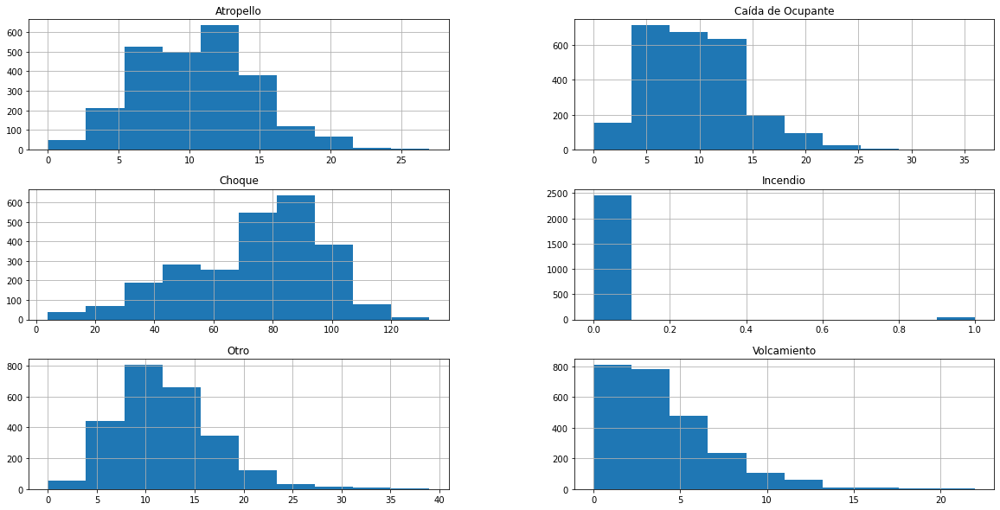

In [55]:
distribution_statistics_graph('CLASE')

Ahora vamos a aplicar una validación de si una variable tiene distribución normal, en la que se graficara y si tiene un comportamiento a una línea recta a un angulo de 45 grados es por que tiene dicha distribución normal.

Aplicaremos esto a las columnas **Atropello** y **Choque** de la columna **Clase** ya que según los histogramas anteriores son las que nos generan el interrogante si tiene este comportamiento.

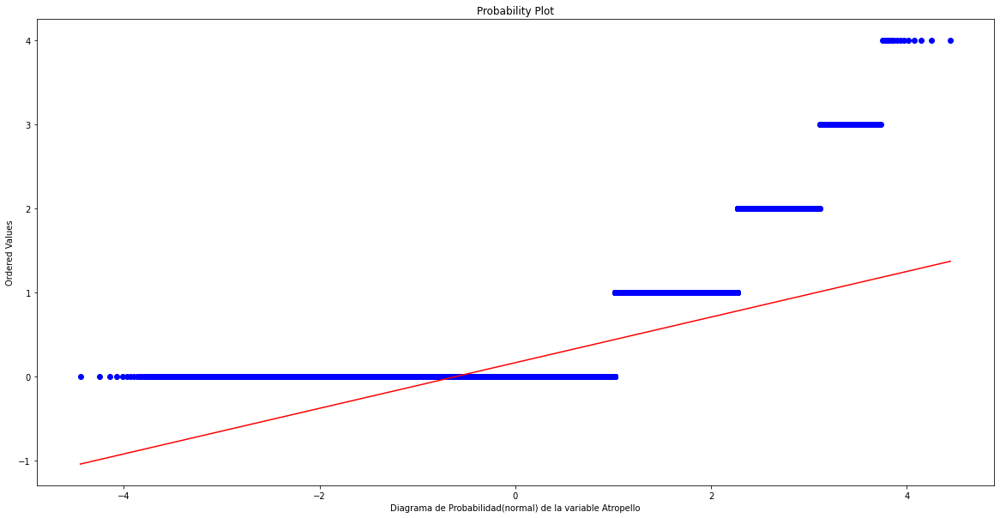

In [56]:
normalidad_variable_numerica('Atropello')

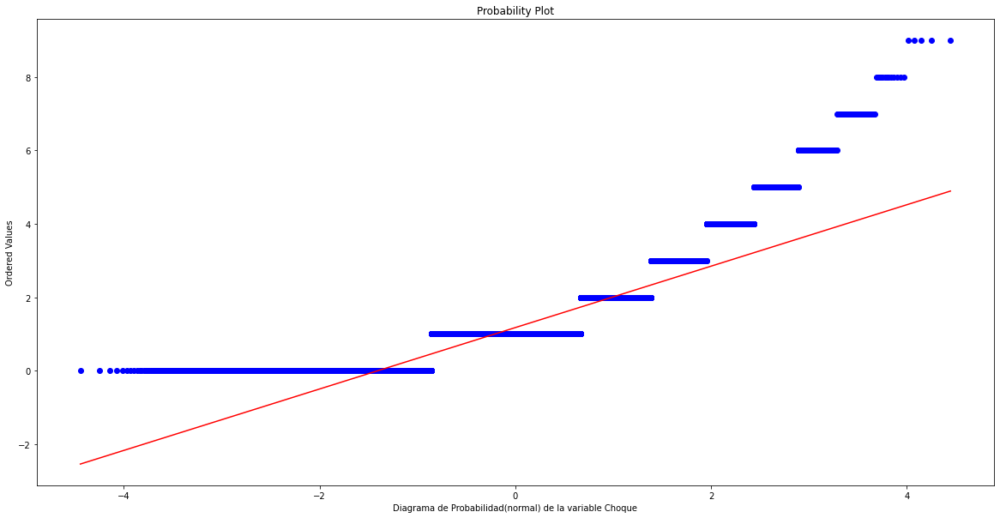

In [57]:
normalidad_variable_numerica('Choque')

A continuación haremos otra prueba de normalidad de los datos.
Si su valor pVal es menor o mayor al 0.05 dicha variable no tiene este comportamiento.

In [58]:
verify_normal_test('CLASE')

La columna CLASE y sus categorías:

Atropello -> NO sigue una distribución normal, su pValor es: 2.6905125775823747e-05
Caída de Ocupante -> NO sigue una distribución normal, su pValor es: 1.3455046643836208e-45
Choque -> NO sigue una distribución normal, su pValor es: 3.219949139465924e-30
Incendio -> NO sigue una distribución normal, su pValor es: 0.0
Otro -> NO sigue una distribución normal, su pValor es: 2.2170050788124604e-68
Volcamiento -> NO sigue una distribución normal, su pValor es: 4.5801579207399145e-152


In [59]:
generate_descriptive_statistics('CLASE')

CLASE,Atropello,Caída de Ocupante,Choque,Incendio,Otro,Volcamiento
count,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000
mean,10.547676,9.608974,74.241186,0.014022,11.826923,4.080128
std,4.113243,4.488701,23.352271,0.117607,5.143131,2.910142
min,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000
25%,8.000000,6.000000,58.000000,0.000000,8.000000,2.000000
50%,10.000000,9.000000,79.000000,0.000000,11.000000,3.000000
75%,13.000000,12.000000,91.000000,0.000000,15.000000,5.000000
max,27.000000,36.000000,133.000000,1.000000,39.000000,22.000000


Atropello               AxesSubplot(0.125,0.125;0.110714x0.755)
Caída de Ocupante    AxesSubplot(0.257857,0.125;0.110714x0.755)
Choque               AxesSubplot(0.390714,0.125;0.110714x0.755)
Incendio             AxesSubplot(0.523571,0.125;0.110714x0.755)
Otro                 AxesSubplot(0.656429,0.125;0.110714x0.755)
Volcamiento          AxesSubplot(0.789286,0.125;0.110714x0.755)
dtype: object

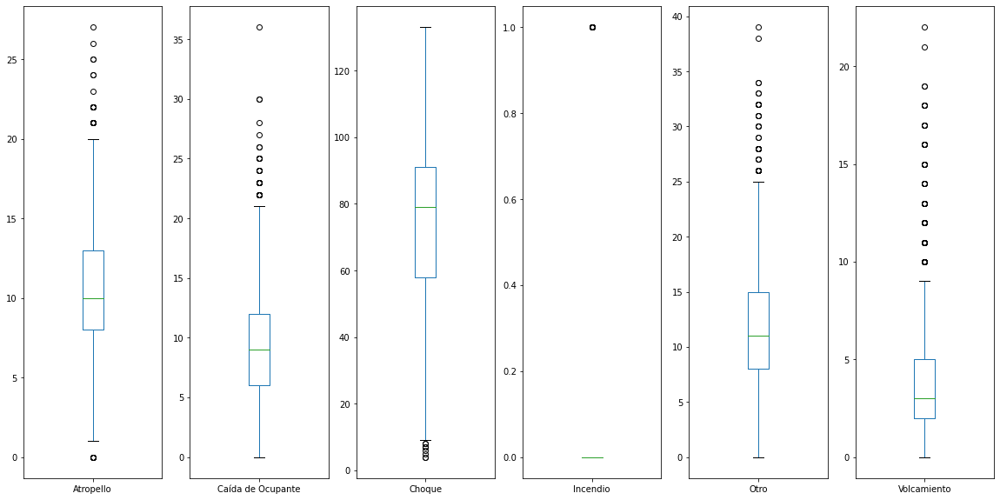

In [60]:
generate_boxplot('CLASE')

En el [diagrama de caja](https://es.wikipedia.org/wiki/Diagrama_de_caja) anterior se puede observar lo siguiente:
- Cada categoría posee varios valores atipicos o [outliers](https://es.wikipedia.org/wiki/Valor_at%C3%ADpico) y redundantes.
- La categoría "**CHOQUE**" es el incidente automovilistico que más se presenta y su [RIC](https://es.wikipedia.org/wiki/Rango_intercuart%C3%ADlico) oscila entre 58 y 91 incidentes diarios. 
- Todas las categorías excepto "**CHOQUE**" tiene que su incidencia tienden a no supuerar los 25 incidentes diarios.
- La categoría "**Incendio**" podría catalogarce como un incidente aislado, ya no su media es 0 y esta representado como un outliers. 

A continuación veremos otro resumen de la columna **CLASE** de como esta distribuida la cantidad de incidentes por cada uno de los periodos que conforman el data set. Además se anexan algunas nuevas columnas de tendencia central como es el promedio o media.

In [61]:
# Crear data frame con la información resumida para columna CLASE
incidentes_periodo = incidentes.pivot_table(index='PERIODO', 
                                            columns=['CLASE'], 
                                            values='OBJECTID', 
                                            aggfunc='count', 
                                            fill_value=0).T

# Anexar las columnas calculadas al set de datos resumido
incidentes_periodo['Total Fila'] = incidentes_periodo.sum(axis=1)
incidentes_periodo['Porcentaje'] =\
np.round(((incidentes_periodo['Total Fila'] / incidentes_periodo['Total Fila'].sum()) * 100),2)

# Anexar la fila con el total por cada columna
sums = pd.DataFrame(incidentes_periodo.select_dtypes(np.number).sum().rename('Total Columna'))
incidentes_periodo = incidentes_periodo.append(np.round(sums,2).T)

# Listar los datos ordenados por total de la fila
incidentes_periodo.sort_values(by='Total Fila').style.format('{:,.2f}')

PERIODO,2014,2015,2016,2017,2018,2019,2020,Total Fila,Porcentaje
Incendio,8.00,1.00,4.00,4.00,7.00,8.00,3.00,35.00,0.01
Volcamiento,959.00,"1,429.00","1,478.00","1,570.00","1,171.00","1,607.00","1,970.00","10,184.00",3.70
Caída de Ocupante,"4,117.00","3,664.00","3,657.00","3,422.00","3,603.00","3,518.00","2,003.00","23,984.00",8.71
Atropello,"4,647.00","4,340.00","4,038.00","3,536.00","3,497.00","3,971.00","2,298.00","26,327.00",9.56
Otro,"4,490.00","4,209.00","4,854.00","4,711.00","3,733.00","4,510.00","3,013.00","29,520.00",10.72
Choque,"26,978.00","28,073.00","28,460.00","29,029.00","28,064.00","28,808.00","15,894.00","185,306.00",67.30
Total Columna,"41,199.00","41,716.00","42,491.00","42,272.00","40,075.00","42,422.00","25,181.00","275,356.00",100.00


#### Observaciones
Según la definición de [Clases de Incidentes](https://www.educacionbogota.edu.co/portal_institucional/sites/default/files/inline-files/Anexo%2011%20protocolo_atencion_siniestros_viales_Establecimientos_edu.pdf)
se observa lo siguiente: 

- La categoría "**Choque**" es el incidente más representativo con un valor del **67.3%**, está cantidad se puede presentar por la falta de aplicar varias normas del **código nacional de transito terrestre** como son: superar los límites de velocidad ([artículo 106](https://leyes.co/codigo_nacional_de_transito_terrestre/106.htm) y [artículo 107](https://leyes.co/codigo_nacional_de_transito_terrestre/107.htm)), respetar la distancia entre vehículos,  estar distraido al conducir.
- La categoría "**Otro**" a pesar que según su definición es poco frecuente que se presente, es el **2do** más representativo con un **10.72%**, creo que al momento de evaluar el incidente de transito se debería verificar bien su clase ya que no hay una concordancia entre su definición y la cantidad de incidetes registrados en esta clase.
- La categoría "**Atropello**" para mí es la más delicada, ya que es cuando un vehículo y un peatón se ven involucrados. Ubicada en el **3er** puesto con un **9.56%**. Siendo el peatón el más afectado. Más adelante combinaremos este con la otra columna categorica llamda **GRAVEDAD** y observar cuantos de estos terminaron con el peatón muerto.
- La categoría "**Caída de Ocupante**" con un **8.71%**, podría realizar una hipotesis de que se debe a que los ocupantes del vehículo no se colocan el cinturón de seguridad. Lo que significa que un promedio de **9** personas cada día sufren esta clase incidente de transito en la ciudad de Medellín por no tener el cinturón de seguridad puesto. A pesar de que el [artículo 82](https://leyes.co/codigo_nacional_de_transito_terrestre/82.htm#:~:text=Art%C3%ADculo%2082.,Cintur%C3%B3n%20de%20seguridad&text=Es%20obligatorio%20el%20uso%20del,territorio%20nacional%2C%20incluyendo%20las%20urbanas.) del **código nacional de transito terrestre** indica que el uso cinturón de seguridad es obligatorió.
- La categoría "**Volcamiento**" con un **3.70%** correspondientes a 959 incidentes, lo que significa que aproximadamente cada **3** días hay un vehículo volcado en la ciudad de Medellín.
- La categoría "**Incendio**" se puede observar que es un incidente que se presenta exporadicamente, con de picos en los años 2014 y 2019.

Todo lo anterior beneficia a la industría de autopartes de la ciudad y mal para las aseguradoras por pago pólizas y el [SOAT](https://fasecolda.com/ramos/soat/preguntas-frecuentes/) de estos incidentes.

A continuación veremos otro resumen de la columna **CLASE** de como esta distribuida la cantidad de incidentes por cada uno de los meses que conforman el data set. Además se anexan algunas nuevas columnas de tendencia central como es el promedio o media.

In [62]:
# Crear data frame con la información resumida para columna CLASE
incidentes_mes_clase = incidentes.pivot_table(index='MES', 
                                            columns=['CLASE'], 
                                            values='OBJECTID', 
                                            aggfunc='count', 
                                            fill_value=0).T

# Anexar las columnas calculadas al set de datos resumido
incidentes_mes_clase['Total Fila'] = incidentes_mes_clase.sum(axis=1)
incidentes_mes_clase['Porcentaje'] =\
np.round(((incidentes_mes_clase['Total Fila'] / incidentes_mes_clase['Total Fila'].sum()) * 100),2)

subset = incidentes['MES'].unique() 

incidentes_mes_clase\
    .sort_values(by='Total Fila')\
    .style\
        .apply(highlight_max, subset=subset, axis=1)\
        .format('{:,}')

MES,1,2,3,4,5,6,7,8,9,10,11,12,Total Fila,Porcentaje
CLASE,,,,,,,,,,,,,,
Incendio,3,2,4,2,2,1,1,5,5,6,2,2,35,0.01
Volcamiento,712,809,797,734,808,836,940,990,984,"1,124",750,700,"10,184",3.7
Caída de Ocupante,"1,987","1,981","2,264","1,835","2,068","1,805","1,972","2,257","2,172","2,066","1,831","1,746","23,984",8.71
Atropello,"2,152","2,319","2,383","2,002","2,182","2,141","2,255","2,287","2,341","2,284","1,908","2,073","26,327",9.56
Otro,"2,428","2,512","2,474","2,145","2,622","2,440","2,664","2,710","2,669","2,636","2,107","2,113","29,520",10.72
Choque,"14,296","16,265","15,700","14,405","15,613","14,849","15,761","16,640","16,604","16,684","13,838","14,651","185,306",67.3


En la tabla resumen anterior se puede observar el acumulado por mes y en que mes se presenta la mayor cantidad por cada categoría de la columna **CLASE**. Ahora vasmos a gráficarlo.

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001B2E5F7C688>,
      dtype=object)

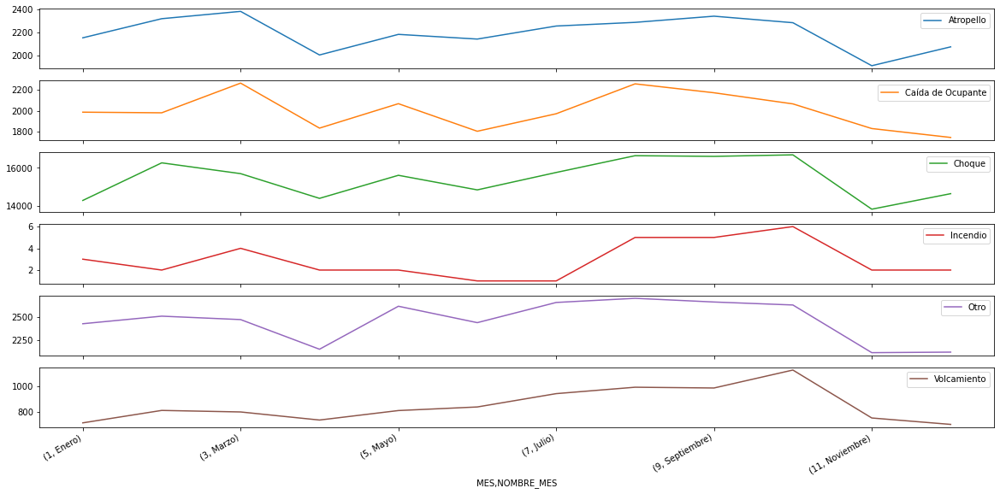

In [63]:
incidente_x_mes_clase = incidentes.pivot_table(index=['MES','NOMBRE_MES'], 
                       columns=['CLASE'], 
                       values='OBJECTID', 
                       aggfunc='count', 
                       fill_value=0).sort_index()
incidente_x_mes_clase.plot(subplots=True)

En el gráfico anterior podemos observar.

- Todas las categorías aumentan en el segundo semestre como ya lo habiamos mencionado previamente.
- Que el en el mes **Noviembre** de caen los datos por la ausencia de información que tiene el repositorio del año 2020.

#### Graficar la información de la columna CLASE

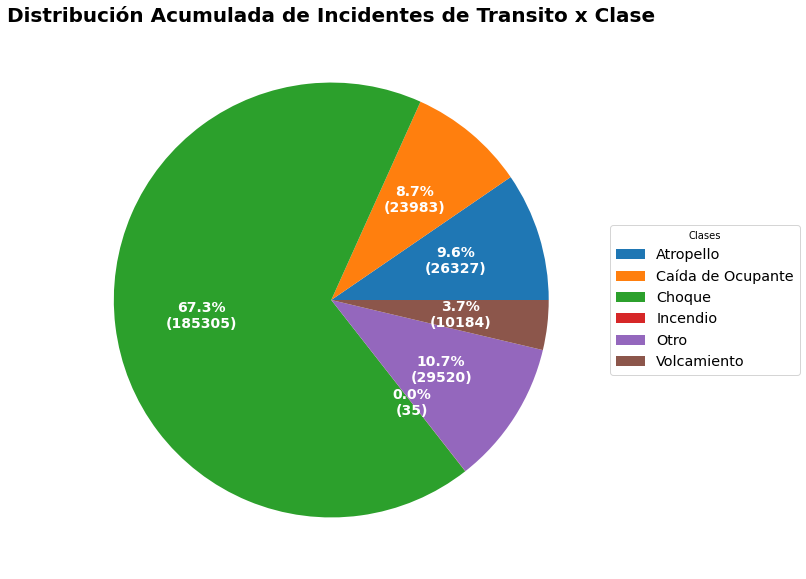

In [64]:
fig, ax = plt.subplots()

# Crear data frame con la columa "Total Fila"
data = incidentes_periodo['Total Fila']
# Extraer la fila con indice "Total Columna"
bad_col = data.index.isin(['Total Columna'])
data = data[~bad_col]

wedges, texts, autotexts = ax.pie(data, 
                                  autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w")
                                 )

ax.legend(wedges, data.index,
          title="Clases",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1),
          fontsize = 'x-large'
         )

plt.setp(autotexts, size=14, weight="bold")
ax.set_title("Distribución Acumulada de Incidentes de Transito x Clase", size=20, weight="bold")
plt.show()

#### Correlación entre las categorías de la columna CLASE
Ahora graficaremos la correlación entre las categorías de la columna **CLASE** de forma **mensual**, ahora dejaré que el lector o lectora cambien el 2do parámetro en diferentes frecuencias de tiempo [Diario=**D**, Mensual=**M**, Anual=**A**] y puedan analizar si hay alguna diferencia entre estos diferentes rangos de tiempo.

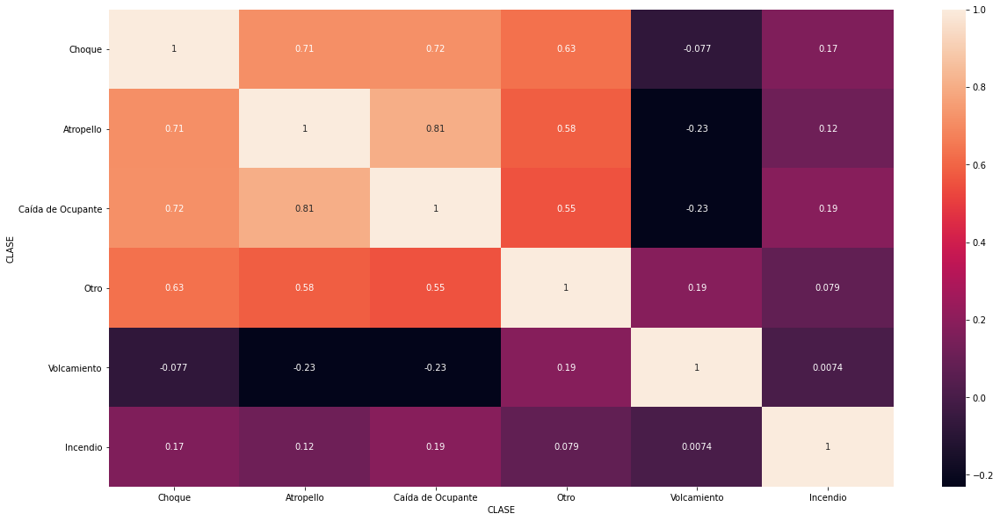

In [65]:
generate_graph_type('CLASE','M','corr',incidentes['CLASE'].unique().tolist())

En el grafico de correlación mensual se puede observar lo siguiente:

- Existe una alta relación entre las categorías **Atropello** y **Caída de Ocupante** con el valor más alto de **0.81**.
- Le sigue una alta relación entre las categorías **Caída de Ocupante** y **Choque** con el valor de **0.72**.

### Resumen Columna GRAVEDAD
A continuación veremos información de la columna **GRAVEDAD** como esta distribuida la cantidad de incidentes por cada una de sus categorías con una frecuencia diaria. Además se anexa un grafico de distribución de cada categoría y un grafico boxplot.

In [66]:
distribution_statistics_data('GRAVEDAD')

,Registros,Distribución,Promedio,Mediana,Varianza,Desv. Estandar,Simetría,Kurtosis
HERIDO,152114,0.552427,60.943109,62.0,236.488946,15.378197,-0.243541,0.782889
SOLO DAÑOS,122812,0.446012,49.203526,52.0,327.568180,18.098845,-0.433167,-0.398471
MUERTO,430,0.001562,0.172276,0.0,0.262894,0.512732,3.678820,16.314073


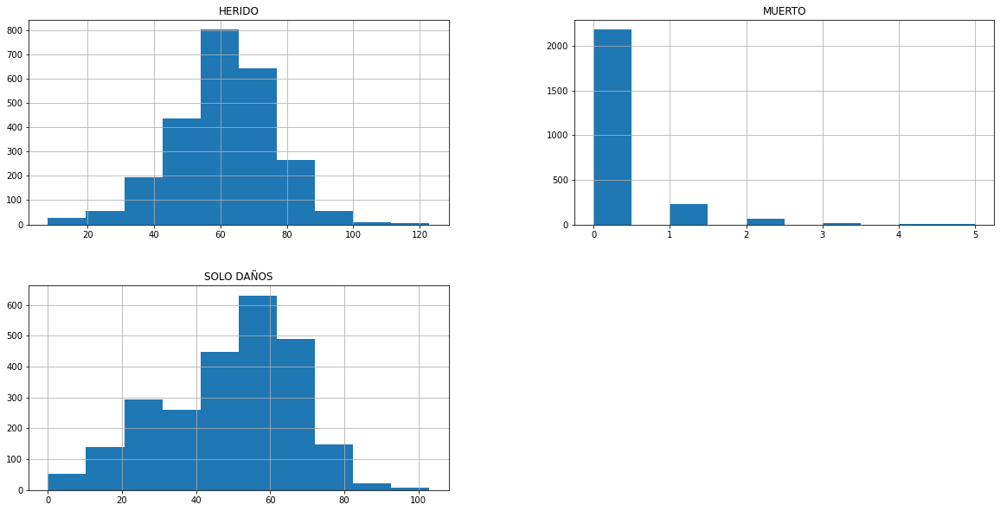

In [67]:
distribution_statistics_graph('GRAVEDAD')

<!-- http://www.mat.uda.cl/hsalinas/cursos/2011/2do/clase2.pdf -->
En las gráficas de distribución de los datos anteriores se puede apreciar que las categorías **HERIDO** y **CHOQUE** tienen una distribución que es asimétrica con cola hacia la izquierda o sesgada a la izaquierda y lo podemos verificar al ver los valores de la media y mediana que corresponden a estás dos categorías.

Ahora vamos a aplicar una validación de si una variable tiene distribución normal, en la que se graficara y si tiene un comportamiento a una línea recta a un angulo de 45 grados es por que tiene dicha distribución normal.

Aplicaremos esto a las columnas **HERIDO** y **SOLO DAÑOS** de la columna **Gravedad** ya que según los histogramas anteriores son las que nos generan el interrogante si tiene este comportamiento.

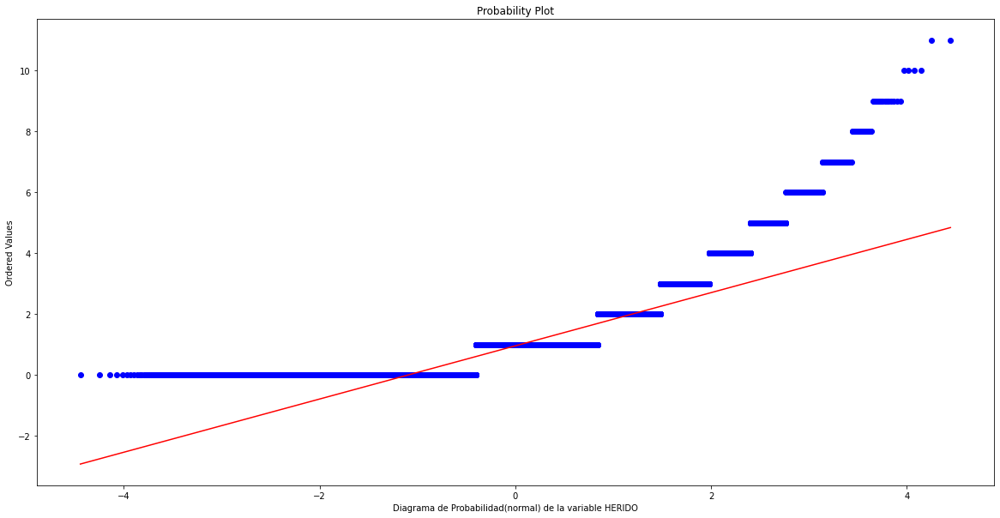

In [68]:
normalidad_variable_numerica('HERIDO')

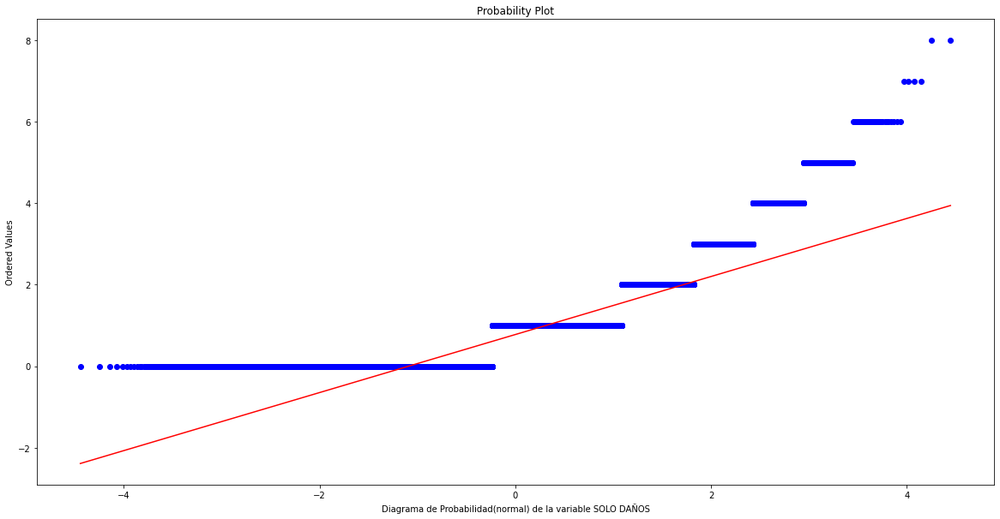

In [69]:
normalidad_variable_numerica('SOLO DAÑOS')

A continuación haremos otra prueba de normalidad de los datos. Si su valor pVal es menor o mayor al 0.05 dicha variable no tiene este comportamiento.

In [70]:
verify_normal_test('GRAVEDAD')

La columna GRAVEDAD y sus categorías:

HERIDO -> NO sigue una distribución normal, su pValor es: 1.5099954033345733e-13
MUERTO -> NO sigue una distribución normal, su pValor es: 0.0
SOLO DAÑOS -> NO sigue una distribución normal, su pValor es: 5.435782328456506e-22


In [71]:
generate_descriptive_statistics('GRAVEDAD')

GRAVEDAD,HERIDO,MUERTO,SOLO DAÑOS
count,2496.000000,2496.000000,2496.000000
mean,60.943109,0.172276,49.203526
std,15.378197,0.512732,18.098845
min,8.000000,0.000000,0.000000
25%,52.000000,0.000000,36.000000
50%,62.000000,0.000000,52.000000
75%,71.000000,0.000000,62.000000
max,123.000000,5.000000,103.000000


HERIDO           AxesSubplot(0.125,0.125;0.227941x0.755)
MUERTO        AxesSubplot(0.398529,0.125;0.227941x0.755)
SOLO DAÑOS    AxesSubplot(0.672059,0.125;0.227941x0.755)
dtype: object

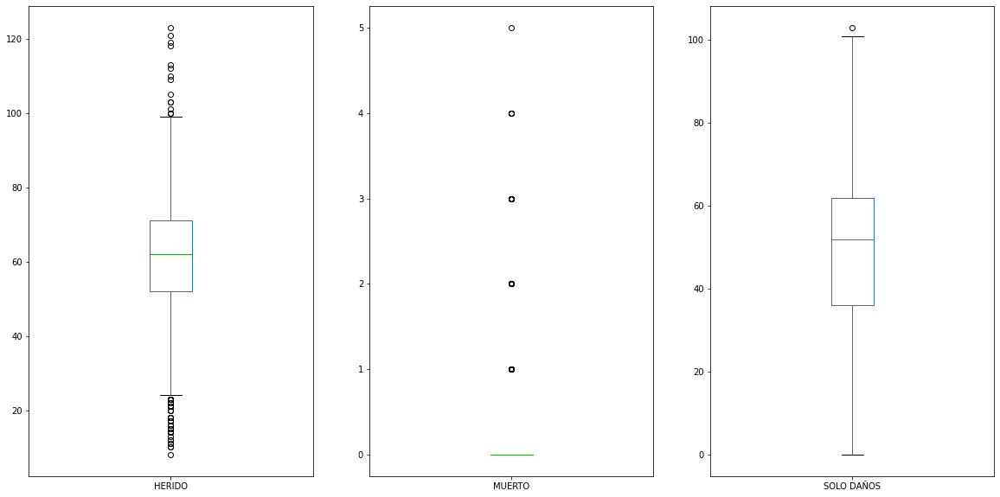

In [72]:
generate_boxplot('GRAVEDAD')

En el diagrama de caja anterior se puede observar lo siguiente:
- La categoría **HERIDO** posee varios valores atipicos "outliers", esto signficaría que hay días en los que los incidentes de esta categoría se ve disminuida o aumentada, pero su rango diario oscila entre 24 y 99 incidentes con heridos.
- La categoría **SOLO DAÑOS** es una categoría estable que oscila entre 0 y 101 incidenes diaros y con un solo valor atípico.
- La categoría **MUERTO** se visualiza como si todos valores fueran atípicos, se debe a lo exporadico que se presenta esta categoría, lo podemos corroborar ya que cada uno de los [cuartiles](https://es.wikipedia.org/wiki/Cuartil) tienen un valor de 0. También podemos concluir por su media que aproximadamente cada **6 días** se presenta un incidente de transito en que una persona resulta muerta. Este dato le falta información como veremos a continuación.
- La categoría **MUERTO** muestra que existió un mismo día en que se presentaron hasta 5 personas muertas por accidentes de transito. 

A continuación veremos otro resumen de la columna **GRAVEDAD** como esta distribuida la cantidad de incidentes en los periodos que conforman el data set.

In [73]:
incidentes_gravedad = incidentes.pivot_table(index='PERIODO', 
                                             columns=['GRAVEDAD'], 
                                             values='OBJECTID', 
                                             aggfunc='count', 
                                             fill_value=0
                                            ).T
incidentes_gravedad['Total Fila'] = incidentes_gravedad.sum(axis=1)
incidentes_gravedad['Porcentaje'] =\
np.round(((incidentes_gravedad['Total Fila'] / incidentes_gravedad['Total Fila'].sum()) * 100),4)

# Resaltar lo valaores más altos por fila
incidentes_gravedad\
    .sort_values(by='Total Fila')\
    .style\
        .apply(highlight_max, subset=periodos, axis=1)\
        .format('{:,}')

PERIODO,2014,2015,2016,2017,2018,2019,2020,Total Fila,Porcentaje
GRAVEDAD,,,,,,,,,
MUERTO,0,0,0,0,77,217,136,430,0.1562
SOLO DAÑOS,"18,208","18,495","18,567","19,431","19,044","19,231","9,836","122,812",44.6012
HERIDO,"22,991","23,221","23,924","22,841","20,954","22,974","15,209","152,114",55.2427


En la tabla anterior se puede examinar lo siguiente:

- Se observa que la información para la categoría "**MUERTO**" no esta registrada para los años del **2014** al **2017**, lo que indica que la cifra de **430** muertos acumulada es más alta. Además se resalta que el año **2019** tiene la más alta cantidad de muertos por año.
- Igualmente se observa que el porcentaje de la categoría **HERIDO** es del **55.24%**, lo que significa aproximadamente que por cada **2** incidentes de transito habrá **1 incidente** con personas heridas. Ahora si sumamos los porcentajes de las categorías "**HERIDO**" y "**MUERTO**" daría **55.40%** y de este valor hay un porcentaje del **0.28%** que una persona herida resulte **MUERTO**.

A continuación veremos otro resumen de la columna **GRAVEDAD** de como esta distribuida la cantidad de incidentes por cada uno de los meses que conforman el data set. Además se anexan algunas nuevas columnas de tendencia central como es el promedio o media.

In [74]:
# Crear data frame con la información resumida para columna CLASE
incidentes_mes_gravedad = incidentes.pivot_table(index='MES', 
                                            columns=['GRAVEDAD'], 
                                            values='OBJECTID', 
                                            aggfunc='count', 
                                            fill_value=0).T

# Anexar las columnas calculadas al set de datos resumido
incidentes_mes_gravedad['Total Fila'] = incidentes_mes_gravedad.sum(axis=1)
incidentes_mes_gravedad['Porcentaje'] =\
np.round(((incidentes_mes_gravedad['Total Fila'] / incidentes_mes_gravedad['Total Fila'].sum()) * 100),2)

subset = incidentes['MES'].unique() 

incidentes_mes_gravedad\
    .sort_values(by='Total Fila')\
    .style\
        .apply(highlight_max, subset=subset, axis=1)\
        .format('{:,}')

MES,1,2,3,4,5,6,7,8,9,10,11,12,Total Fila,Porcentaje
GRAVEDAD,,,,,,,,,,,,,,
MUERTO,41,51,41,34,46,32,39,40,34,34,15,23,430,0.16
SOLO DAÑOS,"9,364","10,686","10,325","9,508","10,410","9,825","10,426","10,986","10,929","11,096","9,319","9,938","122,812",44.6
HERIDO,"12,173","13,151","13,256","11,581","12,839","12,215","13,128","13,863","13,812","13,670","11,102","11,324","152,114",55.24


En la tabla resmen anterior se puede observar el acumualdo de incidentes por mes y se reslata en que mes se presenta más cada categoría de la columna **GRAVEDAD**.

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001B2E7A9BF08>,
      dtype=object)

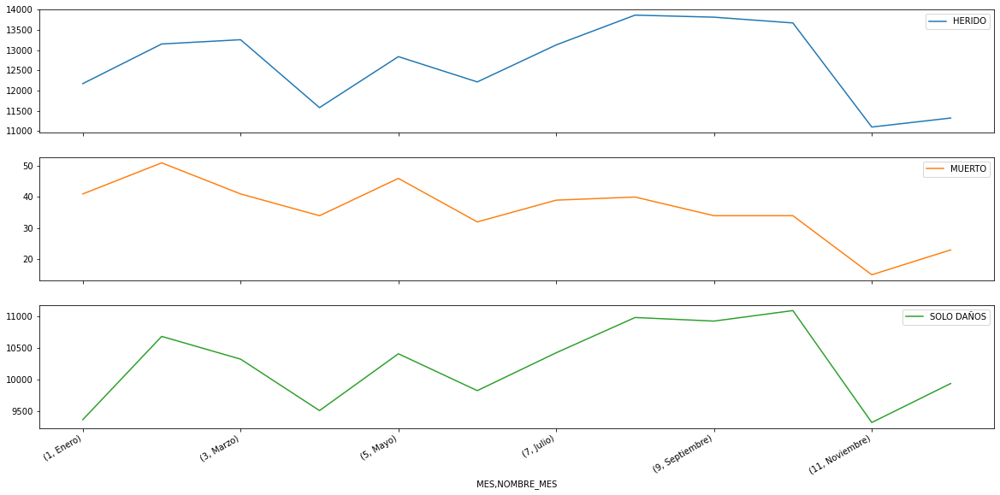

In [75]:
incidente_x_mes_gravedad = incidentes.pivot_table(index=['MES','NOMBRE_MES'], 
                       columns=['GRAVEDAD'], 
                       values='OBJECTID', 
                       aggfunc='count', 
                       fill_value=0).sort_index()
incidente_x_mes_gravedad.plot(subplots=True)

En el gráfico anterior se puede ver lo siguiente:

- Que el el final del tercer trimestre e inicios el cuarto, los incidentes de las categorías **HERIDO** y **SOLO DAÑOS** tienen tendencia a aumentar.
- Que la categoría **MUERTO** sucede lo contrarío inicia el primer semestre alto y decrece para los demás trimestres
- Que el mes de **Febrero** es el mes que más **MUERTOS** se presentan por incidentes de transito.
- Que el en el mes **Noviembre** de caen los datos por la ausencia de información que tiene el repositorio del año 2020.
#### Graficar la información de la columna GRAVEDAD

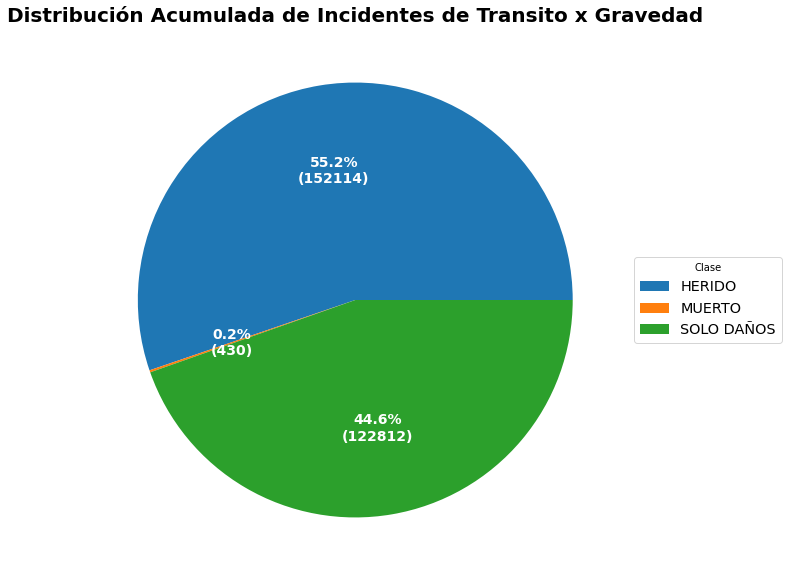

In [76]:
fig, ax = plt.subplots()

data = incidentes_gravedad['Total Fila']
bad_col = data.index.isin(['Total Columna'])
data = data[~bad_col]

wedges, texts, autotexts = ax.pie(data
                                  , autopct=lambda pct: func(pct, data)
                                  , textprops=dict(color="w")
                                 )

ax.legend(wedges, 
          data.index,
          title="Clase",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1),
          fontsize = 'x-large')

plt.setp(autotexts, size=14, weight="bold")
ax.set_title("Distribución Acumulada de Incidentes de Transito x Gravedad", size=20, weight="bold")
plt.show()

#### Correlación entre las categorías de la columna GRAVEDAD
Ahora graficaremos la correlación entre las categorías de la columna **GRAVEDAD** de forma **mensual**, ahora dejaré que el lector o lectora cambien el 2do parámetro en diferentes frecuencias de tiempo [Diario=**D**, Mensual=**M**, Anual=**A**] y puedan analizar si hay alguna diferencia entre estos diferentes rangos de tiempo.

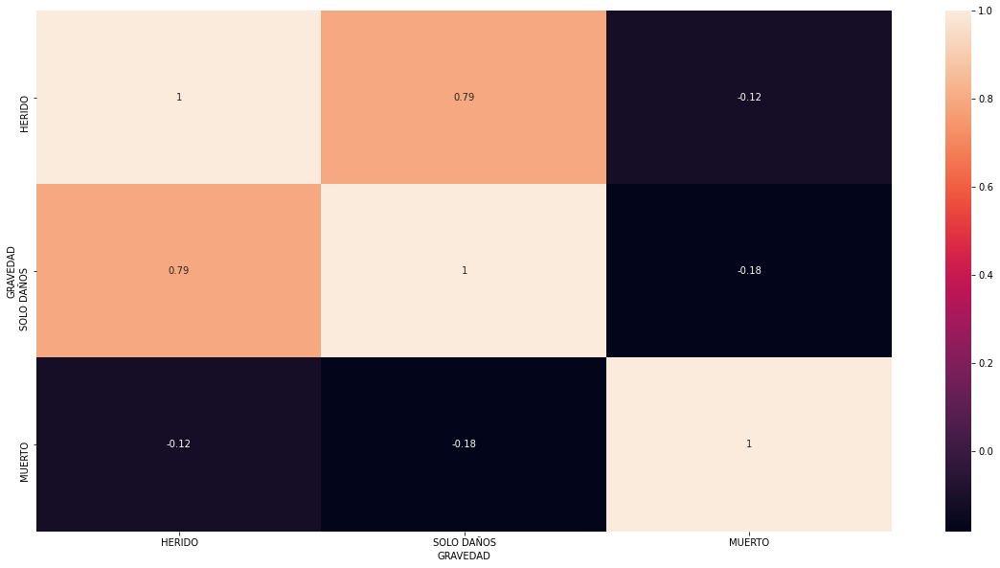

In [77]:
generate_graph_type('GRAVEDAD','M','corr',incidentes['GRAVEDAD'].unique().tolist())

Podemos observar en la gráfica de correlación anterior mensual para columna **GRAVEDAD** solo hay una relación entre las categorías **SOLO DAÑOS** y **HERIDOS**.
#### Correlación de incidentes por las columnas [GRAVEDAD y CLASE] x Mes

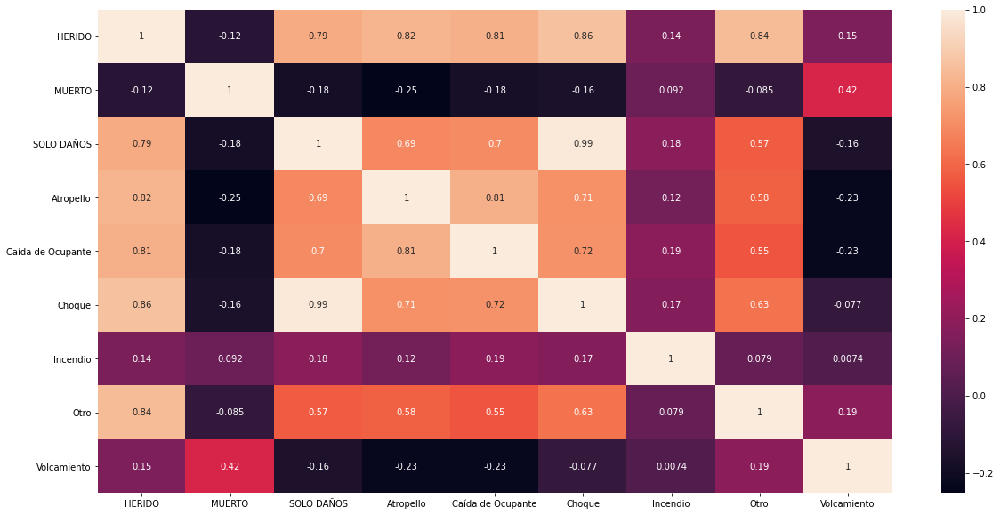

In [78]:
geneate_graph_type_two_colums('GRAVEDAD','CLASE','Fecha_Hora','Fecha_Hora','M','corr')

En el gráfico anterior podemos observar:

- Que la correlación entre las categorías **Choque** y **SOLO DAÑOS** es casi perfecta con un valor de **0.99**.
- Que las demás correlaciones mensionadas antes continuan.

#### Distribución de incidentes por las columnas [GRAVEDAD y CLASE] x PERIODO

In [79]:
incidentes_clase_gravedad = incidentes.pivot_table(index='PERIODO', 
                                                   columns=['GRAVEDAD','CLASE'], 
                                                   values='OBJECTID', 
                                                   aggfunc='count', 
                                                   fill_value=0).T
# Anexar nuevas columas calculadas
incidentes_clase_gravedad['Total Fila'] = incidentes_clase_gravedad.sum(axis=1)
incidentes_clase_gravedad['Porcentaje'] = np.round(((incidentes_clase_gravedad['Total Fila']\
                                                     / incidentes_clase_gravedad['Total Fila'].sum()) * 100),4)

# Imprimir el data set con resaltando los valores más altos por fila o categoría x periodo o año
incidentes_clase_gravedad.style.apply(highlight_max,
                                      subset=periodos, 
                                      axis=1).format('{:,}')\
                                .apply(highlight_max,
                                      subset=['Total Fila'],
                                      axis=0)

En la tabla de datos anterior se puede observar lo siguiente:
- Una distribución agrupada por las columnas (**GRAVEDAD**,**CLASE**) y desagregada por la columna **PERIODO** o año.
- Igualmente podemos ver un acumulado total por cada fila y el porcentaje que representa para el set de datos. 
- Además se resaltan los valores más altos por categoría y el año que se presento.

### Resumen Columna COMUNA
A continuación veremos información de la columna **COMUNA** como esta distribuida la cantidad de incidentes por cada una de sus categorías con una frecuencia diaria. Además se anexa un grafico de distribución de cada categoría y un grafico boxplot.

In [80]:
distribution_statistics_data('COMUNA')

,Registros,Distribución,Promedio,Mediana,Varianza,Desv. Estandar,Simetría,Kurtosis
La Candelaria,57298,0.208087,22.955929,24.0,92.069400,9.595280,-0.238721,-0.574775
Laureles Estadio,30653,0.111321,12.280849,12.0,30.229308,5.498119,0.164159,-0.239215
Castilla,27435,0.099635,10.991587,11.0,20.247224,4.499692,0.345559,0.312980
El Poblado,22588,0.082032,9.049679,9.0,22.479294,4.741233,0.289777,-0.241354
Guayabal,19912,0.072314,7.977564,8.0,16.524547,4.065040,0.400753,0.051280
Belén,18116,0.065791,7.258013,7.0,11.530196,3.395614,0.437428,0.120420
Robledo,17946,0.065174,7.189904,7.0,10.646086,3.262834,0.403454,0.141853
Aranjuez,16281,0.059127,6.522837,6.0,8.417915,2.901364,0.439356,0.126623
Buenos Aires,10629,0.038601,4.258413,4.0,4.868266,2.206415,0.472979,0.109340
La América,8969,0.032572,3.593349,3.0,4.671844,2.161445,0.567444,0.232141


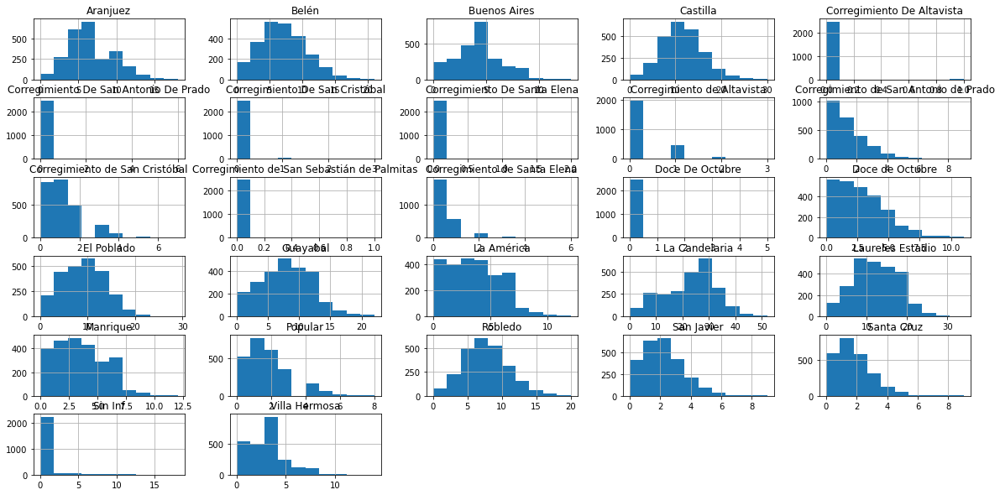

In [81]:
distribution_statistics_graph('COMUNA')

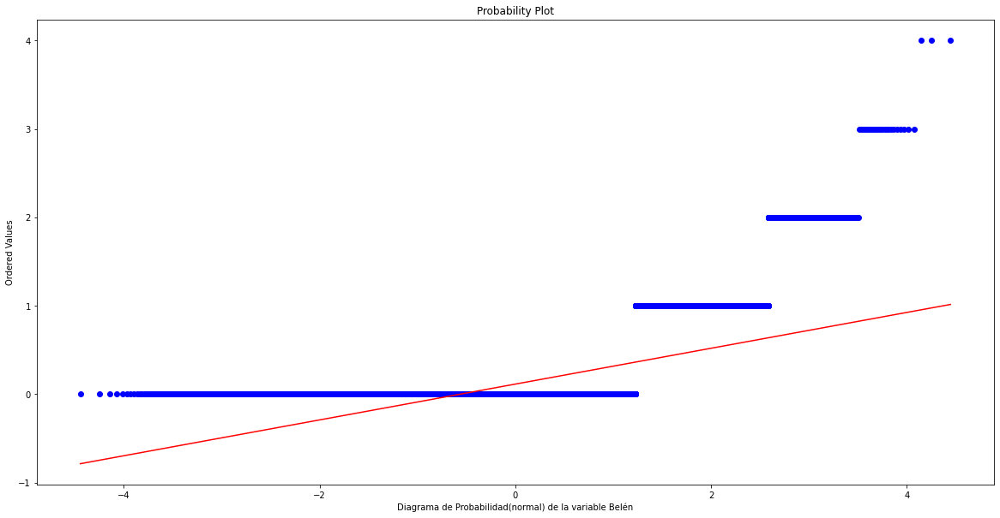

In [82]:
normalidad_variable_numerica('Belén')

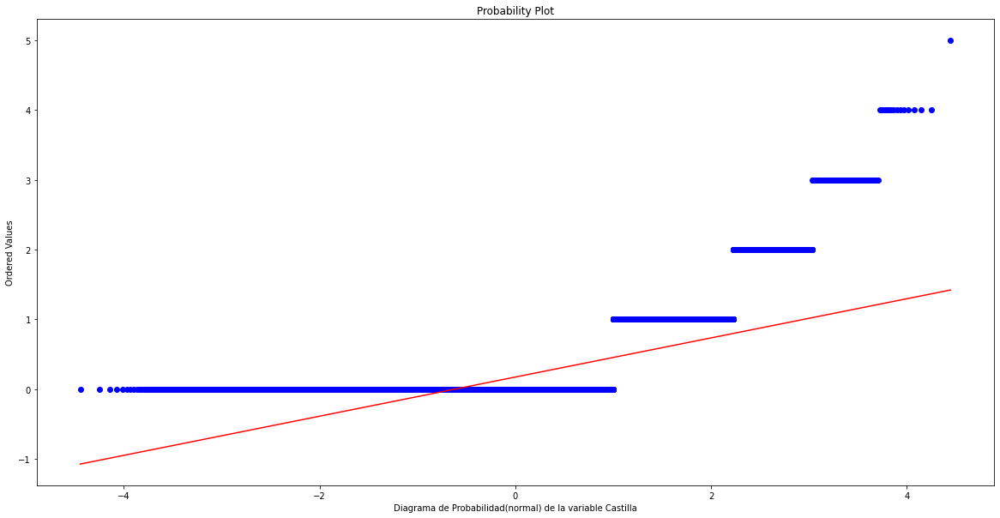

In [83]:
normalidad_variable_numerica('Castilla')

Ahora haremos una prueba de normalidad de los datos por cada categoría de la columna **COMUNA**.

In [76]:
verify_normal_test('COMUNA')

La columna COMUNA y sus categorías:

Aranjuez -> NO sigue una distribución normal, su pValor es: 3.8611067650968236e-17
Belén -> NO sigue una distribución normal, su pValor es: 5.581549163407276e-17
Buenos Aires -> NO sigue una distribución normal, su pValor es: 2.2176403527942175e-19
Castilla -> NO sigue una distribución normal, su pValor es: 1.0113699499957994e-12
Corregimiento De Altavista -> NO sigue una distribución normal, su pValor es: 0.0
Corregimiento De San Antonio De Prado -> NO sigue una distribución normal, su pValor es: 0.0
Corregimiento De San Cristóbal -> NO sigue una distribución normal, su pValor es: 0.0
Corregimiento De Santa Elena -> NO sigue una distribución normal, su pValor es: 0.0
Corregimiento de Altavista -> NO sigue una distribución normal, su pValor es: 1.0289598415570652e-235
Corregimiento de San Antonio de Prado -> NO sigue una distribución normal, su pValor es: 7.842908616577535e-119
Corregimiento de San Cristóbal -> NO sigue una distribución normal, su p

In [77]:
generate_descriptive_statistics('COMUNA')

COMUNA,Aranjuez,Belén,Buenos Aires,Castilla,Corregimiento De Altavista,Corregimiento De San Antonio De Prado,Corregimiento De San Cristóbal,Corregimiento De Santa Elena,Corregimiento de Altavista,Corregimiento de San Antonio de Prado,...,La América,La Candelaria,Laureles Estadio,Manrique,Popular,Robledo,San Javier,Santa Cruz,Sin Inf,Villa Hermosa
count,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,...,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000
mean,6.522837,7.258013,4.258413,10.991587,0.004006,0.031651,0.012821,0.007612,0.247596,1.120994,...,3.593349,22.955929,12.280849,3.471554,1.657452,7.189904,1.944311,1.512420,0.655048,3.014022
std,2.901364,3.395614,2.206415,4.499692,0.063182,0.330482,0.149266,0.099810,0.513148,1.272723,...,2.161445,9.595280,5.498119,2.007200,1.350740,3.262834,1.458478,1.312742,2.055346,1.872543
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,5.000000,3.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,16.000000,8.000000,2.000000,1.000000,5.000000,1.000000,1.000000,0.000000,2.000000
50%,6.000000,7.000000,4.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,3.000000,24.000000,12.000000,3.000000,1.000000,7.000000,2.000000,1.000000,0.000000,3.000000
75%,8.000000,9.000000,6.000000,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,...,5.000000,30.000000,16.000000,5.000000,2.000000,9.000000,3.000000,2.000000,0.000000,4.000000
max,18.000000,21.000000,13.000000,30.000000,1.000000,6.000000,3.000000,2.000000,3.000000,9.000000,...,12.000000,52.000000,34.000000,12.000000,8.000000,20.000000,9.000000,9.000000,18.000000,14.000000


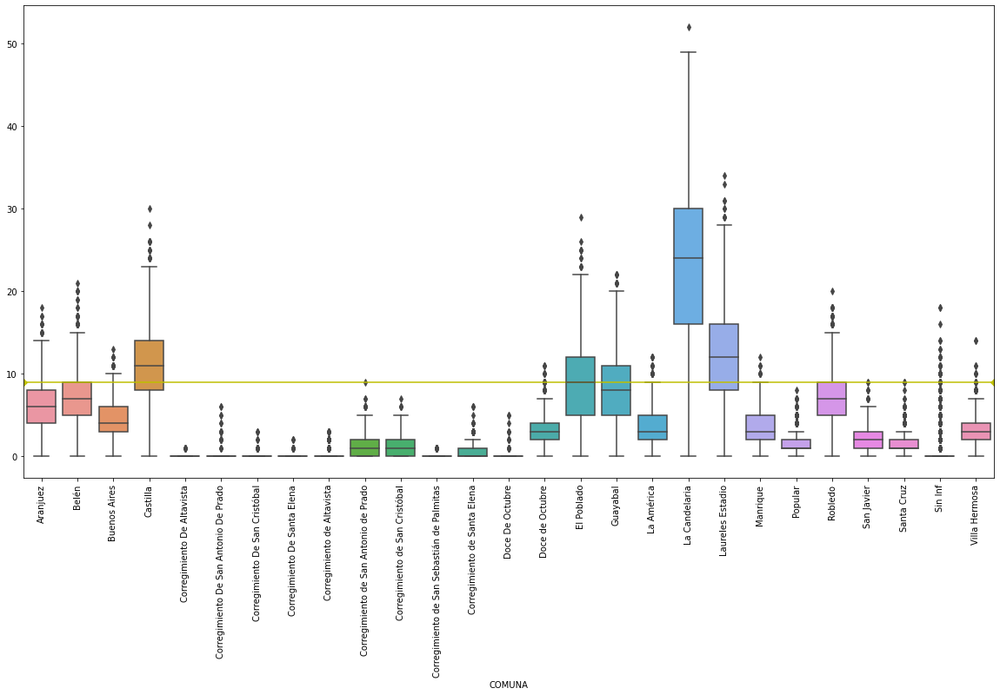

In [78]:
data = incidentes.pivot_table(index='FECHA', columns='COMUNA', values='OBJECTID', aggfunc='count', fill_value=0)
ax = sns.boxplot(data=data)
# ax.set_title('BoxPlot', size=20);
plt.ioff()
plt.isinteractive()
plt.setp(ax.get_xticklabels(), rotation=90)
plt.axhline(y=9, color='y', linestyle='-', marker='D', linewidth=1.5)

En el diagrama de caja anterior se puede observar:
- La comuna la "**Candelaria**" (El Centro de Medellín) es la que más concentra incidentes de transito, y le siguen las comunas "**Laureles Estadio**", "**Castilla**" , "**El Poblado**", "**Guayabal**".
- Las demás comunas oscilan entre 0 y los 9 incidentes diarios, lo cual lo podemos verificar con la línea adiccional trazada, a excepción de las comunas "**Bueno Aires**", "**Manrrique**", "**Villa Hermosa**".
- Todas las comunas tienen valores atípicos, lo que significa que ocacionalmente aumentan la cantidad de incidentes en cada una, generando este comportamiento estadistico.

A continuación veremos otro resumen de la columna **COMUNA** como esta distribuida la cantidad de incidentes en los **periodos** que conforman el data set.

In [79]:
# Crear data frame con la información resumida para columna COMUNA
incidentes_comuna = incidentes.pivot_table(index='PERIODO', 
                                            columns=['COMUNA'], 
                                            values='OBJECTID', 
                                            aggfunc='count', 
                                            fill_value=0).T

# Anexar nuevas columas calculadas
incidentes_comuna['Total Fila'] = incidentes_comuna.sum(axis=1)
incidentes_comuna['Porcentaje'] = np.round(((incidentes_comuna['Total Fila']\
                                                     / incidentes_comuna['Total Fila'].sum()) * 100),4)

# # Anexar la fila con el total por cada columna
# sums = pd.DataFrame(incidentes_comuna.select_dtypes(np.number).sum().rename('Total Columna'))
# incidentes_comuna.append(np.round(sums.T,2))

# Imprimir el data set con resaltando los valores más altos por fila o categoría x periodo o año
incidentes_comuna\
        .sort_values(by='Total Fila')\
        .style.apply(highlight_max,subset=periodos, axis=1)\
        .format('{:,}')\
        .apply(highlight_max,subset=['Total Fila'],axis=0)

PERIODO,2014,2015,2016,2017,2018,2019,2020,Total Fila,Porcentaje
COMUNA,,,,,,,,,
Corregimiento De Altavista,0,0,0,0,0,0,10,10,0.0036
Corregimiento de San Sebastián de Palmitas,0,2,4,3,1,2,6,18,0.0065
Corregimiento De Santa Elena,0,0,0,0,0,0,19,19,0.0069
Corregimiento De San Cristóbal,0,0,0,0,0,0,32,32,0.0116
Doce De Octubre,0,0,0,0,0,0,46,46,0.0167
Corregimiento De San Antonio De Prado,0,0,0,0,0,0,79,79,0.0287
Corregimiento de Altavista,102,111,100,83,54,82,86,618,0.2244
Corregimiento de Santa Elena,245,183,100,132,96,145,99,"1,000",0.3632
Sin Inf,36,46,48,21,18,0,"1,466","1,635",0.5938


De la tabla resumen anterior se puede observar:

- Que para algunas comunas no se tiene la información de los incidentes del año 2014 al año 2019. 
- Además, se resaltan por cada comuna cual fue el año que más incdentes tuvo.
- Finalmente por la columa "total fila" se resalta cual tiene más incidentes.

Ahora vamos a combinar los valores del data set por las columnas **GRAVEDAD**,**CLASE**,**COMUNA** x **PERIODO**.

In [80]:
incidentes_clase_gravedad = incidentes.pivot_table(index='PERIODO', 
                                                   columns=['GRAVEDAD','CLASE','COMUNA'], 
                                                   values='OBJECTID', 
                                                   aggfunc='count', 
                                                   fill_value=0).T
# Anexar nuevas columas calculadas
incidentes_clase_gravedad['Total Fila'] = incidentes_clase_gravedad.sum(axis=1)
incidentes_clase_gravedad['Porcentaje'] = np.round(((incidentes_clase_gravedad['Total Fila']\
                                                     / incidentes_clase_gravedad['Total Fila'].sum()) * 100),4)

# Resaltar el mayor valor por cada fila del data set resumen
incidentes_clase_gravedad\
    .style.set_caption('HeatMap, Distribución de Incidentes por GRAVEDAD vs CLASE vs COMUNA por Año')\
    .background_gradient(cmap=cm, axis=1, subset=periodos)\
    .format('{:,}')       

Ahora vamos a combinar los valores del data set por las columnas **GRAVEDAD**,**COMUNA** con el fin de ver el resumen un poco más corto. 

In [81]:
incidentes_gravedad_comuna = incidentes.pivot_table(index=['GRAVEDAD'], 
                                                   columns=['COMUNA'], 
                                                   values='OBJECTID', 
                                                   aggfunc='count', 
                                                   fill_value=0).T
# Anexar nuevas columas calculadas
incidentes_gravedad_comuna['Total Fila'] = incidentes_gravedad_comuna.sum(axis=1)
incidentes_gravedad_comuna['Porcentaje'] = np.round(((incidentes_gravedad_comuna['Total Fila']\
                                                     / incidentes_gravedad_comuna['Total Fila'].sum()) * 100),4)

# Resaltar el mayor valor por cada fila del data set resumen
incidentes_gravedad_comuna\
    .sort_values(by=['MUERTO','HERIDO'])\
    .style.set_caption('HeatMap, por GRAVEDAD vs COMUNA, ordenado por las columnas MUERTO, HERIDO')\
    .background_gradient(cmap=cm, axis=0, subset=['HERIDO','MUERTO','SOLO DAÑOS'])\
    .format('{:,}')

GRAVEDAD,HERIDO,MUERTO,SOLO DAÑOS,Total Fila,Porcentaje
COMUNA,,,,,
Corregimiento de San Sebastián de Palmitas,11,0,7,18,0.0065
Corregimiento De Santa Elena,14,0,5,19,0.0069
Corregimiento De San Cristóbal,21,0,11,32,0.0116
Doce De Octubre,29,0,17,46,0.0167
Corregimiento De Altavista,6,1,3,10,0.0036
Corregimiento De San Antonio De Prado,43,1,35,79,0.0287
Corregimiento de Altavista,464,1,153,618,0.2244
Sin Inf,"1,097",1,537,"1,635",0.5938
Corregimiento de Santa Elena,685,3,312,"1,000",0.3632


De la tabla resumen anterior se puede observar:

- La comuna **La Candelaria** (centro de Medellín) es la que más incidentes presenta en todas las categorías de la columna **GRAVEDAD** en el siguiente orden (MUERTO, HERIDO, SOLO DAÑOS).

A continuación se muestra una gráfica que represeta la tabla de datos anterior.

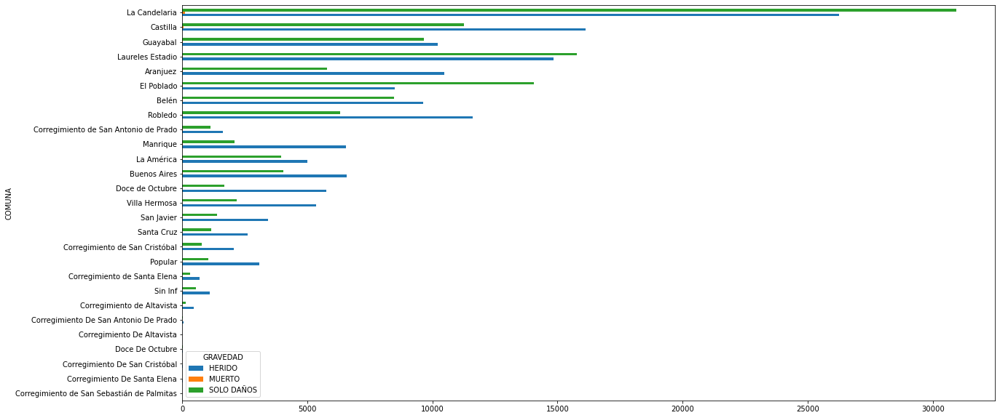

In [82]:
incidentes_gravedad_comuna[['HERIDO','MUERTO','SOLO DAÑOS']].sort_values(by=['MUERTO','HERIDO']).plot.barh()

Debido a que en la grafica anterior no se puede visualizar los incidentes que corresponde a la categoría **MUERTO**, se decide realizar una gráfica independiente y ver esta información de forma gráfica.

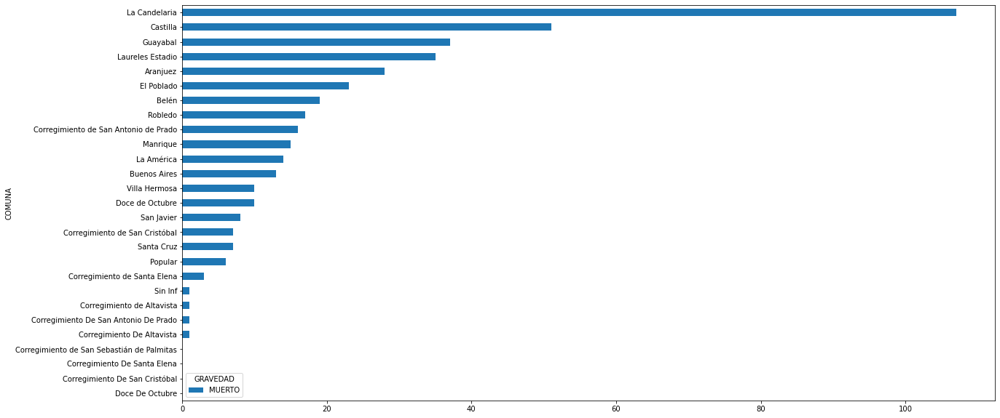

In [83]:
incidentes_gravedad_comuna[['MUERTO']].sort_values(by=['MUERTO']).plot.barh()

Ahora veremos una gráfica de correlación diaria entre las columnas **GRAVEDAD** y **COMUNA**.

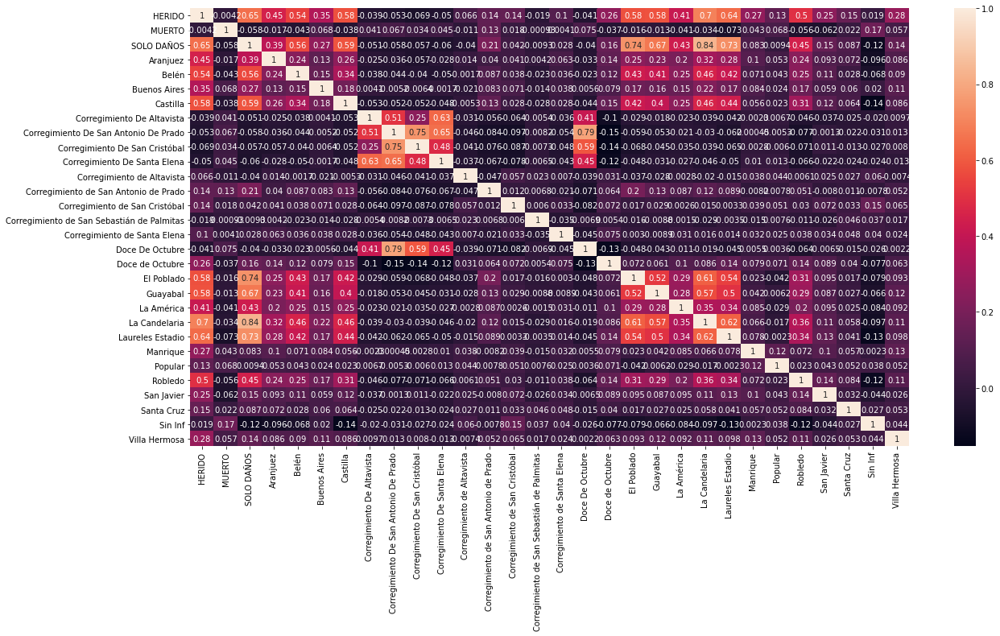

In [84]:
geneate_graph_type_two_colums('GRAVEDAD','COMUNA','Fecha_Hora','Fecha_Hora','D','corr')

En la gráfica de correlación anterior podemos observar:

- Existe una alta relación entre las comunas **La Candelaria**, **El Poblado**, **Laureles Estadio** con la categoría **Solo Daños**.
- Existe una relación alta entre la comuna **Doce de Octubre** y la comuna **Corregimiento de San Antonio de Prado**.
- Existe una relación alta entre los corregimientos de: **San Antonio de Prado**, **Santa Elena** y **San Cristobal**.
- Existe una relación mediana de la categoría **HERIDO** con las comunas: **La Candelaria**, **Laureles Estadio**, **El Poblado**, **Guayabal**, **Castilla**, **Belén**.
- No exite ninguna relación fuerte entre la categoría **MUERTO** y las comunas.

### Resumen Columna DISENO
A continuación veremos información de la columna **DISENO** como esta distribuida la cantidad de incidentes por cada una de sus categorías con una frecuencia diaria. Además se anexa un grafico de distribución de cada categoría y un grafico boxplot.

In [85]:
distribution_statistics_data('DISENO')

,Registros,Distribución,Promedio,Mediana,Varianza,Desv. Estandar,Simetría,Kurtosis
Tramo de via,192756,0.700025,77.225962,78.0,644.351326,25.384076,-0.174843,-0.225078
Interseccion,45915,0.166748,18.395433,18.0,54.029141,7.350452,0.137561,-0.394926
Lote o Predio,25482,0.092542,10.209135,9.0,79.989913,8.943708,0.940174,0.687467
Glorieta,6777,0.024612,2.715144,2.0,4.274336,2.067447,0.948328,1.165089
Paso Elevado,1395,0.005066,0.558894,0.0,0.689917,0.830612,1.805311,4.185844
Ciclo Ruta,1031,0.003744,0.413061,0.0,1.149954,1.072359,9.219637,143.387487
Puente,1021,0.003708,0.409054,0.0,0.466275,0.682843,1.812319,3.437249
Paso Inferior,701,0.002546,0.280849,0.0,0.331914,0.576119,2.357739,6.722250
Paso a Nivel,123,0.000447,0.049279,0.0,0.050076,0.223776,4.590186,21.332220
Via peatonal,63,0.000229,0.025240,0.0,0.027820,0.166792,7.063100,54.351855


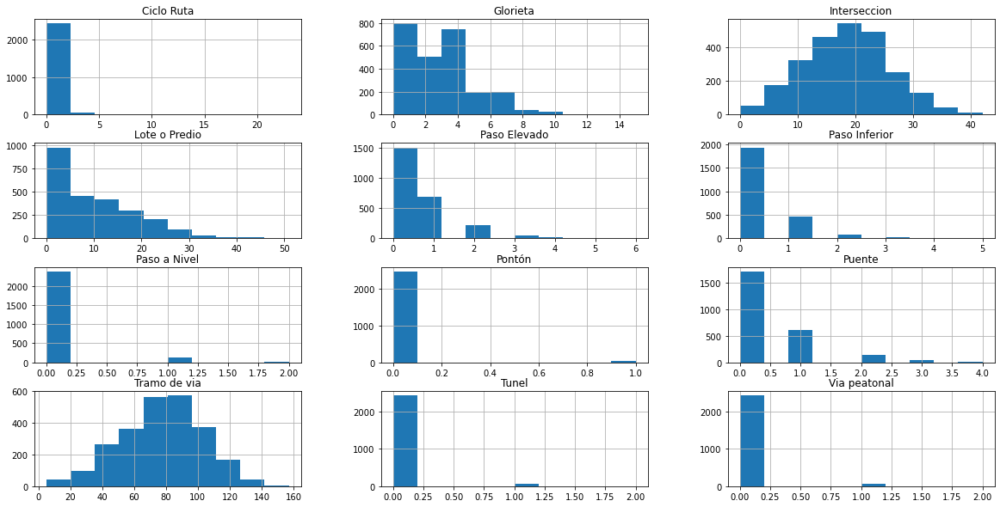

In [86]:
distribution_statistics_graph('DISENO')

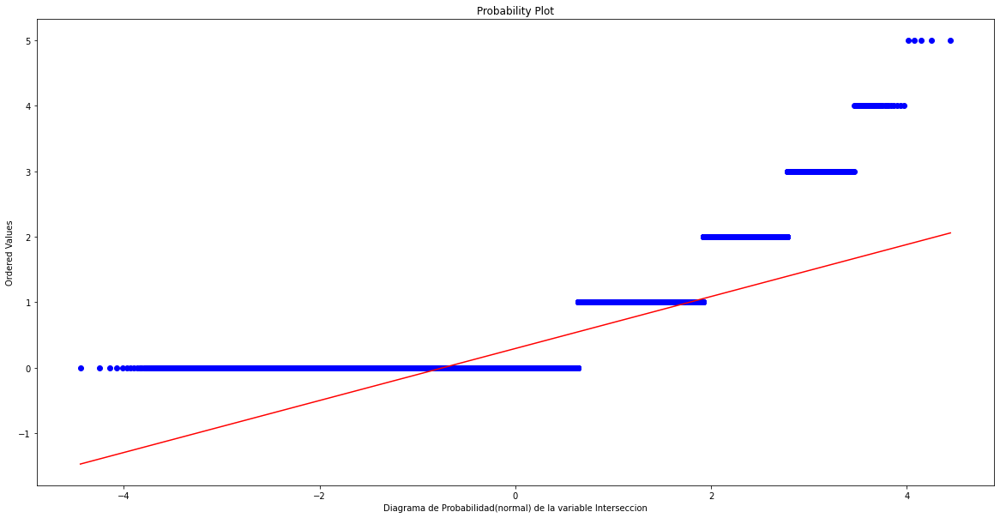

In [84]:
normalidad_variable_numerica('Interseccion')

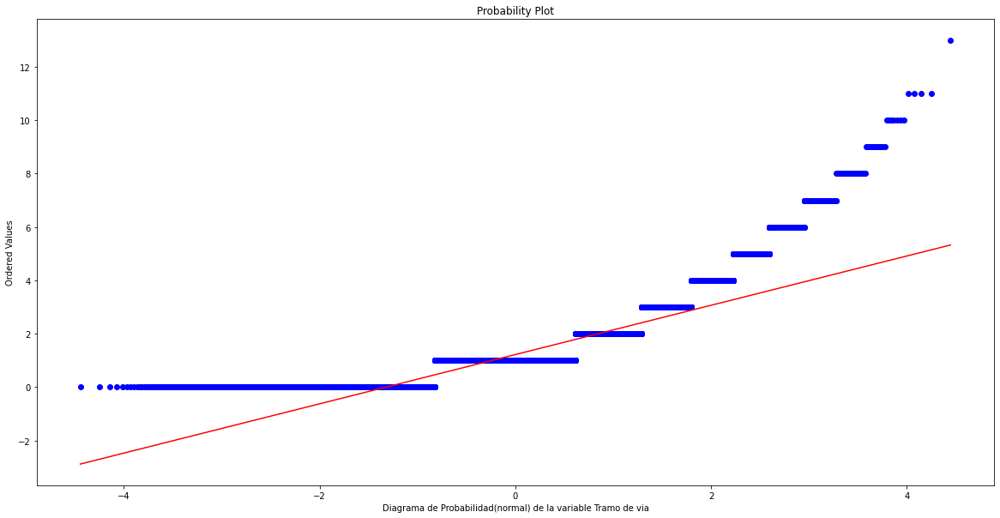

In [85]:
normalidad_variable_numerica('Tramo de via')

Ahora haremos una prueba de normalidad de los datos por cada categoría de la columna **DISENO**.

In [86]:
verify_normal_test('DISENO')

La columna DISENO y sus categorías:

Ciclo Ruta -> NO sigue una distribución normal, su pValor es: 0.0
Glorieta -> NO sigue una distribución normal, su pValor es: 1.4717002744790042e-73
Interseccion -> NO sigue una distribución normal, su pValor es: 6.44413005070901e-08
Lote o Predio -> NO sigue una distribución normal, su pValor es: 9.118861237514064e-66
Paso Elevado -> NO sigue una distribución normal, su pValor es: 1.4692828203055208e-196
Paso Inferior -> NO sigue una distribución normal, su pValor es: 2.1558692183716086e-269
Paso a Nivel -> NO sigue una distribución normal, su pValor es: 0.0
Pontón -> NO sigue una distribución normal, su pValor es: 0.0
Puente -> NO sigue una distribución normal, su pValor es: 6.9300292812687305e-189
Tramo de via -> NO sigue una distribución normal, su pValor es: 7.094350169022951e-05
Tunel -> NO sigue una distribución normal, su pValor es: 0.0
Via peatonal -> NO sigue una distribución normal, su pValor es: 0.0


In [87]:
generate_descriptive_statistics('COMUNA')

COMUNA,Aranjuez,Belén,Buenos Aires,Castilla,Corregimiento De Altavista,Corregimiento De San Antonio De Prado,Corregimiento De San Cristóbal,Corregimiento De Santa Elena,Corregimiento de Altavista,Corregimiento de San Antonio de Prado,...,La América,La Candelaria,Laureles Estadio,Manrique,Popular,Robledo,San Javier,Santa Cruz,Sin Inf,Villa Hermosa
count,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,...,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000
mean,6.522837,7.258013,4.258413,10.991587,0.004006,0.031651,0.012821,0.007612,0.247596,1.120994,...,3.593349,22.955929,12.280849,3.471554,1.657452,7.189904,1.944311,1.512420,0.655048,3.014022
std,2.901364,3.395614,2.206415,4.499692,0.063182,0.330482,0.149266,0.099810,0.513148,1.272723,...,2.161445,9.595280,5.498119,2.007200,1.350740,3.262834,1.458478,1.312742,2.055346,1.872543
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,5.000000,3.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,16.000000,8.000000,2.000000,1.000000,5.000000,1.000000,1.000000,0.000000,2.000000
50%,6.000000,7.000000,4.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,3.000000,24.000000,12.000000,3.000000,1.000000,7.000000,2.000000,1.000000,0.000000,3.000000
75%,8.000000,9.000000,6.000000,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,...,5.000000,30.000000,16.000000,5.000000,2.000000,9.000000,3.000000,2.000000,0.000000,4.000000
max,18.000000,21.000000,13.000000,30.000000,1.000000,6.000000,3.000000,2.000000,3.000000,9.000000,...,12.000000,52.000000,34.000000,12.000000,8.000000,20.000000,9.000000,9.000000,18.000000,14.000000


Ciclo Ruta          AxesSubplot(0.125,0.125;0.0545775x0.755)
Glorieta         AxesSubplot(0.190493,0.125;0.0545775x0.755)
Interseccion     AxesSubplot(0.255986,0.125;0.0545775x0.755)
Lote o Predio    AxesSubplot(0.321479,0.125;0.0545775x0.755)
Paso Elevado     AxesSubplot(0.386972,0.125;0.0545775x0.755)
Paso Inferior    AxesSubplot(0.452465,0.125;0.0545775x0.755)
Paso a Nivel     AxesSubplot(0.517958,0.125;0.0545775x0.755)
Pontón           AxesSubplot(0.583451,0.125;0.0545775x0.755)
Puente           AxesSubplot(0.648944,0.125;0.0545775x0.755)
Tramo de via     AxesSubplot(0.714437,0.125;0.0545775x0.755)
Tunel             AxesSubplot(0.77993,0.125;0.0545775x0.755)
Via peatonal     AxesSubplot(0.845423,0.125;0.0545775x0.755)
dtype: object

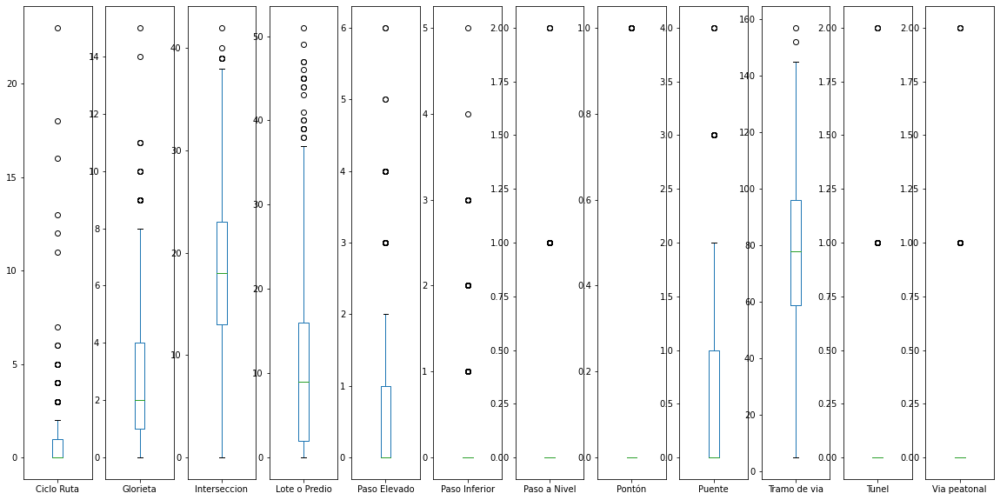

In [88]:
generate_boxplot('DISENO')

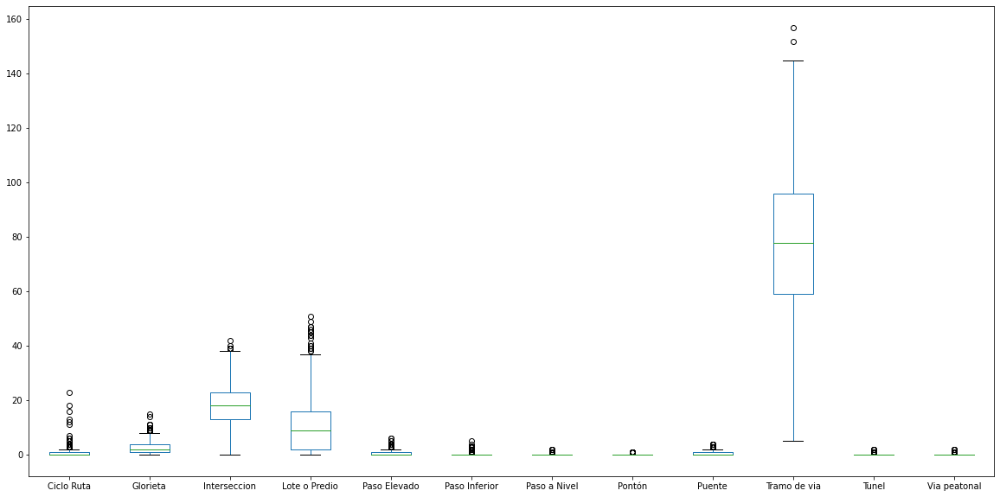

In [89]:
# incidentes.pivot_table(index='FECHA', columns='DISENO', values='OBJECTID', aggfunc='count', fill_value=0).plot.box()
generate_boxplot('DISENO', subplots=False)

En el diagrama de caja anterior se puede observar:

- La categoría "**Tramo de la via**" es la que más se presentan los incindentes. Con un máximo de 157 incidentes.
- Las categorías "**Intersección**" y "**Lote o Predio**" son la 2da y 3ra DISENO donde se presentan incidentes con un promedio de 18 y 9 incidentes diarios.
- La categoría "**Ciclo Ruta**" tiene una gran cantidad de valores atipicos, lo que indica que los conductores no respectan este espacio de uso exclusivo de las bicicletas. Presentandose que en un solo día hubo 23 incidentes en esta categoría.
- Las demás categorías presentan una frecuencia muy baja de máximo 2 incidentes por día a excepción de la caterogoría "**Glorieta**", estas categorías poseen varios valores atípicos, indicando de forma esporadica aumentan en estas categorías los incidentes.

A continuación graficaremos estas categorías con baja tasa de incidencia y visualizar mejor su compartamiento.

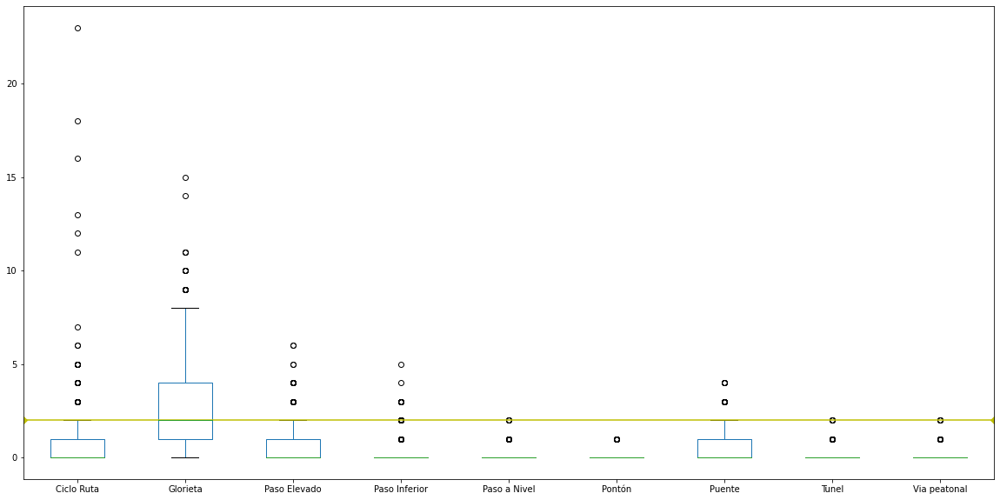

In [90]:
incidentes_cilo_ruta = incidentes.pivot_table(index='FECHA', columns='DISENO', values='OBJECTID', aggfunc='count', fill_value=0).rename(columns={0:'total'})
# incidentes_cilo_ruta[incidentes_cilo_ruta['Ciclo Ruta'].values > 0]['Ciclo Ruta'].plot.box()
incidentes_cilo_ruta[['Ciclo Ruta','Glorieta','Paso Elevado', 'Paso Inferior','Paso a Nivel','Pontón','Puente', 'Tunel','Via peatonal']].plot.box()
plt.axhline(y=2, color='y', linestyle='-', marker='D', linewidth=1.5)

#### Ahora gráificaremos la correlación entre las columnas [GRAVEDAD, DISENO] x Día

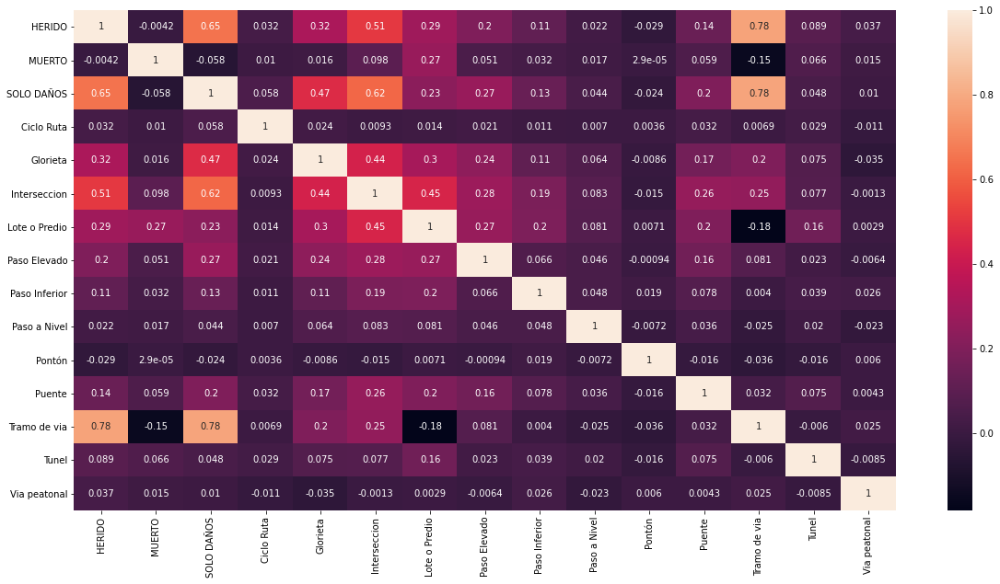

In [91]:
geneate_graph_type_two_colums('GRAVEDAD','DISENO','Fecha_Hora','Fecha_Hora','D','corr')

En la gráfica anterior de correlación se puede observar:

- Las categorías **HERIDO** y **SOLO DAÑOS** de la columna **GRAVEDAD** estan correlacionadas con la categoría **Tramo de vía** de la columna **DISENO**

A continuación veremos otro resumen de la columna **DISENO** como esta distribuida la cantidad de incidentes en los **periodos** que conforman el data set.

In [92]:
incidentes_diseno = incidentes.pivot_table(index=['PERIODO'], 
                                                   columns=['DISENO'], 
                                                   values='OBJECTID', 
                                                   aggfunc='count', 
                                                   fill_value=0).T

# Anexar nuevas columas calculadas
incidentes_diseno['Total Fila'] = incidentes_diseno.sum(axis=1)
incidentes_diseno['Porcentaje'] = np.round(((incidentes_diseno['Total Fila']\
                                                     / incidentes_diseno['Total Fila'].sum()) * 100),4)


incidentes_diseno\
    .sort_values(by='Total Fila')\
    .style.format('{:,}')\
    .background_gradient(cmap=cm, axis=1, subset=periodos)

PERIODO,2014,2015,2016,2017,2018,2019,2020,Total Fila,Porcentaje
DISENO,,,,,,,,,
Pontón,2,2,3,11,2,6,3,29,0.0105
Tunel,1,2,4,10,10,16,20,63,0.0229
Via peatonal,11,7,19,6,5,10,5,63,0.0229
Paso a Nivel,12,5,7,21,39,26,13,123,0.0447
Paso Inferior,61,40,66,149,156,128,101,701,0.2546
Puente,89,82,111,199,210,220,110,"1,021",0.3708
Ciclo Ruta,191,93,93,192,134,185,143,"1,031",0.3744
Paso Elevado,128,98,154,313,300,292,110,"1,395",0.5066
Glorieta,702,751,901,"1,366","1,302","1,202",553,"6,777",2.4612


De la tabla resumen anterior se puede observar:

- La categoría "**Tramo de via**" es la que más incidentes presenta en todos los años analizados, pero su tendencia ha disminuido en los últimos años.
- Las categorías "**Tramo de via**, **Interseccion**, **Lote o Predio**" acumulan el **95.9%** de los incidentes.
- La categoría "**Tunel**" biene en aumento en los últimos 2 años, la cual es una zona en la que los vehículos no deberían tener altas velocidades como para que se presente este tipo de incidente.

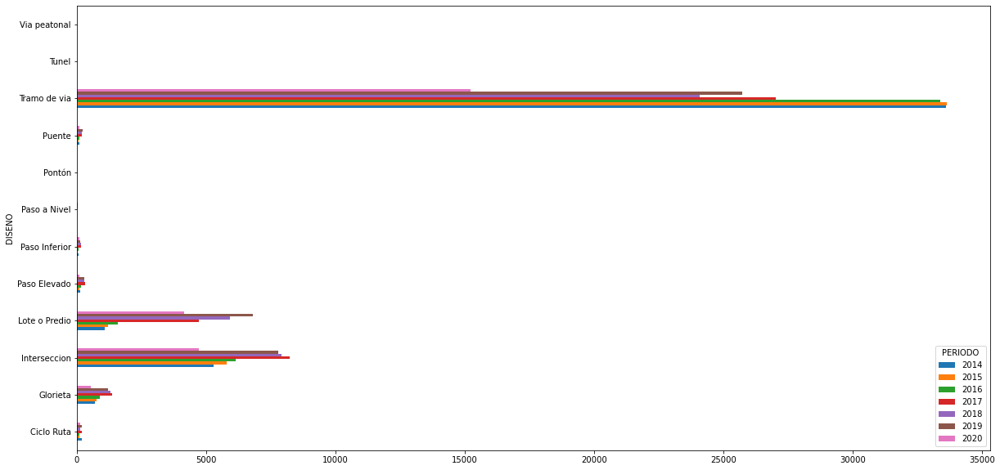

In [93]:
incidentes_diseno[periodos].plot.barh()

### Resumen Columna NOMBRE MES
A continuación veremos información de la columna **NOMBRE MES** como esta distribuida la cantidad de incidentes por cada periodo. Además se anexa un grafico de distribución de cada categoría y un grafico boxplot.

In [94]:
distribution_statistics_data('NOMBRE_MES')

,Registros,Distribución,Promedio,Mediana,Varianza,Desv. Estandar,Simetría,Kurtosis
Agosto,24889,0.090388,9.971554,0.0,1139.672537,33.759036,3.324050,9.827413
Octubre,24800,0.090065,9.935897,0.0,1098.903304,33.149710,3.195964,8.712357
Septiembre,24775,0.089974,9.925881,0.0,1133.656628,33.669818,3.264611,9.213746
Febrero,23888,0.086753,9.570513,0.0,1111.986208,33.346457,3.337188,9.617328
Marzo,23622,0.085787,9.463942,0.0,1035.179461,32.174205,3.291219,9.354452
Julio,23593,0.085682,9.452324,0.0,1022.607746,31.978239,3.278263,9.280585
Mayo,23295,0.084600,9.332933,0.0,1001.343620,31.644014,3.311816,9.556719
Junio,22072,0.080158,8.842949,0.0,909.850275,30.163724,3.307426,9.525761
Enero,21578,0.078364,8.645032,0.0,848.415831,29.127579,3.318274,9.881343
Diciembre,21285,0.077300,8.527644,0.0,951.038915,30.838919,3.506983,10.880712


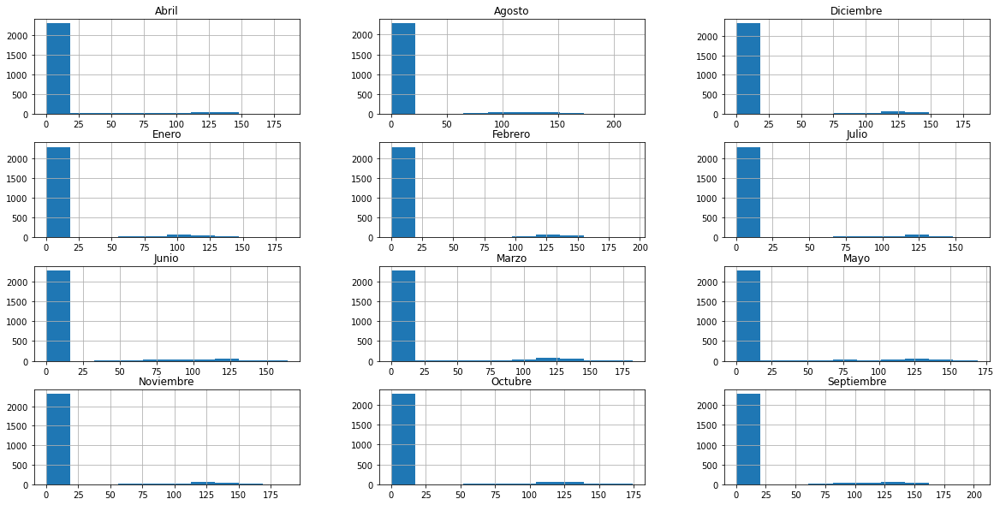

In [95]:
distribution_statistics_graph('NOMBRE_MES')

Ahora haremos una prueba de normalidad de los datos por cada categoría de la columna **NOMBRE_MES**.

In [96]:
verify_normal_test('NOMBRE_MES')

La columna NOMBRE_MES y sus categorías:

Abril -> NO sigue una distribución normal, su pValor es: 0.0
Agosto -> NO sigue una distribución normal, su pValor es: 0.0
Diciembre -> NO sigue una distribución normal, su pValor es: 0.0
Enero -> NO sigue una distribución normal, su pValor es: 0.0
Febrero -> NO sigue una distribución normal, su pValor es: 0.0
Julio -> NO sigue una distribución normal, su pValor es: 0.0
Junio -> NO sigue una distribución normal, su pValor es: 0.0
Marzo -> NO sigue una distribución normal, su pValor es: 0.0
Mayo -> NO sigue una distribución normal, su pValor es: 0.0
Noviembre -> NO sigue una distribución normal, su pValor es: 0.0
Octubre -> NO sigue una distribución normal, su pValor es: 0.0
Septiembre -> NO sigue una distribución normal, su pValor es: 0.0


In [97]:
generate_descriptive_statistics('NOMBRE_MES')

NOMBRE_MES,Abril,Agosto,Diciembre,Enero,Febrero,Julio,Junio,Marzo,Mayo,Noviembre,Octubre,Septiembre
count,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000
mean,8.462740,9.971554,8.527644,8.645032,9.570513,9.452324,8.842949,9.463942,9.332933,8.187500,9.935897,9.925881
std,30.219786,33.759036,30.838919,29.127579,33.346457,31.978239,30.163724,32.174205,31.644014,30.250817,33.149710,33.669818
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,185.000000,217.000000,186.000000,184.000000,194.000000,165.000000,164.000000,182.000000,169.000000,188.000000,174.000000,203.000000


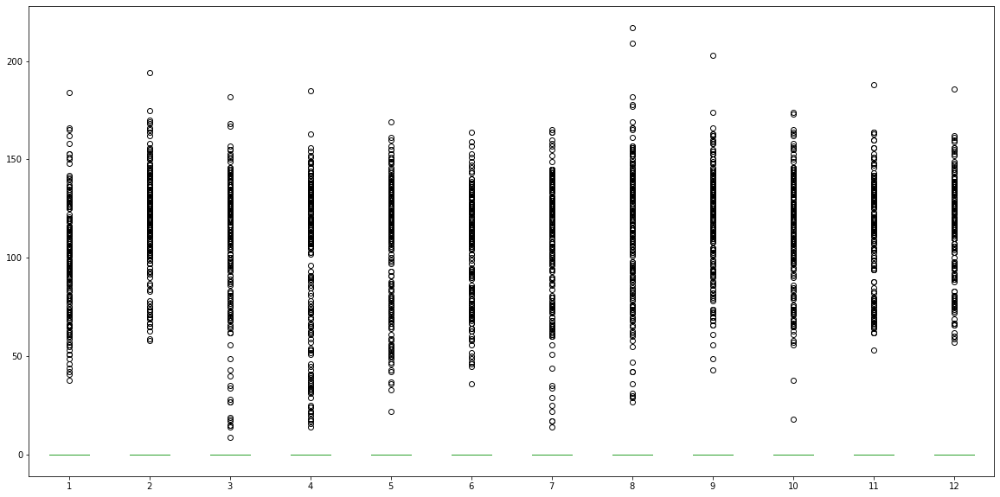

In [98]:
generate_boxplot('MES', subplots=False)

En la gráfica de caja anterior se puede observar:

- Los incidentes diarios por cada mes son erraticos, por lo que se observa que los datos se grafícan como outliers.
- Ningún mes tiene una media diaria.

Ahora visualizaremos un diagrama de caja acumulado x mes para los años 2014 al 2019.

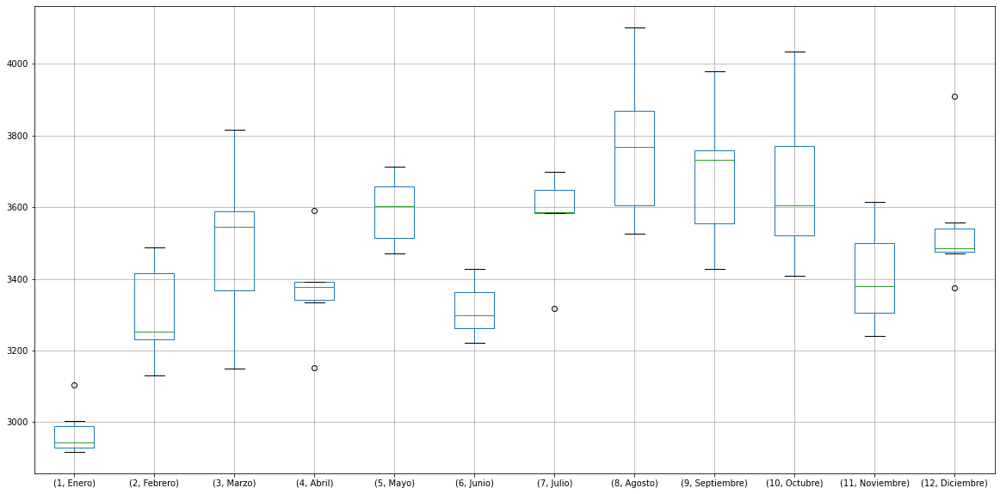

In [99]:
incidentes.pivot_table(index=['MES','NOMBRE_MES'], 
                       columns=['PERIODO'], 
                       values='OBJECTID', 
                       aggfunc='count', 
                       fill_value=0)\
            .T.sort_index()\
            .loc[2014:2019]\
            .plot.box(grid=True)

En la grafica anterior se excluye la información del año **2020**, por ser un año atipico y poder analizar los datos con grupo de datos más homogeneos. Diciendo esto, podemos observar que el **mes** que más incidentes acumulados tiene y su mediana es el mes de **Agosto**. Podemos decir que esto puede deberse a que la ciudad celebra **La Feria de las Flores**. Igualmente observamos que el mes de **Enero** es el más bajo en incidentes acumulados, esto es debido a la **temporada de vacaciones**, periodo en que la ciudad se ve muy desocupada en sus primeros 15 días.

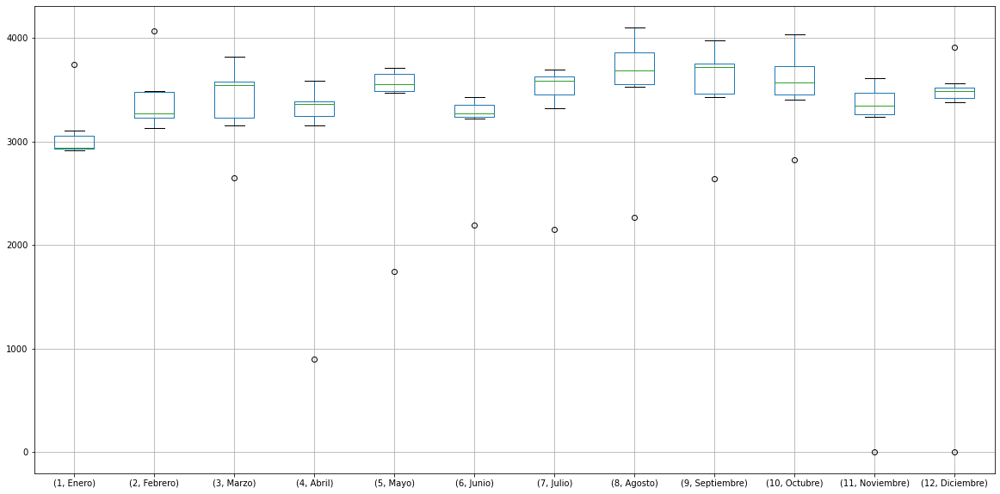

In [100]:
incidentes.pivot_table(index=['MES','NOMBRE_MES'], 
                       columns=['PERIODO'], 
                       values='OBJECTID', 
                       aggfunc='count', 
                       fill_value=0)\
            .T.sort_index()\
            .loc[2014:2020]\
            .plot.box(grid=True)

Vemos que debido al año 2020 el gráfico de caja cambio drasticamente en su distribución y se nota como los outliers cambiaron por cada mes.

A continuación veremos otro resumen de la columna **NOMBRE_MES** como esta distribuida la cantidad de incidentes en los **periodos** que conforman el data set.

In [101]:
incidentes_periodo_mes = incidentes.pivot_table(index='PERIODO', 
                       columns=['MES','NOMBRE_MES'], 
                       values='OBJECTID', 
                       aggfunc='count', 
                       fill_value=0).T.sort_index()

# Anexar nuevas columas calculadas
incidentes_periodo_mes['Total Fila'] = incidentes_periodo_mes.sum(axis=1)
incidentes_periodo_mes['Porcentaje'] = np.round(((incidentes_periodo_mes['Total Fila']\
                                                     / incidentes_periodo_mes['Total Fila'].sum()) * 100),4)

incidentes_periodo_mes\
    .sort_index()\
    .style\
        .format('{:,}')\
        .background_gradient(cmap=cm, axis=0, subset=[2014, 2015, 2016,2017,2018,2019,2020])\
        .apply(highlight_max, subset=['Total Fila'], axis=0)

,PERIODO,2014,2015,2016,2017,2018,2019,2020,Total Fila,Porcentaje
MES,NOMBRE_MES,,,,,,,,,
1,Enero,"2,942","2,924","3,004","3,105","2,943","2,917","3,743","21,578",7.8364
2,Febrero,"3,228","3,270","3,487","3,466","3,238","3,130","4,069","23,888",8.6753
3,Marzo,"3,817","3,602","3,547","3,543","3,310","3,151","2,652","23,622",8.5787
4,Abril,"3,392","3,391","3,590","3,335","3,364","3,153",898,"21,123",7.6712
5,Mayo,"3,661","3,651","3,557","3,713","3,501","3,471","1,741","23,295",8.46
6,Junio,"3,374","3,221","3,327","3,427","3,271","3,261","2,191","22,072",8.0158
7,Julio,"3,585","3,670","3,587","3,583","3,318","3,698","2,152","23,593",8.5682
8,Agosto,"3,526","3,685","3,851","3,876","3,579","4,102","2,270","24,889",9.0388
9,Septiembre,"3,503","3,761","3,716","3,750","3,428","3,979","2,638","24,775",8.9974


En la tabla resumen anterior podemos extraer lo siguiente:

- El año **2020** no esta completo con los incidentes del mes de **noviembre** y **diciembre**.
- Cual ha sido el mes que ha tenido más incidentes por cada periodo siendo este el mes de **Agosto** con un acumulado de **24,889** incidentes y con un porcentaje del **9.04%**.
- Los meses de **Aagosto** a **Octubre**, son los meses en que más se presntan incidentes, superando los **3,500** incidentes x mes a excepción del año **2020** y esto último se puede responsabilizar que es debido al tema de la pandemia mundial "**Covid-19**".

Acontinuación se presentará esta misma información en un gráfico de líneas.

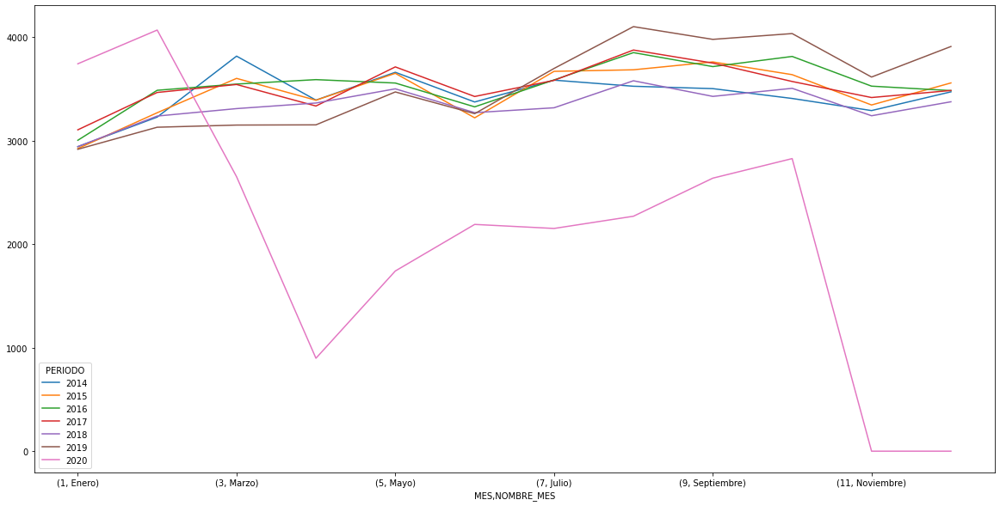

In [102]:
# plt.setp(ax.get_xticklabels(), rotation=90)
incidentes.pivot_table(index='PERIODO', 
                       columns=['MES','NOMBRE_MES'], 
                       values='OBJECTID', 
                       aggfunc='count', 
                       fill_value=0)\
          .T.sort_index().plot.line()

En el anterior gráfico podemos ver:

- La cantidad de **incidentes x cada mes x cada año**, identificando que los años del **2014 al 2019** tienen un comportamiento parecido y con tendecia a crecer.
- Además, se observa que el **3er trimestre** es donde más incidentes se presentan. 
- Ahora, vemos el año **2020** es un año atipico por lo temas de la pandemía del **covid-19**.

### Resumen Columna DIA
A continuación veremos información de la columna **DIA** como esta distribuida la cantidad de incidentes por cada periodo. Además se anexa un grafico de distribución de cada categoría y un grafico boxplot.

In [103]:
distribution_statistics_data('DIA')

,Registros,Distribución,Promedio,Mediana,Varianza,Desv. Estandar,Simetría,Kurtosis
16,9540,0.034646,3.822115,0.0,458.239286,21.406524,5.704074,32.110472
18,9422,0.034218,3.774840,0.0,452.940866,21.282407,5.751454,32.450428
10,9394,0.034116,3.763622,0.0,441.273161,21.006503,5.625846,30.722608
5,9355,0.033974,3.747997,0.0,445.937671,21.117236,5.747609,32.410682
21,9320,0.033847,3.733974,0.0,440.447038,20.986830,5.747907,32.685906
17,9292,0.033745,3.722756,0.0,440.492243,20.987907,5.746562,32.314178
6,9219,0.033480,3.693510,0.0,436.190194,20.885167,5.832276,33.867200
23,9168,0.033295,3.673077,0.0,427.889070,20.685480,5.716986,31.900542
12,9165,0.033284,3.671875,0.0,427.689886,20.680665,5.762343,32.742180
11,9143,0.033204,3.663061,0.0,421.874803,20.539591,5.717738,32.103444


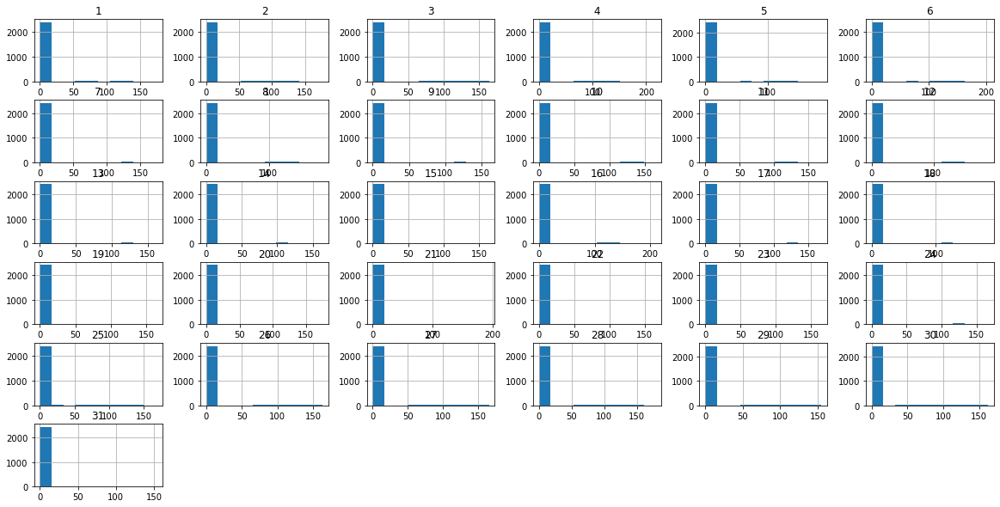

In [104]:
distribution_statistics_graph('DIA')

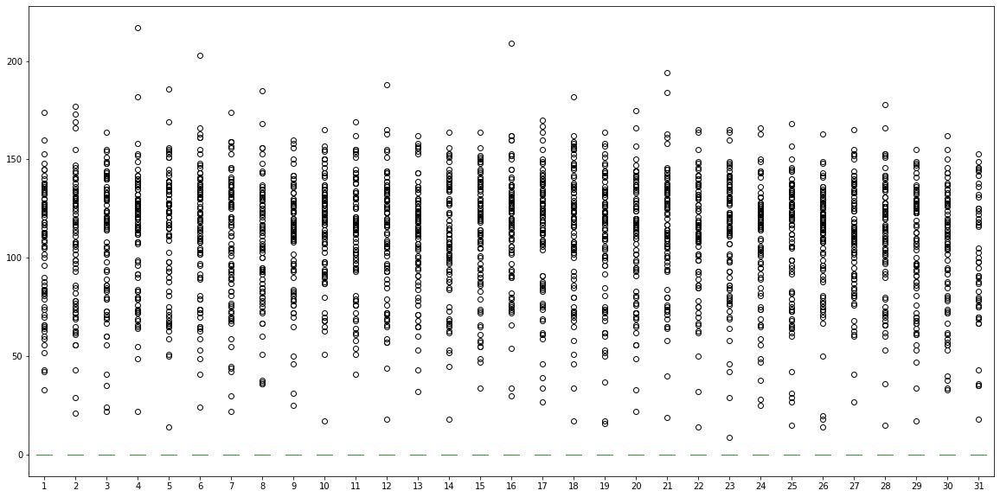

In [105]:
generate_boxplot('DIA', subplots=False)

In [106]:
incidentes_periodo_mes = incidentes.pivot_table(index='PERIODO', 
                       columns=['DIA'], 
                       values='OBJECTID', 
                       aggfunc='count', 
                       fill_value=0).T.sort_index()

# Anexar nuevas columas calculadas
incidentes_periodo_mes['Total Fila'] = incidentes_periodo_mes.sum(axis=1)
incidentes_periodo_mes['Porcentaje'] = np.round(((incidentes_periodo_mes['Total Fila']\
                                                     / incidentes_periodo_mes['Total Fila'].sum()) * 100),4)

incidentes_periodo_mes\
    .sort_index()\
    .style\
        .format('{:,}')\
        .background_gradient(cmap=cm, axis=0, subset=[2014, 2015, 2016,2017,2018,2019,2020])\
        .apply(highlight_max, subset=['Total Fila'], axis=0)

PERIODO,2014,2015,2016,2017,2018,2019,2020,Total Fila,Porcentaje
DIA,,,,,,,,,
1,"1,334","1,272","1,341","1,467","1,214","1,317",818,"8,763",3.1824
2,"1,157","1,274","1,392","1,415","1,372","1,489",784,"8,883",3.226
3,"1,459","1,368","1,296","1,348","1,433","1,345",882,"9,131",3.3161
4,"1,362","1,334","1,351","1,474","1,291","1,419",885,"9,116",3.3106
5,"1,498","1,344","1,472","1,359","1,310","1,576",796,"9,355",3.3974
6,"1,322","1,442","1,394","1,363","1,375","1,464",859,"9,219",3.348
7,"1,415","1,376","1,416","1,476","1,200","1,240",828,"8,951",3.2507
8,"1,294","1,245","1,425","1,379","1,188","1,484",815,"8,830",3.2068
9,"1,270","1,433","1,347","1,295","1,321","1,438",850,"8,954",3.2518


# Georeferenciar los Incidentes
Debido a la gran catidad de incidentes a georeferenciar en una sola área geografica, la cual es la ciudad de Medellín, se opta por realizar un filtro a la información y mostrar unos pocos registros en el mapa. Debido a que si se georeferencia toda la información toma varios minutos terminar el proceso y no es visiblemente claro tal cantidad de marcadores en el mapa.

Queda a potestad del lector o lectora tomar la información del data set de incidentes y realizar un filtro adecuado a las necesidades y graficar dicho resultado.

## Filtrando los datos
Se decide filtrar la información por la columna **GRAVEDAD** y su categoría igual a **MUERTO** para todos los periodos analizados, con el fin de que se regresarán pocos registros y poder graficarlos en un mapa. Para realizar lo anterior se contruye la siguiente consulta en el data set.

In [107]:
filtro = (incidentes['GRAVEDAD'] == 'MUERTO')
incidentes_gps = pd.DataFrame(incidentes
                              .where(filtro)
                              .groupby(['LONGITUD','LATITUD'])['GRAVEDAD']
                              .count()
                              .rename('Total')
                             )
incidentes_gps.reset_index(inplace=True)

Hallar la media de cada coordenada geografica [LONGITUD, LATITUD], con el fin de que cuando se muestre el mapa y con el zoom adecuado se visualice directamente la ciudad de Medellín.

In [108]:
lat_ini , lng_ini = incidentes_gps['LATITUD'].mean() , incidentes_gps['LONGITUD'].mean()
print(lat_ini,lng_ini)

6.248940226886072 -75.57836880417725


Recorrer la información del set de datos previamente filtrado y generar el mapa.

In [109]:
# Adiccionar los marcadores clusterizados
import folium
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

# Crear el mapaa
mapa_1 = folium.Map(location=[lat_ini,lng_ini], zoom_start=12)

# Recorrer los datos
for i in range(len(incidentes_gps)):
    lat = incidentes_gps.iloc[i]['LATITUD']
    lng = incidentes_gps.iloc[i]['LONGITUD']
    toolTip = "Nro de Incidentes:" + str(incidentes_gps.iloc[i]['Total']) + \
            " - Ubicaci&oacute;n: [" + str(lat) + " " + str(lng) + "]"
                                
    colorIcon = "black" if(incidentes_gps.loc[i]['Total']>1) else "red"

    folium.Marker(location=[lat,lng],tooltip=toolTip, icon=folium.Icon(color=colorIcon, icon='info-sign')).add_to(mapa_1)

# Ver el mapa
mapa_1

En el mapa anterior podemos observar lo siguiente:

- Cada marcador tiene un mensaje que indica el total de incidentes y su posición geografica.
- Los marcadores de color negro indican que en dicha ubicación a habido más de una persona muerta en ese punto.

Ahora graficaremos la misma información filtrada pero de forma agrupada y visualizarla de esta forma en el mapa.

In [110]:
# Crear el mapaa
mapa_2 = folium.Map(location=[lat_ini,lng_ini], zoom_start=12)

mc = MarkerCluster()
for i in range(len(incidentes_gps)):
    lat = incidentes_gps.iloc[i]['LATITUD']
    lng = incidentes_gps.iloc[i]['LONGITUD']
    toolTip = "Nro de Incidentes:" + str(incidentes_gps.iloc[i]['Total']) + \
            " - Ubicacion: [" + str(lat) + " " + str(lng) + "]"
     
    colorIcon = "black" if(incidentes_gps.loc[i]['Total']>1) else "red"
    
    mc.add_child(folium.Marker(location=[lat,lng],tooltip=toolTip, icon=folium.Icon(color=colorIcon, icon='info-sign')))
    mapa_2.add_child(mc)
# Ver el mapa
mapa_2

En el mapa anterior podemos observar lo siguiente:

- Las áreas de la ciudad en las que se han presentado incidentes y a habido almenos un muerto. Esto se puede observar al colocar el apuntador (mouse) sobre el marcador que agrupa la cantidad de incidentes, mostrando el área que cubre dicha cantidad.
- Los marcadores de color negro indican que en dicha ubicación a habido más de una persona muerta en ese punto.

**<p style="color:red">Nota:** sobre los datos graficados geograficamente en los dos mapas anteriores:</p>

- Existe una cantidad de registros fuera del área geografica de la ciudad de Medellín, lo que indica que al momento de registrar esta información fue mal registrada. Ya que aparecen registros en el municipio de **Heliconia** y **Támisis**.

Hemos fianlizado esta sección de análisis descriptivo y vamos a eliminar toda la memoría del **Jupyter Notebook** e iniciamos una nueva sección. Esto eliminará todas las variables utilizadas hasta ahora sin solicitar confirmación.

In [111]:
# borrar todas las variables en IPython - Sin confirmación del usuario
%reset -f 

****
# Visualización de los datos en forma de series de tiempo

In [112]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (20,10)
import seaborn as sns

pathData = "D:\MedData\Incidentes georreferenciados\Incidentes_georreferenciados_"
extension = ".csv"

columnas = ['FECHA','HORA','PERIODO','MES','DIA','CLASE','GRAVEDAD','COMUNA','DISENO','DIA_NOMBRE','MES','LONGITUD','LATITUD']

Abrir el set de datos depurado y generado en la sección análisis de datos.

In [113]:
incidentes = pd.read_csv(pathData + "all" + extension, parse_dates=['FECHA','Fecha_Hora'], index_col=['Fecha_Hora'])
incidentes

,OBJECTID,FECHA,HORA,PERIODO,MES,NOMBRE_MES,DIA,DIA_NOMBRE,CLASE,GRAVEDAD,COMUNA,DISENO,LONGITUD,LATITUD
Fecha_Hora,,,,,,,,,,,,,,
2014-01-01 02:20:00,211279,2014-01-01,02:20:00,2014,1,Enero,1,MIÉRCOLES,Choque,HERIDO,Belén,Tramo de via,-75.602726,6.219016
2014-01-01 12:50:00,211280,2014-01-01,12:50:00,2014,1,Enero,1,MIÉRCOLES,Atropello,HERIDO,La Candelaria,Tramo de via,-75.568185,6.260009
2014-01-01 01:00:00,211281,2014-01-01,01:00:00,2014,1,Enero,1,MIÉRCOLES,Atropello,HERIDO,Manrique,Tramo de via,-75.549943,6.264765
2014-01-01 12:37:00,211282,2014-01-01,12:37:00,2014,1,Enero,1,MIÉRCOLES,Atropello,HERIDO,Belén,Tramo de via,-75.607611,6.234327
2014-01-01 10:40:00,211283,2014-01-01,10:40:00,2014,1,Enero,1,MIÉRCOLES,Caída de Ocupante,HERIDO,Doce de Octubre,Tramo de via,-75.579685,6.299968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-03-02 06:50:00,815518,2020-03-02,06:50:00,2020,3,Marzo,2,LUNES,Atropello,HERIDO,Popular,Lote o Predio,-75.550848,6.288293
2020-01-15 07:00:00,815519,2020-01-15,07:00:00,2020,1,Enero,15,MIÉRCOLES,Choque,SOLO DAÑOS,Laureles Estadio,Interseccion,-75.587973,6.254189
2020-01-18 04:30:00,815520,2020-01-18,04:30:00,2020,1,Enero,18,SÁBADO,Choque,HERIDO,Belén,Tramo de via,-75.576866,6.232463


##### Información sobre la serie de tiempo

Al visualizar la información de la página de [MedData](http://medata.gov.co/dataset/incidentes-viales-georreferenciada-2014) se puede observar que en su pestaña [datos](https://geomedellin-m-medellin.opendata.arcgis.com/datasets/incidentes-georreferenciados-2014/data) el campo **HORA** muestra si el incidente fue de mañana o tarde (AM o PM), pero al descargar el data set completo dicho dato no especifica con claridad la **HORA**, si el incidente se presento en el horario AM o PM.

Sabiendo lo anterior, se envió un correo electronico al responsable de la página y pronto respondío, diciendo que estan escalando el caso e informaran cuando tengan una respuesta.

A pesar de esto se continuará con el análsis de series de tiempo de los incidentes que tenemos en nuestro data set.

**Vamos a realizar la siguiente revisión:**

Estamos análizando 7 periodos o años [del 2014 al 2020], lo que significa que debemos tener el acumulado de incidentes por cada día de todos los periodos, siendo un total de $7 * 365 = 2,555$ días para tener la serie de tiempo completa por día.

Entonces agruparemos la información por la columna **FECHA** y contamos cada incidente presentado cada día y extraemos la cantiad de filas, lo que corresponde a la cantidad de días con datos que tiene el data set.

In [114]:
incidentes[['OBJECTID','FECHA']].groupby('FECHA').count().shape[0]

2496

Si miramos la diferencia entre ambos datos $2,555 - 2,496 = 59$ días faltantes, que corresponden a los que vimos como ausentes en la sección anterior cuando hicimos el análisis categorico del campo **NOMBRE_MES** y se observo, que los datos del mes de **noviembre** y **diciembre** del año **2020** no estan registrados en su respectivo repositorio. Y lo podemos verificar con la siguiente consulta al set de datos.

In [115]:
incidentes[incidentes['FECHA']>'2020-10-31']

,OBJECTID,FECHA,HORA,PERIODO,MES,NOMBRE_MES,DIA,DIA_NOMBRE,CLASE,GRAVEDAD,COMUNA,DISENO,LONGITUD,LATITUD
Fecha_Hora,,,,,,,,,,,,,,


A continuación se crearan varios **data set** para diferentes frecuencias de tiempo como [**minuto**, **hora**, **día**, **mes**, **trimestre**, **año**] de los incidentes de transito que tenemos a dispoición.

In [116]:
incidentes_min = pd.DataFrame(incidentes.resample('T')['OBJECTID'].count().rename('Total'))
incidentes_hou = pd.DataFrame(incidentes.resample('H')['OBJECTID'].count().rename('Total'))
incidentes_day = pd.DataFrame(incidentes.resample('D')['OBJECTID'].count().rename('Total'))
incidentes_mon = pd.DataFrame(incidentes.resample('M')['OBJECTID'].count().rename('Total'))
incidentes_tri = pd.DataFrame(incidentes.resample('Q')['OBJECTID'].count().rename('Total'))
incidentes_yea = pd.DataFrame(incidentes.resample('A')['OBJECTID'].count().rename('Total'))

In [117]:
reg_label = ['Minutos', 'Horas', 'Días', 'Meses', 'Trimestres', 'Años']

reg_resample = [ incidentes_min.shape[0]
                ,incidentes_hou.shape[0]
                ,incidentes_day.shape[0]
                ,incidentes_mon.shape[0]
                ,incidentes_tri.shape[0]
                ,incidentes_yea.shape[0]]

reg_esperados = [7*365*24*60
                ,7*365*24
                ,7*365
                ,7*12
                ,7*4
                ,7]

df_reg = pd.DataFrame({'Frecuencia':reg_label,'Calculados':reg_resample, 'Esperados':reg_esperados})
df_reg['Faltantes'] = df_reg['Esperados'] - df_reg['Calculados']
df_reg.set_index('Frecuencia', inplace=True)
df_reg.style.format('{:,}')

,Calculados,Esperados,Faltantes
Frecuencia,,,
Minutos,"3,593,371","3,679,200","85,829"
Horas,"59,890","61,320","1,430"
Días,"2,496","2,555",59
Meses,82,84,2
Trimestres,28,28,0
Años,7,7,0


Con la información anterior estamos verificando que el método **RESAMPLE** de la librería **PANDAS** nos genera los registros necesarios para la frecuencia enviada como parámetro [minuto=**T**, hora=**H**, día=**D**, mes=**M**, trimestre=**Q**, año=**A**], ya que nuestro data set de incidentes solo tiene 275,356 registros y entre estos estan los incidentes que se generan cada día. Sin embargo podemos ver que cada nuevo data frame calculado y/o creado con esté método nos genera los registros de tiempo necesarios en la frecuencia a analizar asi no tenga incidentes registrados para dicha frecuencia o los acumula según sea la frecuencia, esto anterior es para graficarlos de forma correcta como serie de tiempo.

Ahora, vemos que el data set de minutos posee 3,593,371 registros que contra los 275,356 que tenemos, entonces se han generado la cantidad de registros vacios para esta frecuencia y sin dato registrado en este.

Para las demás frecuencias, la cantidad de registros generados son infererioes a los de nuestro data set, siendo estos un acumulado de incidentes para estas frecuencias.

Igualmente, podemos visualizar que existen unos registros faltantes, esto se debe que según la frecuencia en que se capturan los datos y el data set tiene el registro de la fecha, hora y minuto en el que sucedio el incidente, entonces estos registros son los espacios de tiempo adiccionales que nos crea el método resample de pandas para cada una de la frecuencias, esto debido a lo que descubrimos en la sección anterior al analizar la columa **NOMBRE_MES** en que visualizamos la ausencia de datos para dos meses.

En este momento crearemos funciones para visualizar un grafico de serie de tiempo según el periodo de tiempo o frecuencia enviada como parámetro.

In [118]:
def graph_data_one_serie(S1,PT,PS1,Periodo):
    fig, ax = plt.subplots()
    fig.suptitle('Cantidad de Incidentes Automovilísticos en la Ciudad de Medellín\n'+\
                 'Periodo: '+ Periodo + '\n'+\
                 'Frecuencia de tiempo en: %s' % (PT), fontsize=20)

    ax.set_ylabel('Cantidad de Incidentes Automovilísticos x ' + PS1)
    ax.set_xlabel(PS1 + ' en el que se Presento el Incidente')

    ax.plot(S1, label='Cantidad de Incidentes Automovilísticos x ' + PS1)

    legend = ax.legend(loc='upper left', shadow=True, fontsize='x-large')
    
    plt.ylim=(0,400)
    plt.grid()
    plt.show()
    
def graph_data_two_series(S1,S2,PT,PS1,PS2,Periodo):
    fig, ax = plt.subplots()
    fig.suptitle('Cantidad de Incidentes Automovilísticos en la Ciudad de Medellín\n'+\
                 'Periodo: '+ Periodo + '\n'+\
                 'Frecuencia de tiempo en: %s' % (PT), fontsize=20)
    ax.set_ylabel('Cantidad de Incidentes Automovilísticos x ' + PS1)
    ax.set_xlabel(PS1 + ' en el que se Presento el Incidente')

    ax.plot(S1, label='Cantidad de Incidentes Automovilísticos x ' + PS1)
    ax.plot(S2, label='Promedio de Incidentes Automovilísticos x ' + PS2)

    legend = ax.legend(loc='upper left', shadow=True, fontsize='x-large')
    plt.ylim=(0,400)
    plt.grid()
    plt.show()
    
def generate_graph_type(col, freq, kind, categories,subplots=True):  
    df_col = incidentes.pivot_table(index=incidentes.index, 
                           columns=[col], 
                           values='OBJECTID', 
                           aggfunc='count', 
                           fill_value=0).sort_index()
    
    df_col = df_col.resample(freq)[categories].sum()
    
    if(kind == 'plot'):    
        df_col.plot(subplots=subplots)
    elif(kind =='corr'):
        sns.heatmap(df_col.corr(), annot = True)
        plt.show()
        
def geneate_graph_type_two_colums(col1,col2,fkey,idx,freq,kind,subplots=True):
    df_col1 = incidentes\
        .pivot_table(index=incidentes.index, columns=[col1], values='OBJECTID',  aggfunc='count',  fill_value=0)\
        .reset_index()

    df_col2 = incidentes\
        .pivot_table(index=incidentes.index, columns=[col2],  values='OBJECTID', aggfunc='count', fill_value=0)\
        .reset_index()

    df_col = df_col1.merge(df_col2, left_on=fkey, right_on=fkey).set_index(idx)

    categories = df_col.columns


    df_col = df_col.resample(freq)[categories].sum()

    if(kind == 'plot'):    
        df_col.plot(subplots=subplots)
    elif(kind =='corr'):
        sns.heatmap(df_col.corr(), annot = True)
        plt.show()    

In [ ]:
Ahora graficaremos la distribución de incidentes diarios

In [ ]:
incidentes_day.plot.hist(title='Histograma de incidentes diarios', bins=200)

#### Vamos a ver graficamente cada uno de estos set de datos en diferentes frecuencias

Por lo general, los gráficos de líneas son la mejor opción para presentar datos de series temporales, pero los gráficos escalonados y de columnas también se pueden usar como alternativas.

**Vamos a gráficar los datos por la frecuencia Minutos**

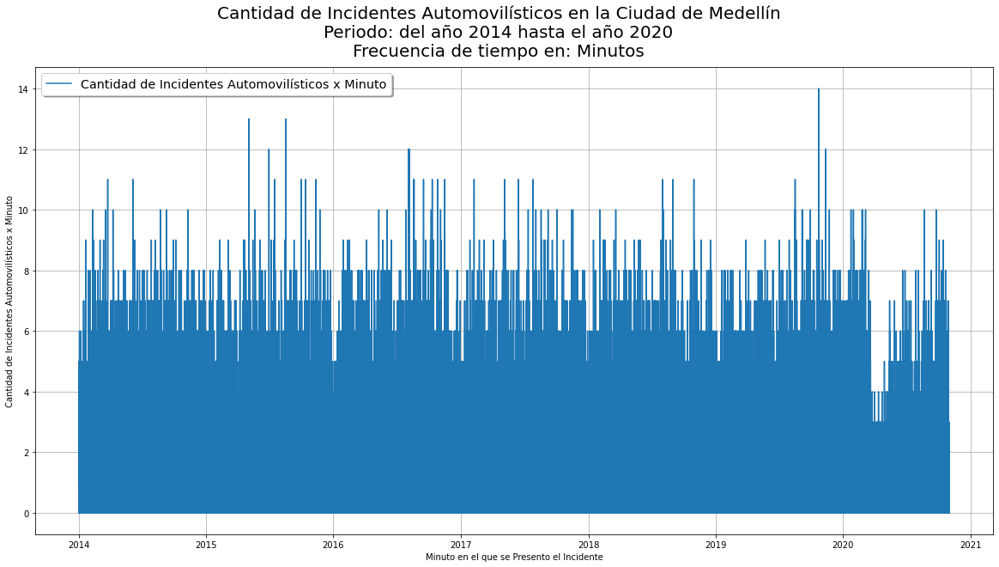

In [119]:
graph_data_one_serie(incidentes_min.Total,'Minutos','Minuto','del año 2014 hasta el año 2020')

Vemos que dicho grafico no es legible, para ver un gráfico más claro en esta frecuencia, haremos un filtro y tomaremos información de un solo día en particular. Por lo que estaríamos viendo los incidentes presentados en un periodo de 24 horas.

In [120]:
fecha_hora_inicial, fecha_hora_final = '2014-05-09 00:00:00', '2014-05-09 23:59:59'

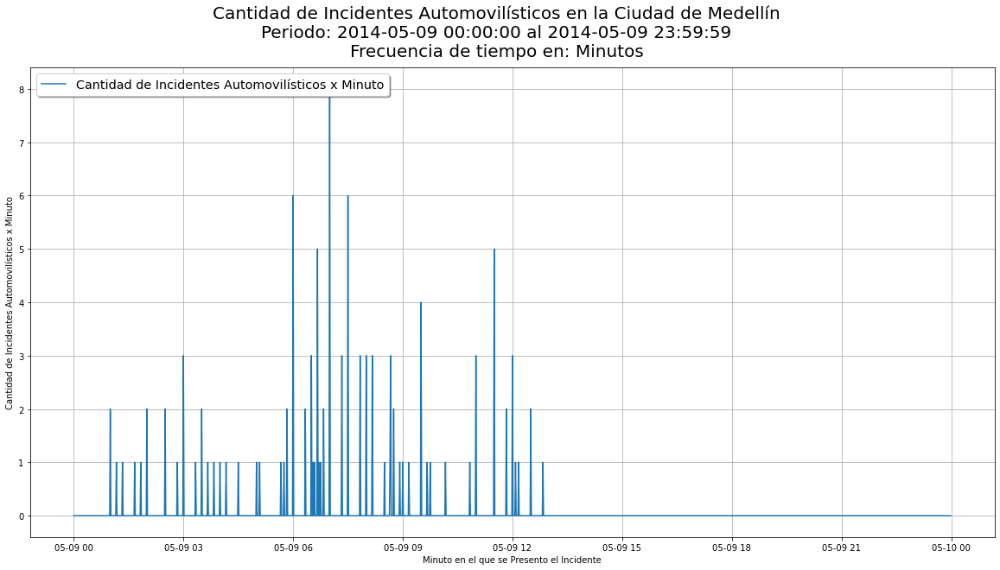

In [121]:
graph_data_one_serie(incidentes_min.loc[fecha_hora_inicial:fecha_hora_final].Total,'Minutos','Minuto', 
                     fecha_hora_inicial + ' al ' + fecha_hora_final)

En el gráifco anterior se puede observar la problematica que tenemos al no tener claro si el incidente se presento en hora de AM o PM. Dicho esto, ajustaremos la hora y poder visualizar un poco mejor el gráfico para las horas de la mañana, sabiendo que acá esta acumulado todos los incidentes ocurridos durante el día escogido aleatoriamente.

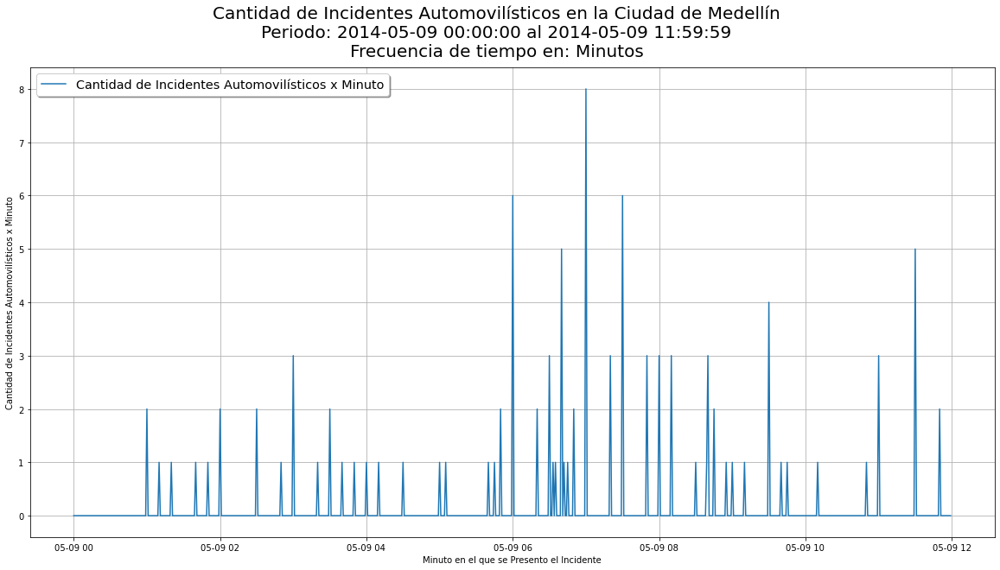

In [122]:
fecha_hora_final = '2014-05-09 11:59:59'
graph_data_one_serie(incidentes_min.loc[fecha_hora_inicial:fecha_hora_final].Total,'Minutos','Minuto',
                    fecha_hora_inicial + ' al ' + fecha_hora_final)

Vemos que este grafico de solo medio día de datos, la mayoría de incidentes se presentan entre las 6 y 8 horas, lo que podemos decir, es que son las horas pico de la ciudad Medellín, que corresponden entre las horas 6 y 8 horas y las 18 y 20 horas.

Ahora, vamos a gráficar los datos por la frecuencia **HORA**.

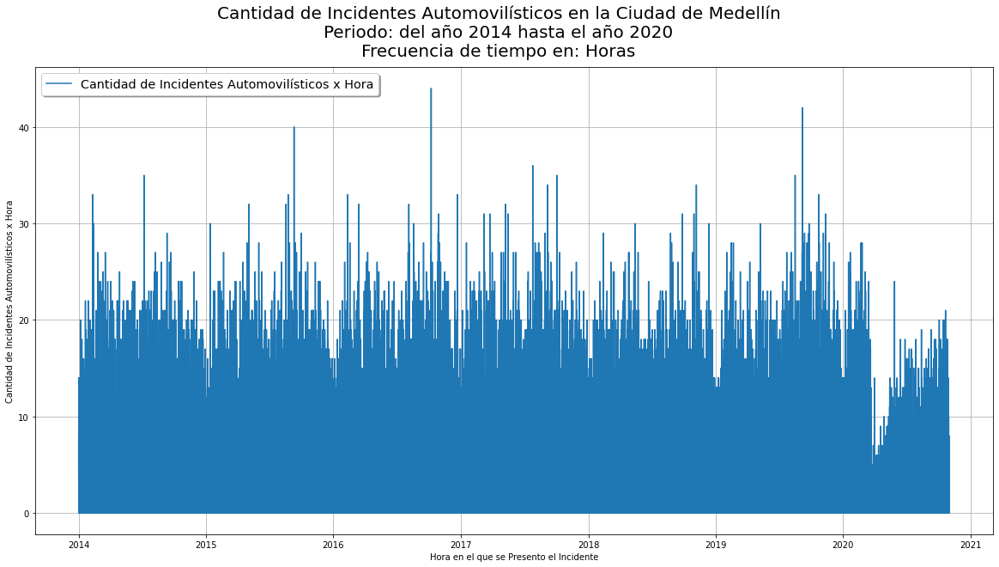

In [123]:
graph_data_one_serie(incidentes_hou.Total,'Horas','Hora','del año 2014 hasta el año 2020')

El gráfico anterior corresponde a la cantidad de incidentes por hora, lo que da como resultado lo mismo que vimos del gráfico de minutos, un gráfico muy denso de datos debido a la frecuencia seleccionada y la amplitud de tiempo gráficado y la cantidad de incidentes registrados, por lo que pasaremos a graficar solo un porción de tiempo cualquiera.

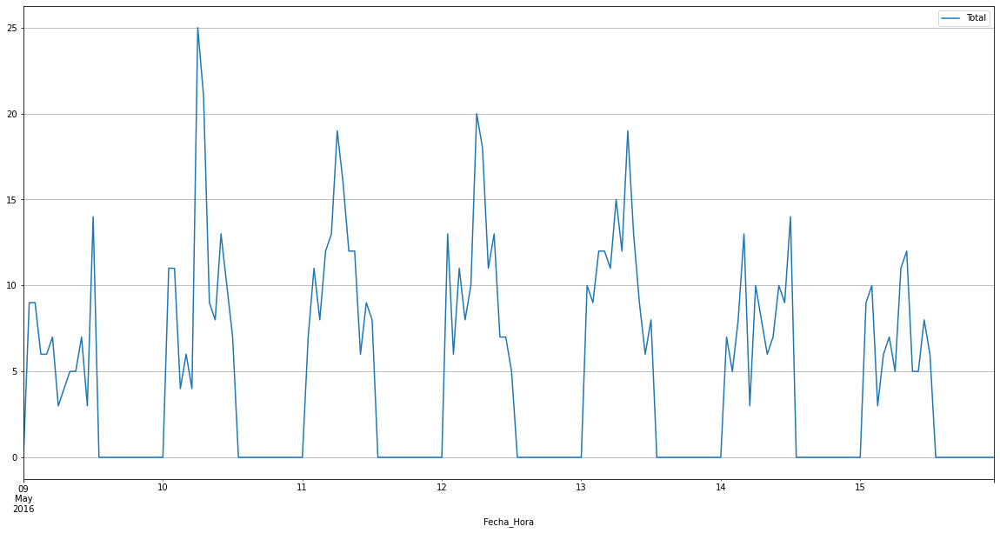

In [124]:
incidentes_hou.loc["2016-05-09 00:00:00":"2016-05-15 23:59:59"].plot(grid=True)

En grafico anterior se muestra la información de una semana de incidentes, en la que observa la ausencia de datos en las horas de la tarde PM valores correspondientes a 0 en el gráfico, razón que ya fue explicada previamente. Dicho esto y sabiendo que la información de todo el día esta acumulada, podemos decir que para esta semana existe un patron, al menos para los dias 11 al 13 que tienen casi la misma cantidad de incidentes.

Ahora, vamos a gráficar los datos por la frecuencia **DÍA**, además su media semanal.

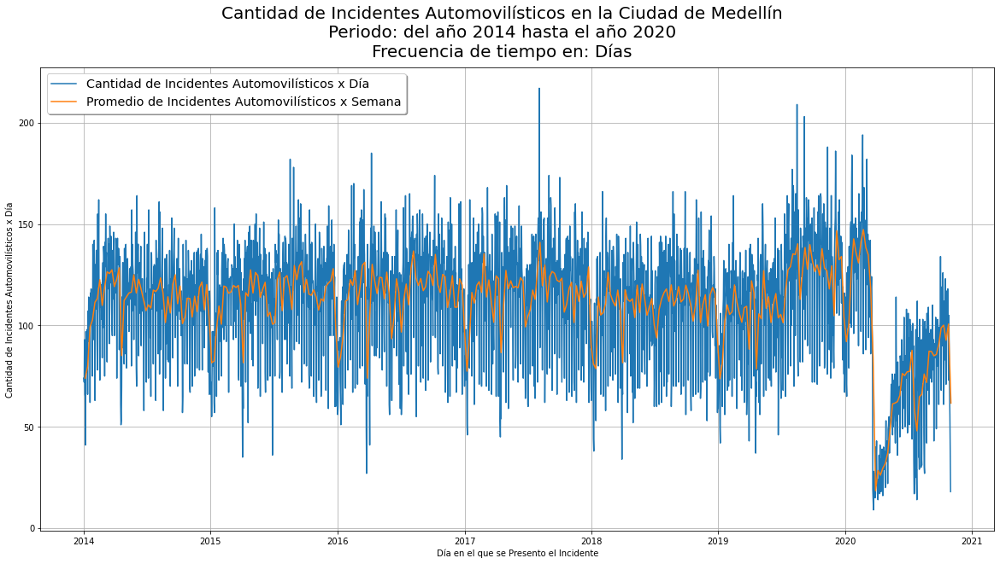

In [125]:
graph_data_two_series(incidentes_day.Total,incidentes_day.resample('W').mean()
                      ,'Días','Día','Semana','del año 2014 hasta el año 2020'
                     )

Ahora, vamos a gráficar los datos por la frecuencia **DÍA**, además su media mensual.

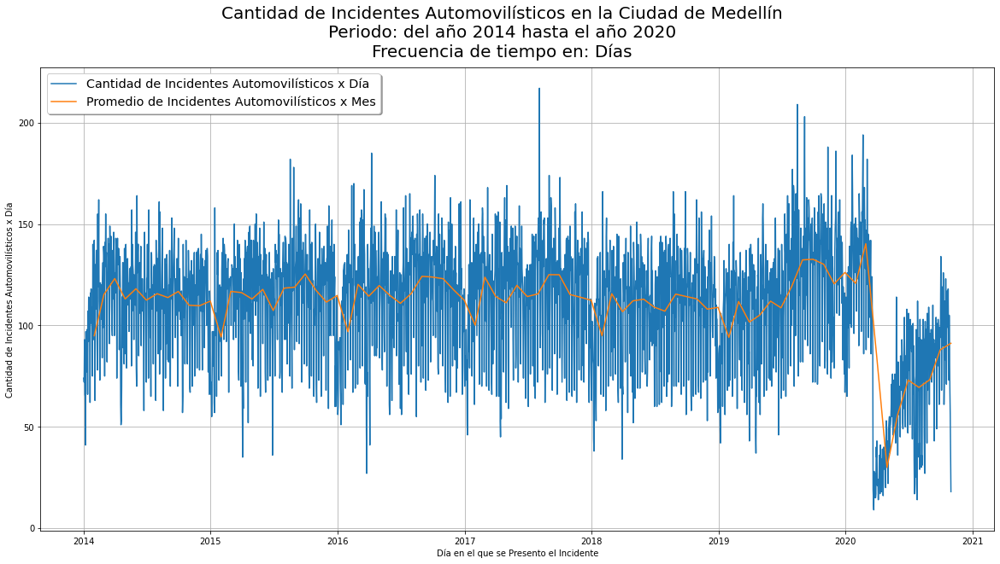

In [126]:
graph_data_two_series(incidentes_day.Total,incidentes_day.resample('M').mean()
                      ,'Días','Día','Mes','del año 2014 hasta el año 2020'
                     )

Ahora, vamos a gráficar los datos por la frecuencia **MES**, además su media anual.

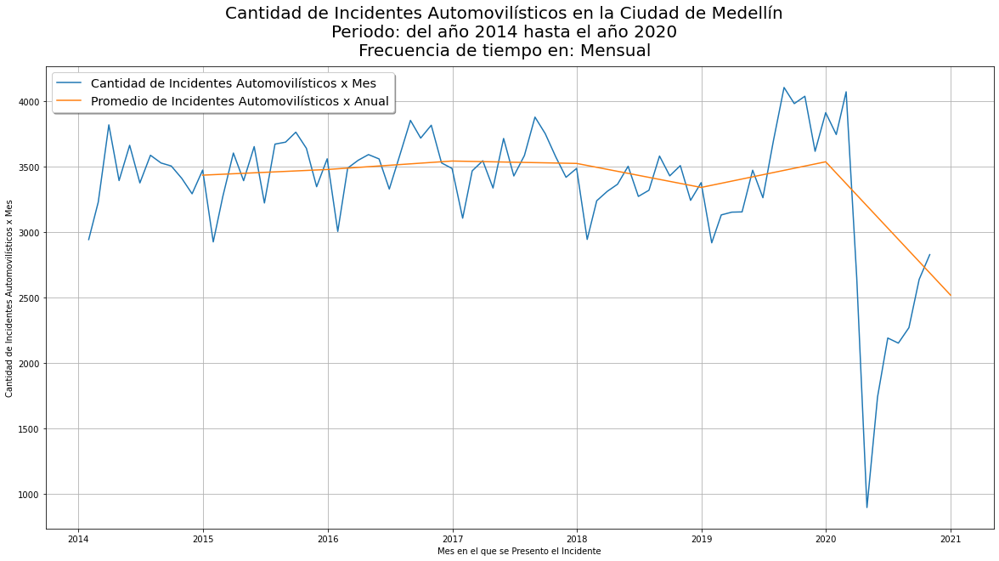

In [127]:
graph_data_two_series(incidentes_mon.Total,incidentes_mon.resample('A').mean()
                      ,'Mensual','Mes','Anual','del año 2014 hasta el año 2020'
                     )

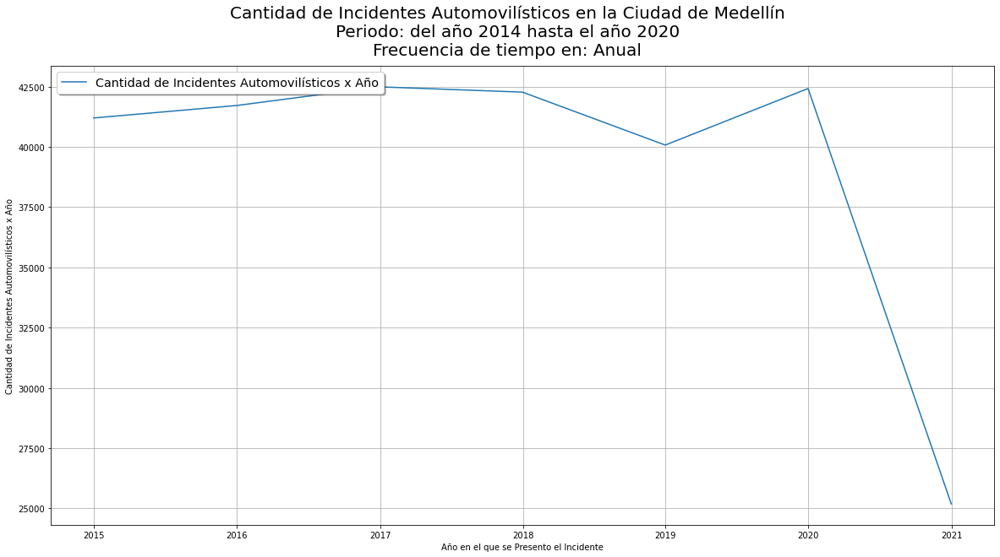

In [128]:
graph_data_one_serie(incidentes_yea,'Anual','Año','del año 2014 hasta el año 2020')

### Ahora graficaremos las columnas categoricas

Como vismos en graficas anteriores las frecuencias, minutos y horas son gráficas inadecuadas si se muestra todo el data set, solo se podrían ver bien para un rango de tiempo reducido por lo que serán descartadas. También descartermos la frecuencia anual ya que el gráfico no sería muy diciente por la gran cantidad de datos en un año y no se verían una tendencia correcta.
Por lo que solo graficaremos para las frecuencias Dia=**D**, Mes=**M** y Trimestre=**Q**, con el fin de visualizarlas de mejor forma e interpretarlas visualmente ya que los comentarios a estas fueron realizados en la sección de análisis descriptivo. Ahora si se encuentra algo diferente será comentado.

#### Columna GRAVEDAD

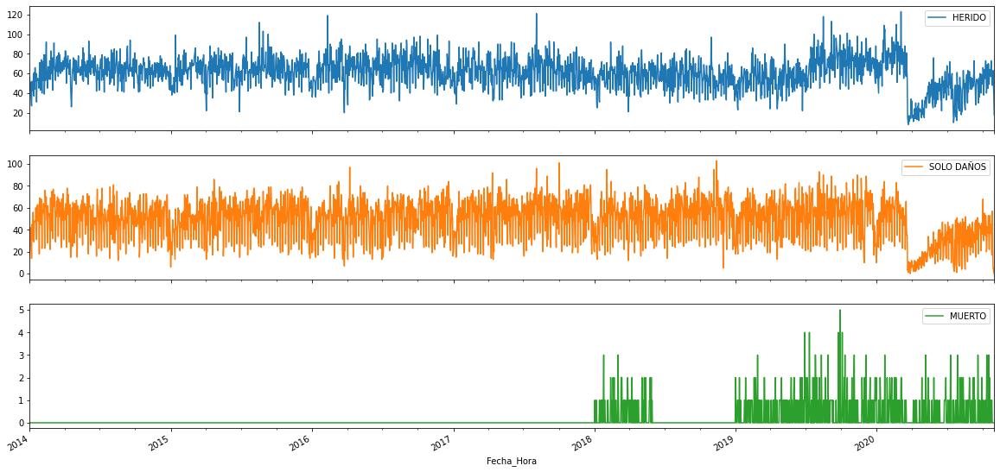

In [129]:
generate_graph_type('GRAVEDAD', 'D', 'plot', incidentes['GRAVEDAD'].unique().tolist())

En gráfico anterior se puede observar:

- Parte del 1er semestre y todo el 2do semestre del año 2018 no hay registros de incidentes con la categoría **MUERTO**, en este tipo de graficas se puede observar estas anaomilias de la información, observando rapidamente la ausencia de datos en ciertos rangos de tiempo.

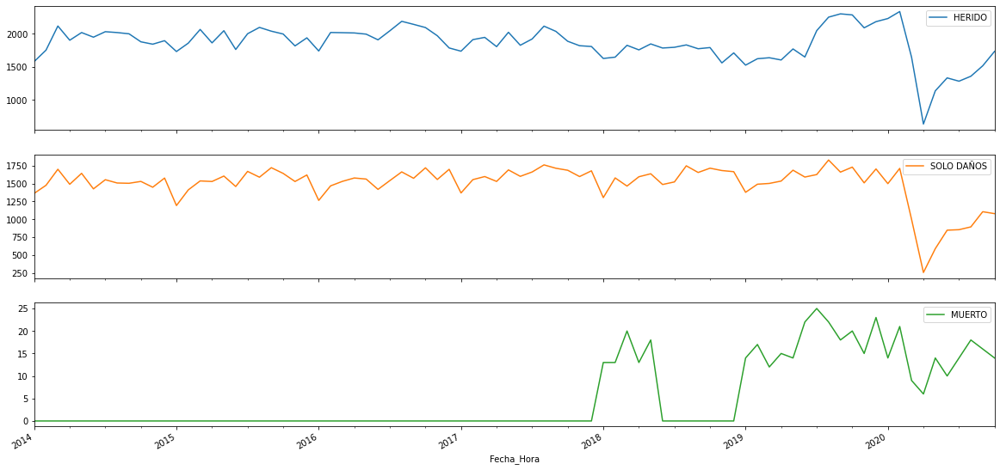

In [130]:
generate_graph_type('GRAVEDAD', 'M', 'plot', incidentes['GRAVEDAD'].unique().tolist())

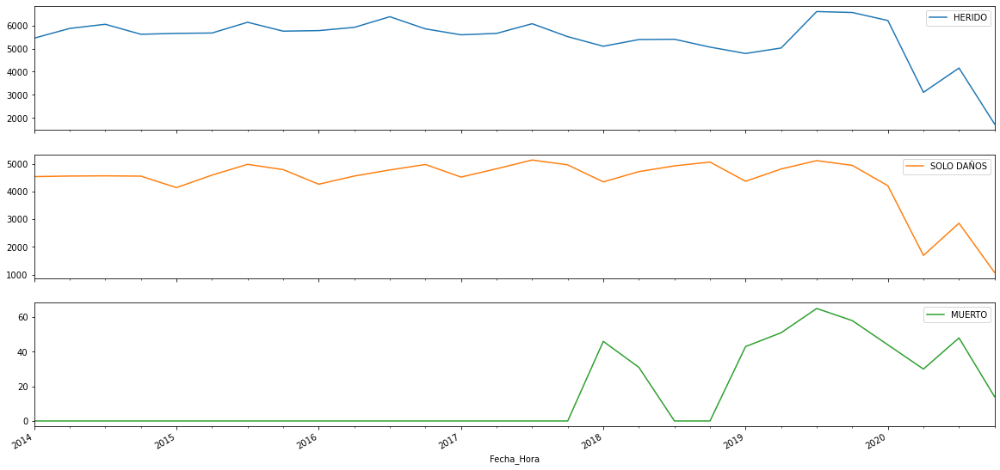

In [131]:
generate_graph_type('GRAVEDAD', 'Q', 'plot', incidentes['GRAVEDAD'].unique().tolist())

#### Columna CLASE

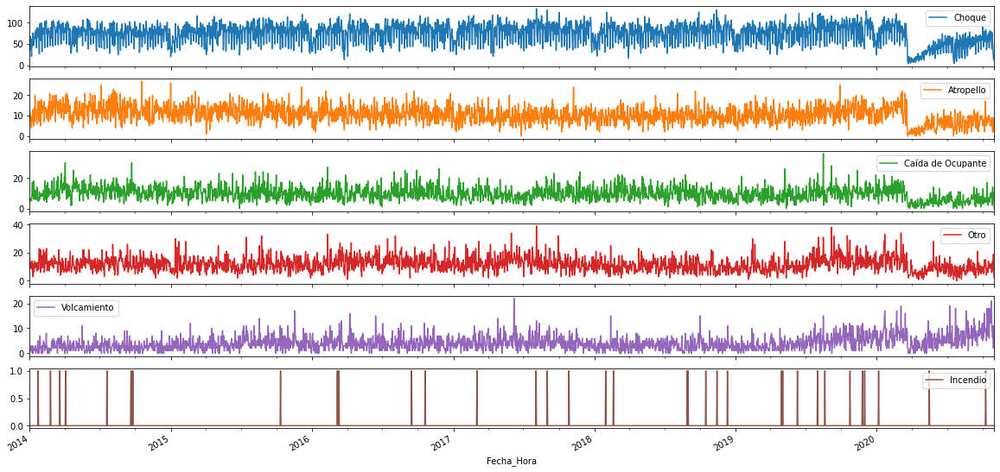

In [132]:
generate_graph_type('CLASE', 'D', 'plot', incidentes['CLASE'].unique().tolist())

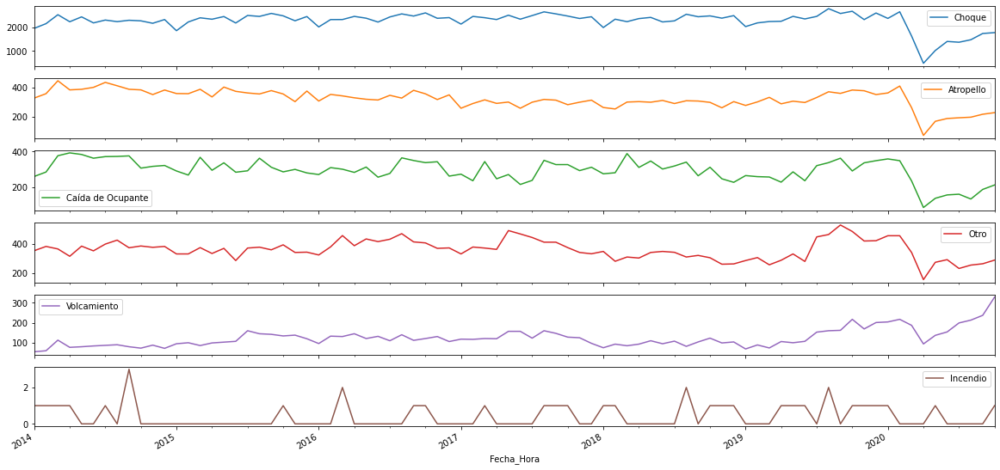

In [133]:
generate_graph_type('CLASE', 'M', 'plot', incidentes['CLASE'].unique().tolist())

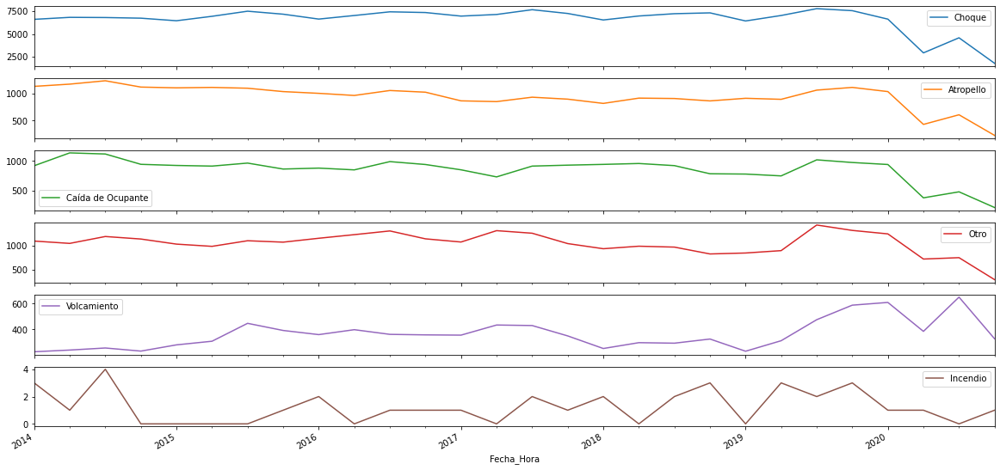

In [134]:
generate_graph_type('CLASE', 'Q', 'plot', incidentes['CLASE'].unique().tolist())

#### Columna DISENO

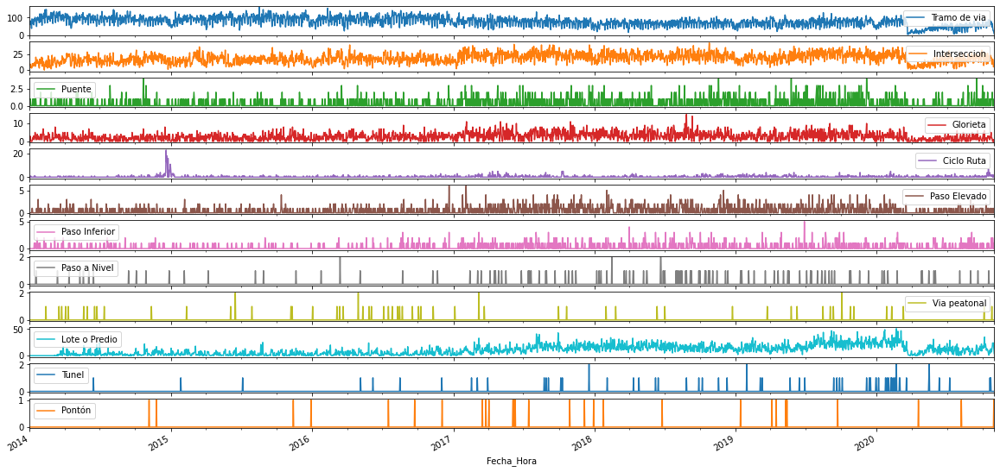

In [135]:
generate_graph_type('DISENO', 'D', 'plot', incidentes['DISENO'].unique().tolist())

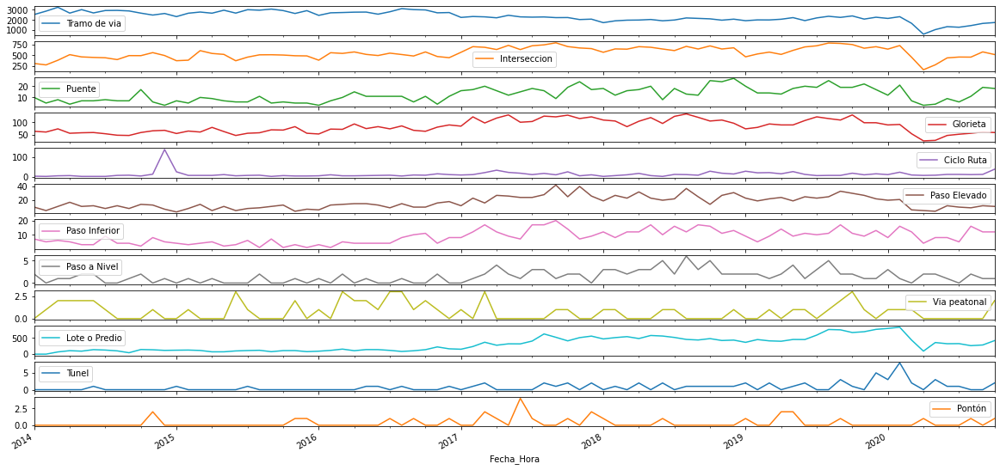

In [136]:
generate_graph_type('DISENO', 'M', 'plot', incidentes['DISENO'].unique().tolist())

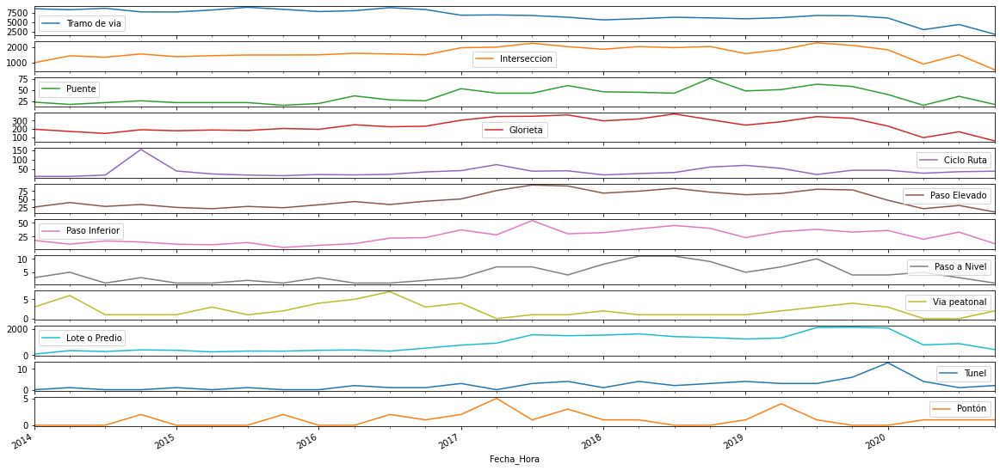

In [137]:
generate_graph_type('DISENO', 'Q', 'plot', incidentes['DISENO'].unique().tolist())

#### Columna COMUNA

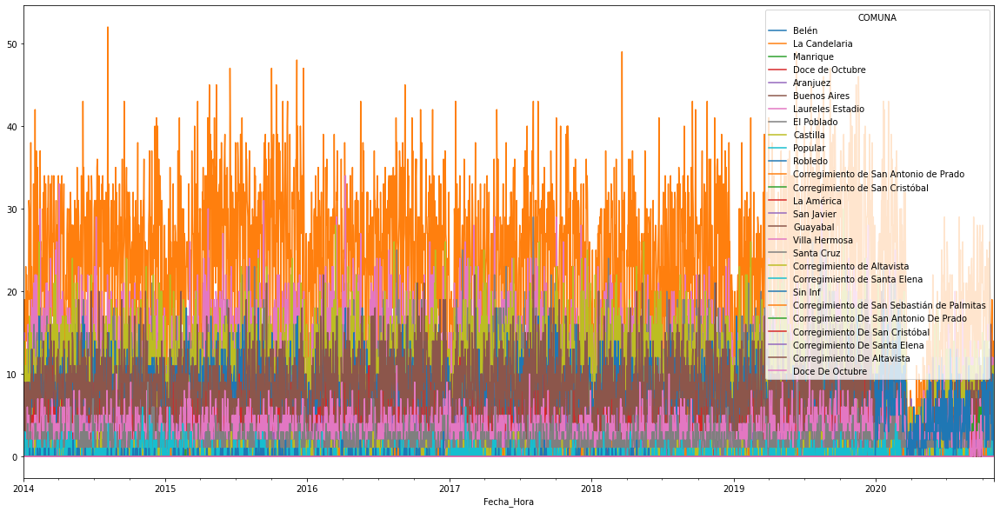

In [138]:
generate_graph_type('COMUNA', 'D', 'plot', incidentes['COMUNA'].unique().tolist(),subplots=False)

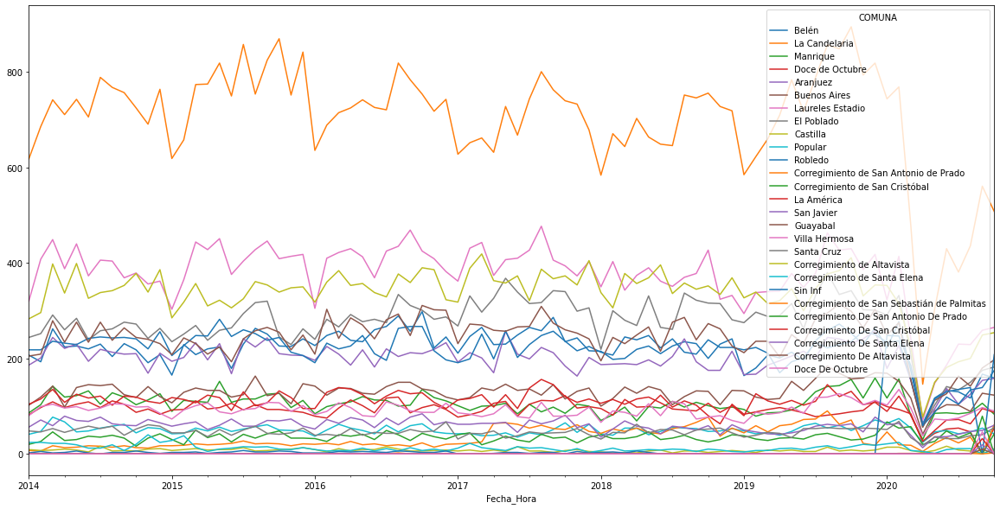

In [139]:
generate_graph_type('COMUNA', 'M', 'plot', incidentes['COMUNA'].unique().tolist(),subplots=False)

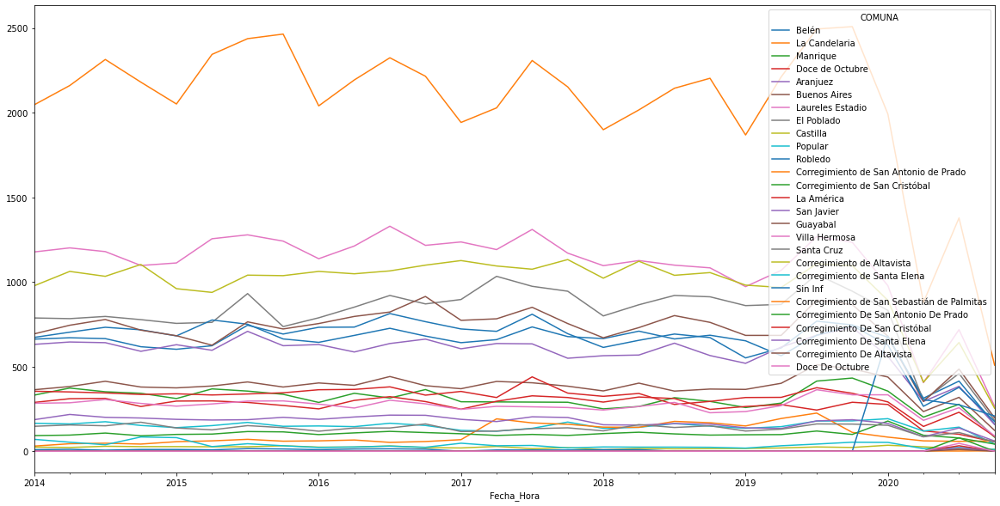

In [140]:
generate_graph_type('COMUNA', 'Q', 'plot', incidentes['COMUNA'].unique().tolist(),subplots=False)

#### Columna MES

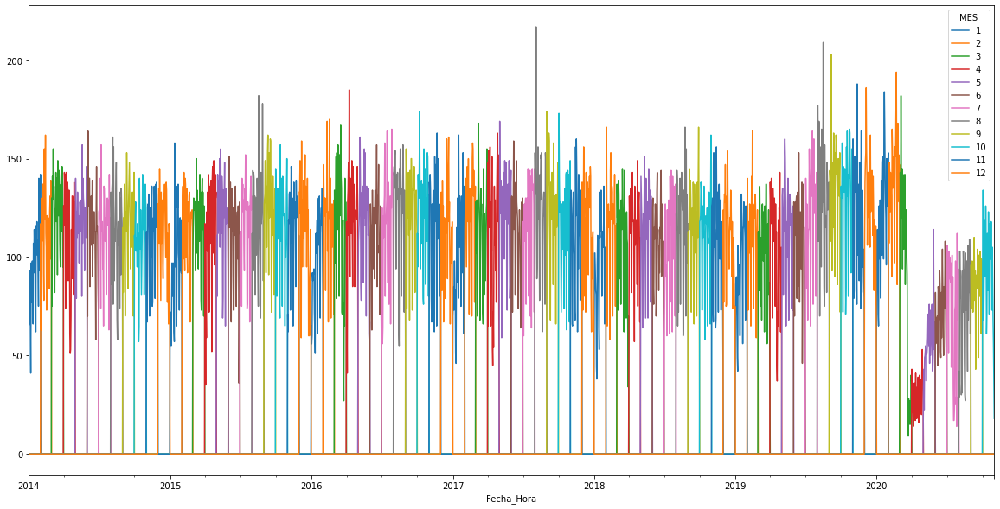

In [141]:
generate_graph_type('MES', 'D', 'plot', incidentes['MES'].unique().tolist(),subplots=False)

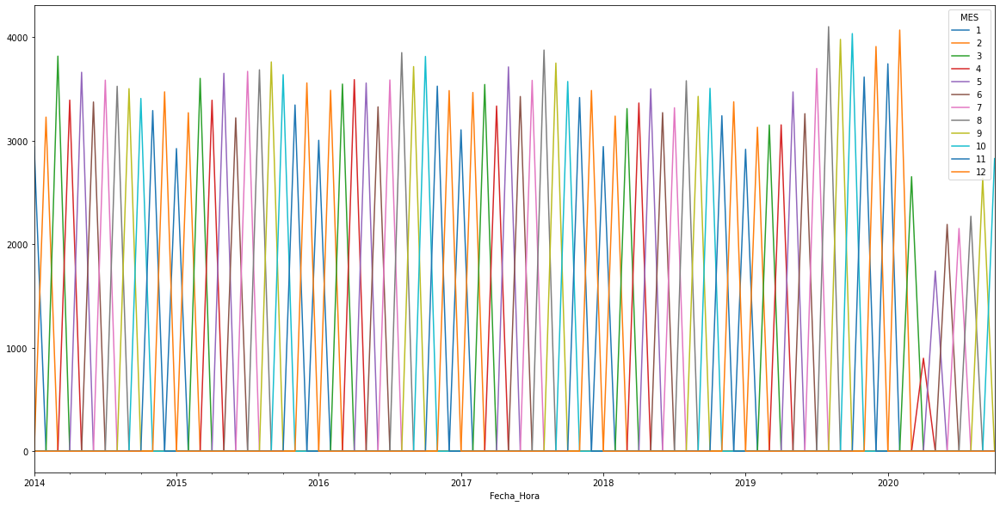

In [142]:
generate_graph_type('MES', 'M', 'plot', incidentes['MES'].unique().tolist(),subplots=False)

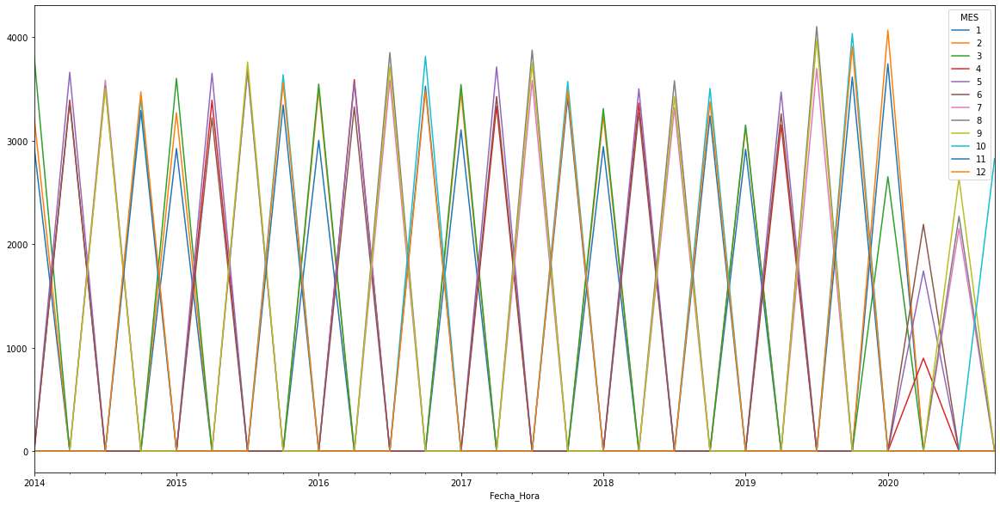

In [143]:
generate_graph_type('MES', 'Q', 'plot', incidentes['MES'].unique().tolist(),subplots=False)

#### Columna DIA

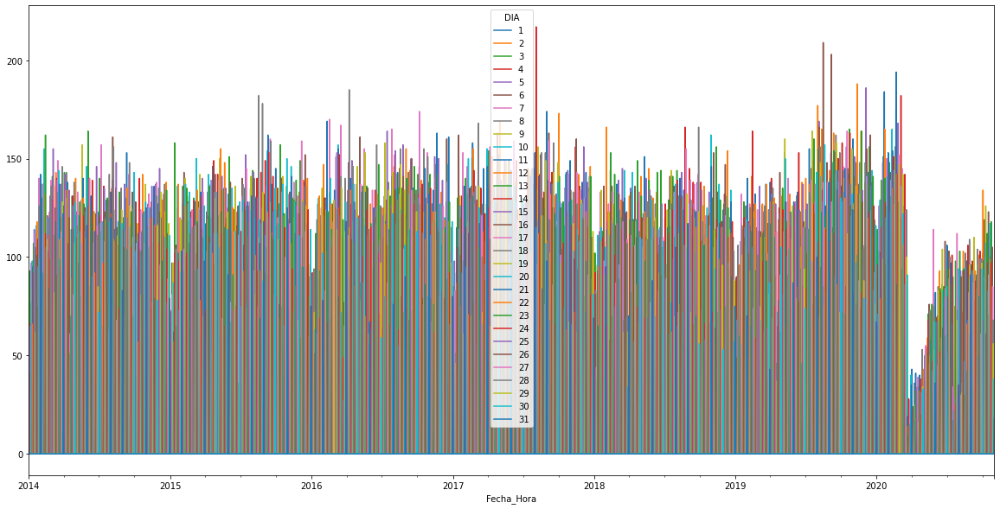

In [144]:
generate_graph_type('DIA', 'D', 'plot', incidentes['DIA'].unique().tolist(),subplots=False)

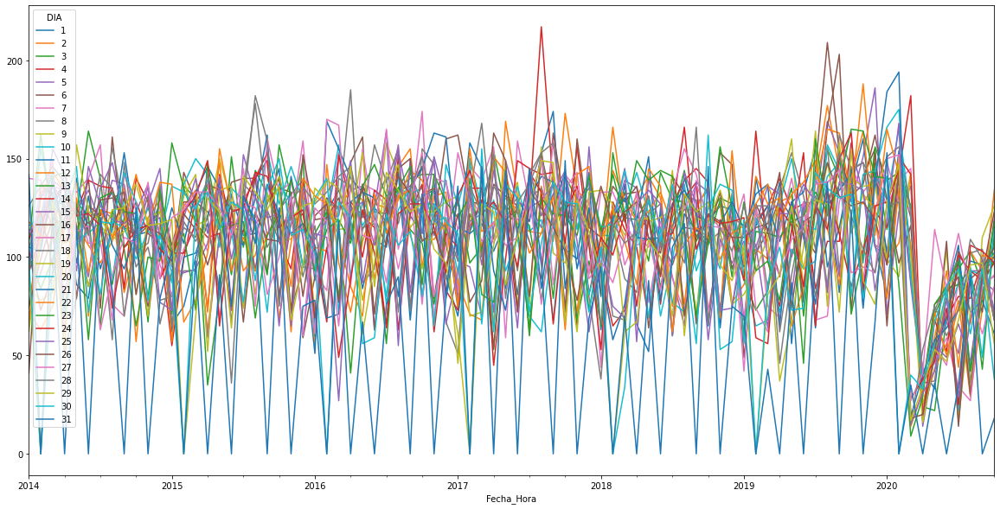

In [145]:
generate_graph_type('DIA', 'M', 'plot', incidentes['DIA'].unique().tolist(),subplots=False)

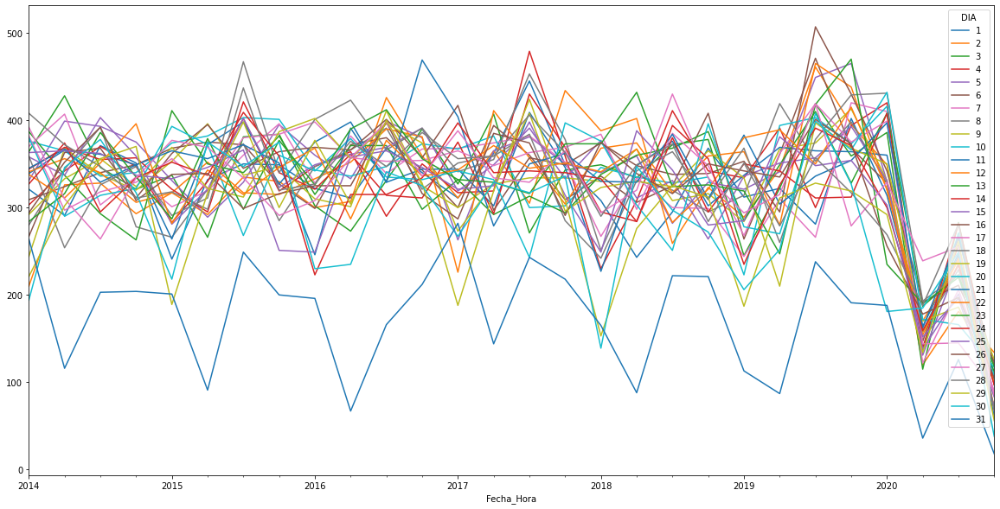

In [146]:
generate_graph_type('DIA', 'Q', 'plot', incidentes['DIA'].unique().tolist(),subplots=False)

Ahora generaremos un nuevo archivo **.CSV** con los datos acumulados por la **frecuencia mes**, con el fin de trabajar con esta información en la siguiente sección.

In [18]:
incidentes_mon.to_csv(pathData + "month" + extension)

Finalazamos la sección y limpeamos el Juputer Notebook.

In [21]:
# Fin de la sesión visualización de los datos en forma de series de tiempo
%reset -f

****
## Análisis de Series de Tiempo

In [107]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# import warnings
import itertools
# warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
import statsmodels.api as sm

from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

matplotlib.rcParams['figure.figsize'] = (20,10)
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

pathData = "D:\MedData\Incidentes georreferenciados\Incidentes_georreferenciados_"
extension = ".csv"

# https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/
# https://www.machinelearningplus.com/time-series/time-series-analysis-python/

Abrir el set de datos generado con el acumulado de incidentes mensualmente.\
Además se excluye la información del año 2020 con el fin de trabajar datos más homogeneos y poder predecir este año y compararlo con los datos existentes.

In [23]:
incidentes_mon = pd.read_csv(pathData + "month" + extension, index_col=['Fecha_Hora'])
incidentes_mon = incidentes_mon.loc['2014':'2020']
incidentes_mon

,Incidentes
Fecha_Hora,
2014-01-31,2942
2014-02-28,3228
2014-03-31,3817
2014-04-30,3392
2014-05-31,3661
...,...
2019-08-31,4102
2019-09-30,3979
2019-10-31,4035


##### Información sobre la serie de tiempo
- **Lugar:** Medellín, Colombia
- **Frecuencia de observación:** Incidentes automovilisticos mensuales
- **Cantidad de observaciones:** 72 meses
- **Tipo de serie de tiempo:** [Discrete time](https://en.wikipedia.org/wiki/Discrete_time_and_continuous_time)

Componentes de las series de tiempo:

- **La Tendencia $(T_t)$**
- **Flutuaciones Cíclicas $(C_t)$**
- **Variaciones Estacionales $(S_t)$**.\
Las razones de la estacionalidad pueden ser de dos tipos:
    - **Físico Nataurales** (ej:tiempo meteorológico, ciclos biológicos)
    - **Institucionales** (ej:vacaciones escolares, fiestas, horarios comerciales, etc.)
- **Variaciones Irregulares $(R_t)$**

In [4]:
incidentes_mon.to_csv(pathData + "month" + extension)

Creación de funciones a utilizar en esta sección.

In [40]:
def distribution_statistics_data_month():
#     distribution = incidentes_mon[col].value_counts(ascending=False,normalize=True).to_dict()
#     values = incidentes_mon.count() 
    
    simetria = incidentes_mon.skew(axis=0).to_dict()
    kurtosis = incidentes_mon.kurt(axis=0).to_dict()
    promedio = incidentes_mon.mean(axis=0).to_dict()
    mediana  = incidentes_mon.median(axis=0).to_dict()
    desvstan = incidentes_mon.std(axis=0).to_dict()
    varianza = incidentes_mon.var(axis=0).to_dict()
    covarian = incidentes_mon.cov().to_dict()
    
    df_ds = {'Promedio':promedio,
             'Mediana':mediana,
             'Varianza':varianza,
             'Covarianza':covarian['Incidentes'],
             'Desv. Estandar':desvstan,
             'Simetría':simetria,
             'Kurtosis':kurtosis
            }
    
    return pd.DataFrame(df_ds)

In [41]:
distribution_statistics_data_month()

,Promedio,Mediana,Varianza,Covarianza,Desv. Estandar,Simetría,Kurtosis
Incidentes,3474.652778,3486.0,66963.215767,66963.215767,258.772517,-0.045956,0.057318


In [42]:
incidentes_mon.mode()

,Incidentes
0,2917
1,2924
2,2942
3,2943
4,3004
...,...
67,3876
68,3910
69,3979
70,4035


In [43]:
incidentes_mon.describe()

,Incidentes
count,72.000000
mean,3474.652778
std,258.772517
min,2917.000000
25%,3316.000000
50%,3486.000000
75%,3620.750000
max,4102.000000


Ahora graficaremos el histograma de los incicidentes mensual

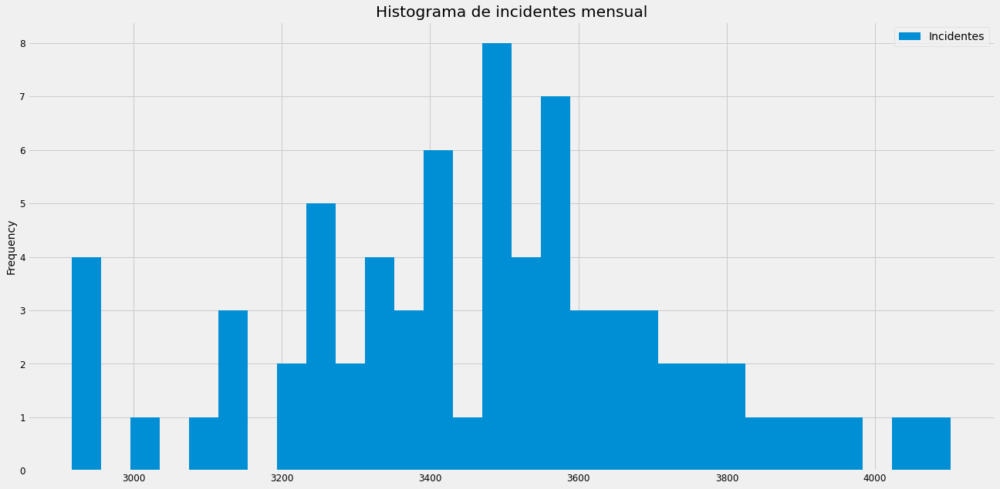

In [46]:
incidentes_mon.plot.hist(title='Histograma de incidentes mensual', bins=30)

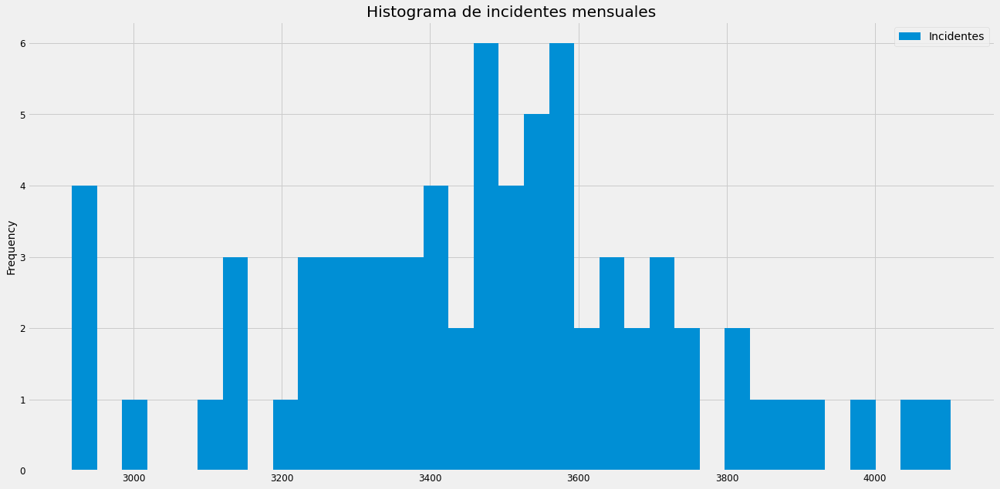

In [7]:
incidentes_mon.plot.hist(title='Histograma de incidentes mensuales', bins=35)

Ahora representaremos graficamente la serie de tiempo con datos diarios.

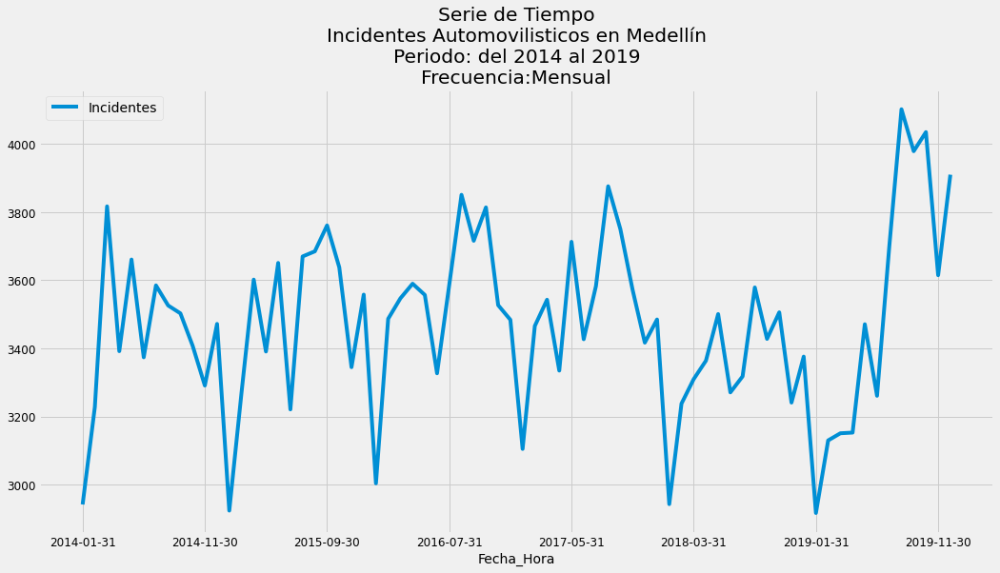

In [50]:
incidentes_mon.\
    plot(title='Serie de Tiempo\nIncidentes Automovilisticos en Medellín\nPeriodo: del 2014 al 2019\nFrecuencia:Mensual',
         figsize=(16,8)
        )

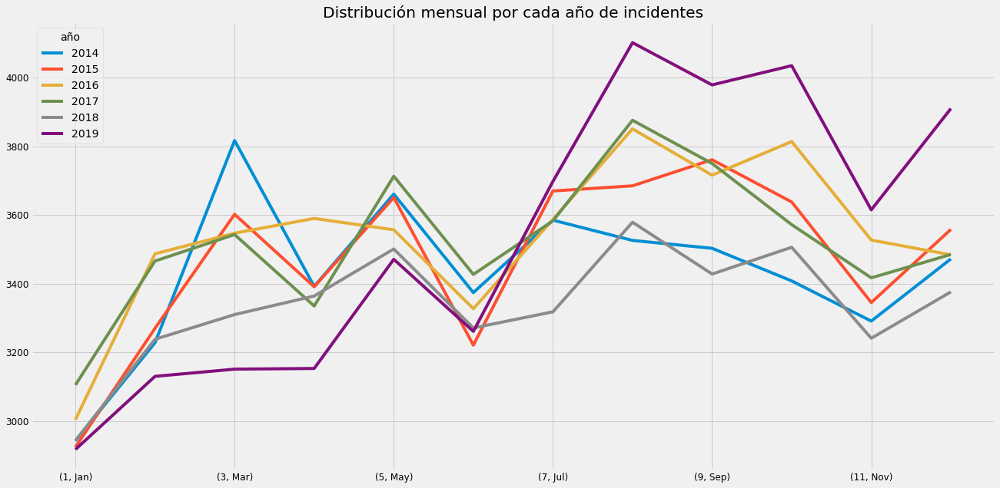

In [69]:
df = incidentes_mon.copy()
df.reset_index(inplace=True)
df['Fecha_Hora'] = pd.to_datetime(df['Fecha_Hora'])
df['año'] = [d.year for d in df.Fecha_Hora]
df['mes'] = [d.month for d in df.Fecha_Hora]
df['month'] = [d.strftime('%b') for d in df.Fecha_Hora]
df['month'] = df['month'].astype('category')
df['mes'] = df['mes'].astype('category')

df.set_index(['mes','month'], inplace=True)
df = df.pivot_table(index=df.index, columns=['año'], values='Incidentes', aggfunc='sum', fill_value=0)
df.plot(title='Distribución mensual por cada año de incidentes')
plt.show()

En el gráfico anterior se pude observar que:
- Todos los años inicia con una cantidad baja de incidentes con tendencia a crecer, teniendo el pico más alto en el mes de **agosto** a excepción del año 2015 el cual fue en el mes de **septiembre**.
- En el mes de **junio** decaen la cantidad de incidentes como en el mes de **noviembre**. Lo anterior se puede deber a la temporada de vacaciones de los estudiantes.
- En los meses de **abril** y **mayo** también se observa un crecimiento de los incidentes para todos los años a excepción del año 2016.

A continuación graficaremos la misma información pero de forma individual cada año

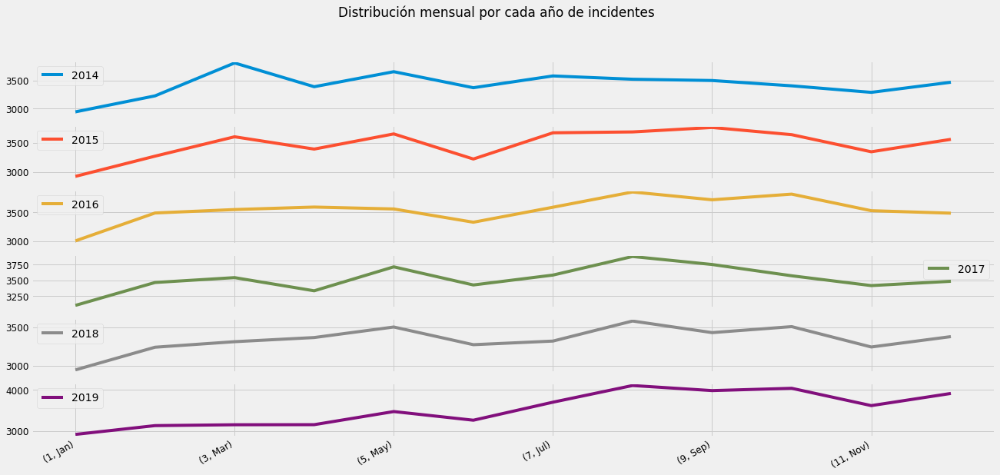

In [70]:
df.plot(title='Distribución mensual por cada año de incidentes', subplots=True)
plt.show()

### Diagrama de caja de distribución mensual (estacional) y anual (tendencia)

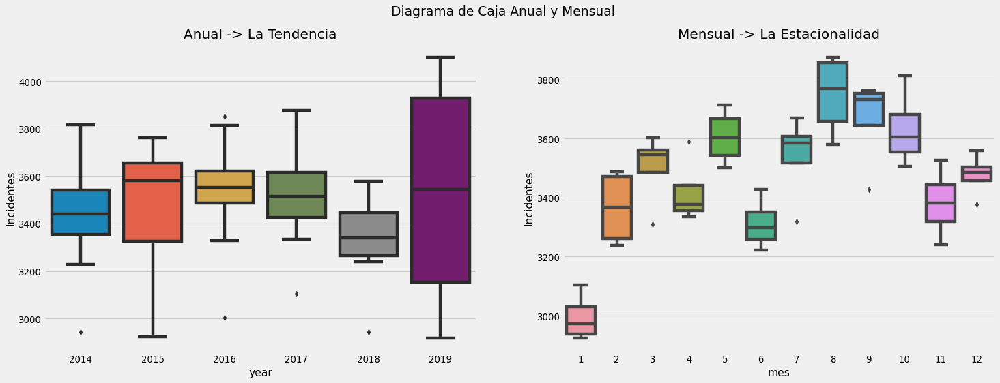

In [73]:
# Import Data
df = incidentes_mon.copy()
df.reset_index(inplace=True)
df['Fecha_Hora'] = pd.to_datetime(df['Fecha_Hora'])

# Prepare data
df['year'] = [d.year for d in df.Fecha_Hora]
df['mes']  = [d.month for d in df.Fecha_Hora]

# Draw Plot
fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
sns.boxplot(x='year', y='Incidentes', data=df, ax=axes[0])
sns.boxplot(x='mes', y='Incidentes', data=df.loc[~df.year.isin([2014, 2019]), :])

# Set Title
axes[0].set_title('Anual -> La Tendencia', fontsize=18); 
axes[1].set_title('Mensual -> La Estacionalidad', fontsize=18)
plt.suptitle('Diagrama de Caja Anual y Mensual')
plt.show()

En diagrama de caja anterior se puede observar:

- Una tendencia al alza de incidentes para los años 2014 y 2015, luego una baja para los años de 2016 al año 2018 y un repunte superando los demás años en el año 2019.
- Se evidencia una estacionalidad por el tema de vacaciones, se puede verificar en los meses de enero, junio y noviembre.
- En el mes de diciembre hay un alza de incidentes por la temporada decimbrina en la ciudad.

## Determinación del Esquema de Integración de las Componentes
Una vez analizada gráficamente la serie, el paso siguiente consiste en determinar cuál de los esquemas de integración es el que mejor se ajusta a la serie en estudio. Las posibilidades que se consideran habitualmente son las siguientes:

- Esquema (Modelo) Aditivo: $Y_t = T_t + C_t + S_t + R_t$
- Esquema (Modelo) Multiplicativo: $Y_t = T_t * C_t * S_t * R_t$

Los métodos para determinar el esquema de integración son los siguientes:

- Métodos gráficos
    - Gráfico de media / desviaciones típicas
- Métodos númericos
    - Variabilidad de las diferencias y cocientes estacionales

Referencias: [01](http://metodos.upct.es/Asignaturas/Diplomatura/Introduccion_estadistica/2008_2009/material_didactico/apuntes/TEMA5SERIESTEMPORALES.pdf) y 
[02](https://masterturismo.es/descargas/materiales/curso-2013-2014/modulo-7-metodos-de-investigacion-aplicados-del-turismo/para-hoy)

### Gráfico de la desviación típica-media
Esta gráfica tiene como objetivo definir que modelo o esquema aplicar a la serie de tiempo.

In [89]:
# Crear una copia del data set
df_dtm = incidentes_mon.copy()
df_dtm.reset_index(inplace=True)
df_dtm['Fecha_Hora'] = pd.to_datetime(df_dtm['Fecha_Hora'])

# Generar nuevas columnas
df_dtm['año'] = [d.year for d in df.Fecha_Hora]
df_dtm['mes']  = [d.month for d in df.Fecha_Hora]

# Agrupar los datos en formato ancho
df_dtm_wide = df_dtm.pivot_table(index='año', columns='mes', values='Incidentes', aggfunc='sum', fill_value=0)

# Anexar nuevas columas calculadas
df_dtm_wide['Media'] = df_dtm_wide.mean(axis=1)
df_dtm_wide['Std'] = df_dtm_wide.std(axis=1)

# Seleccionar las columnas necesarias
df_dtm_wide[['Media','Std']]

mes,Media,Std
año,,
2014,3433.250000,213.438174
2015,3476.333333,237.795547
2016,3540.916667,213.422296
2017,3522.666667,194.475934
2018,3339.583333,159.209222
2019,3535.166667,393.776551


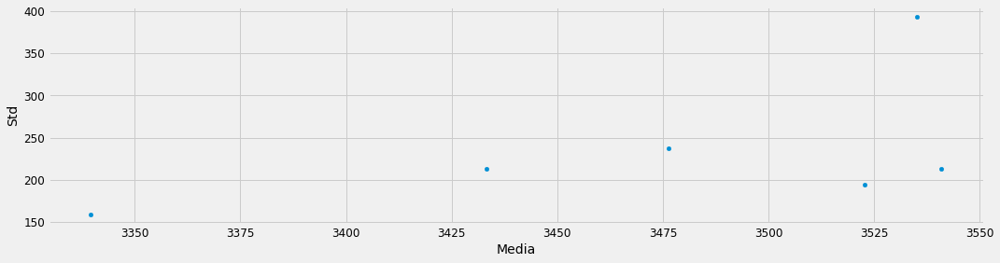

In [97]:
df_dtm_wide[['Media','Std']].plot.scatter('Media','Std',figsize=(16,4))

En gráfico anterior se puede observar que la distribución de puntos no se visualiza una línea recta paralela al eje de las abscisas para todos los puntos trazados. Se puede concluir que estamos ante un **modelo multiplicativo**, de lo contrario seria un modelo aditivo.

### Análisis de la variabilidad de las diferencias y cocientes estacionales

In [105]:
df_dif = incidentes_mon.copy()
df_dif['Incidentes-1'] = incidentes_mon.shift(1)
df_dif['Diferenc-Estacional-d'] = df_dif['Incidentes'] - df_dif['Incidentes-1']
df_dif['Cociente-Estacional-k'] = df_dif['Incidentes'] / df_dif['Incidentes-1']

# Calcular los coefecientes de variación (CV) -> CV(d) y CV(k)
CV_d = df_dif['Diferenc-Estacional-d'].std() / df_dif['Diferenc-Estacional-d'].mean()
CV_k = df_dif['Cociente-Estacional-k'].std() / df_dif['Cociente-Estacional-k'].mean()

if (CV_d <= CV_k):
    print('Se optará por el Modelo Aditivo')
else:
    print('Se optará por el Modelo Multiplicativo')

Se optará por el Modelo Multiplicativo


### Descomposición de la serie de tiempo en sus componentes

Como vismos en los bloques anteriores de hayo que el modelo esquema a utilizar en la serie de tiempo es el Multiplicativo.
Por lo anterior, ahora vamos a realizar una descompisición de la serie por cada uno de sus componentes.

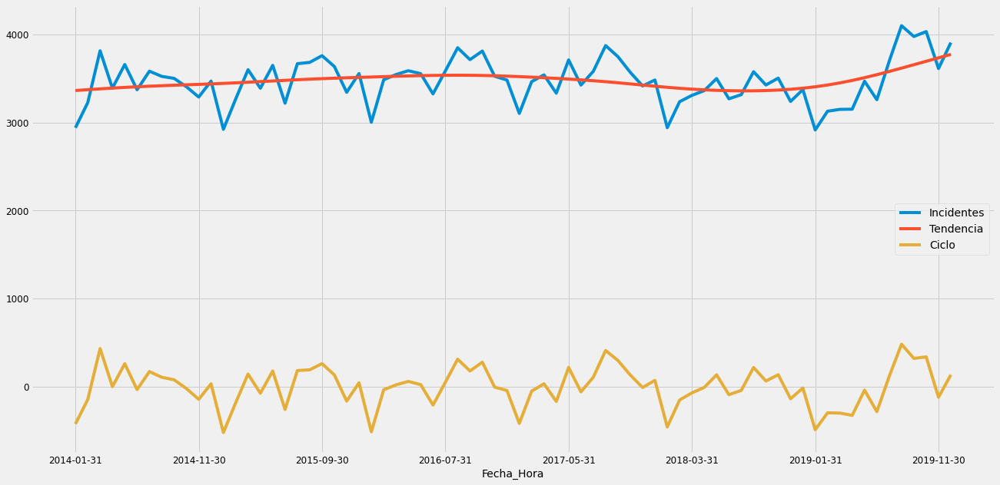

In [106]:
# https://relopezbriega.github.io/blog/2016/09/26/series-de-tiempo-con-python/
# Aplicando el filtro Hodrick-Prescott para separar en tendencia y el componente ciclico.
df_ciclo, df_tend = sm.tsa.filters.hpfilter(incidentes_mon['Incidentes'])
incidentes_mon_copy = incidentes_mon.copy()
incidentes_mon_copy['Tendencia'] = df_tend
incidentes_mon_copy['Ciclo'] = df_ciclo

# graficando la variacion del precio real con la tendencia.
incidentes_mon_copy[['Incidentes','Tendencia','Ciclo']].plot();
legend = plt.legend()
legend.prop.set_size(14);

En los graficos anteriores se puede observar el siguiente patron:

- Un patron de estacionalidad, ya que cada final e inicio de año los incidentes bajan, esto debido a la temporada de vacaciones.

In [327]:
#  http://metodos.upct.es/Asignaturas/Diplomatura/Introduccion_estadistica/2008_2009/material_didactico/apuntes/TEMA5SERIESTEMPORALES.pdf

# http://davidespinosa.es/joomla/index.php?option=com_content&view=article&id=339:estimacion-de-la-tendencia-de-una-serie-temporal&catid=80:analisis-externo#:~:text=%2D%20Si%20el%20n%C3%BAmero%20de%20valores,serie%20de%20valores%20de%20t).

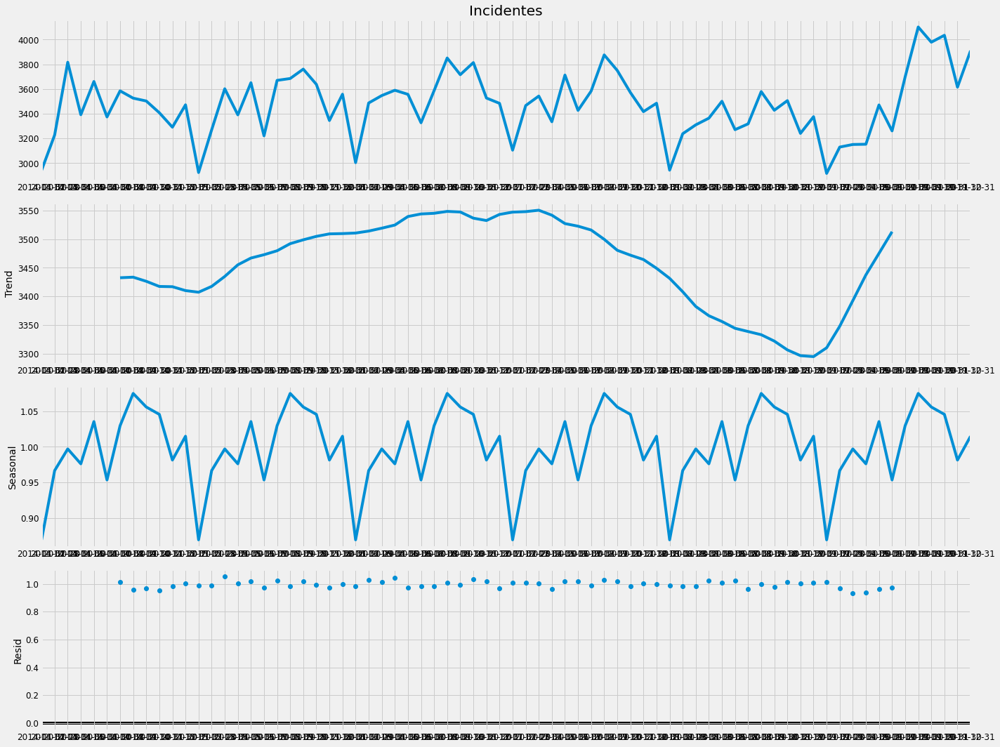

In [220]:
# Multiplicative Decomposition 
result_mul = seasonal_decompose(incidentes_mon['Incidentes'], model='multiplicative', period=12)
plt.rcParams.update({'figure.figsize': (20,15)})
result_mul.plot()
plt.show()

Genero otra forma personal de presentar la descomposición de componentes

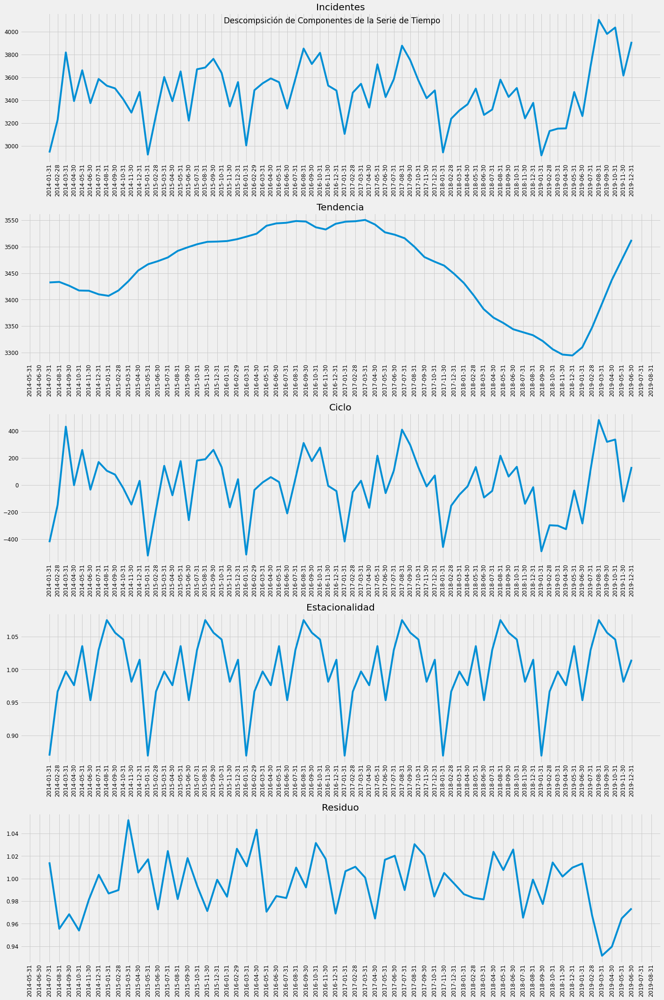

In [219]:
fig, (axs1, axs2, axs3, axs4, axs5) = plt.subplots(5, 1, sharex=False)

plt.xticks(rotation='vertical')
fig.suptitle('Descompsición de Componentes de la Serie de Tiempo')
plt.rcParams.update({'figure.figsize': (20,25)})

plt.setp(axs1.get_xticklabels(), rotation=90)
plt.setp(axs2.get_xticklabels(), rotation=90)
plt.setp(axs3.get_xticklabels(), rotation=90)
plt.setp(axs4.get_xticklabels(), rotation=90)

axs1.plot(result_mul.observed)
axs1.set_title('Incidentes')

axs2.plot(result_mul.trend)
axs2.set_title('Tendencia')

axs3.plot(df_ciclo)
axs3.set_title('Ciclicidad')

axs4.plot(result_mul.seasonal)
axs4.set_title('Estacionalidad')

axs5.plot(result_mul.resid)
axs5.set_title('Residuo')

fig.tight_layout()

plt.show()

#### Análisis de la estacionalidad

Este analisis esta compuesto por dos procedimientos para determinar la tendencia en una serie de tiempo y son:
- El enfoque global (El método de mínimos cuadrados)
- El enfoque local (El método de las medias móviles)

##### Método de mínimos cuadrados

In [ ]:
# http://davidespinosa.es/joomla/index.php?option=com_content&view=article&id=339:estimacion-de-la-tendencia-de-una-serie-temporal&catid=80:analisis-externo#:~:text=%2D%20Si%20el%20n%C3%BAmero%20de%20valores

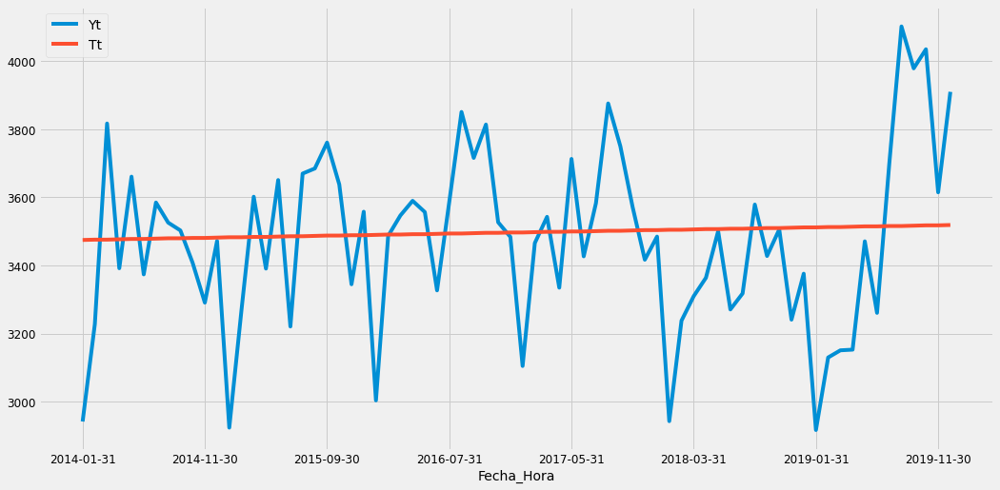

In [313]:
# Definir el set datos y crear nuevas columnas
df_mmc = incidentes_mon.copy()
df_mmc.rename(columns={'Incidentes':'Yt'}, inplace=True)
df_mmc['t'] = range(1,df_mmc.shape[0]+1)
df_mmc['t_p'] = None


# Definir Ot y crear t' = t_p
Ot = 0
if(df_mmc.shape[0] % 2 == 0):
    Ot = df_mmc.shape[0] // 2 
    Ot = (Ot + Ot + 1) / 2
    df_mmc['t_p'] = df_mmc['t'].apply(lambda x: 2 * (x - Ot))
else:
    Ot = df_mmc.median()
    df_mmc['t_p'] = df_mmc['t'].apply(lambda x: x - Ot)

    
# Definir la columna t' * Yt = t_p_x_Yt
df_mmc['t_p_x_Yt'] = df_mmc['t_p'] * df_mmc['Yt']


# Definir t'**2 = t_p_2
df_mmc['t_p_2'] = df_mmc['t_p'] ** 2


# Hallar los totales de las columnas 
N = df_mmc.shape[0]
Suma_Yt = df_mmc['Yt'].sum()
Suma_t_p_x_Yt = df_mmc['t_p_x_Yt'].sum()
Suma_t_p_2 = df_mmc['t_p_2'].sum()


# Calcular variables de la recta Y = a + bt
a = Suma_Yt / N
b = Suma_t_p_x_Yt / Suma_t_p_2


# Calcular la pendiente aplicando la ecuación de la recta Tt = a + bt
df_mmc['Tt'] = df_mmc['t'].apply(lambda x: np.round(a + (b * x),0))


# Graficar la pendiente
df_mmc[['Yt','Tt']].plot(figsize=(16,8))
plt.show()

##### El método de medias móviles

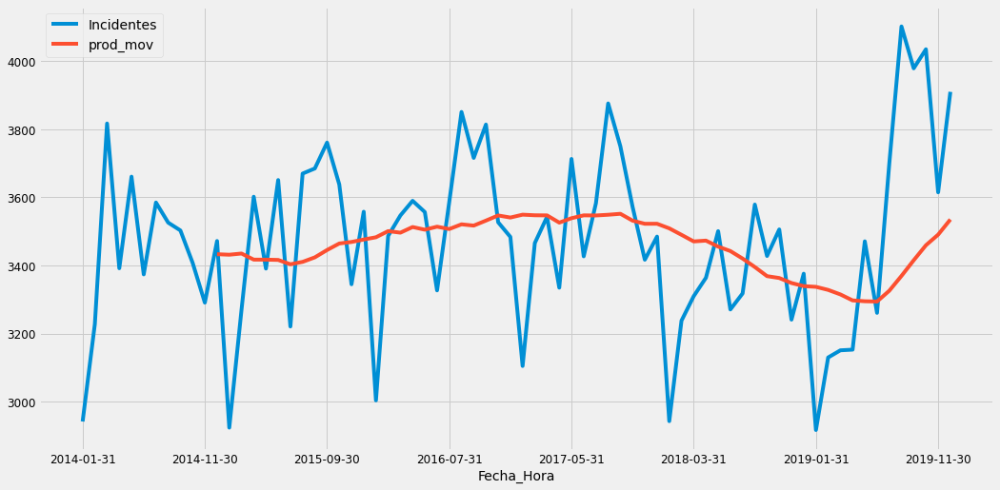

In [314]:
# Calculando promedios móviles cada N meses (window)
df_ma = incidentes_mon.rolling(window=12, center=False).mean()
incidentes_mon_copy['prod_mov'] = df_ma
plot = incidentes_mon_copy[['Incidentes', 'prod_mov']].plot(figsize=(16, 8), fontsize=12)

In [73]:
# calculando el porcentaje de variación del día.
variacion_diaria = incidentes_mon_copy['Total'] / incidentes_mon_copy['Total'].shift(1) - 1
incidentes_mon_copy['var_diaria'] = variacion_diaria
incidentes_mon_copy['var_diaria'][:5]

Fecha_Hora
2014-01-31         NaN
2014-02-28    0.097213
2014-03-31    0.182466
2014-04-30   -0.111344
2014-05-31    0.079304
Freq: M, Name: var_diaria, dtype: float64

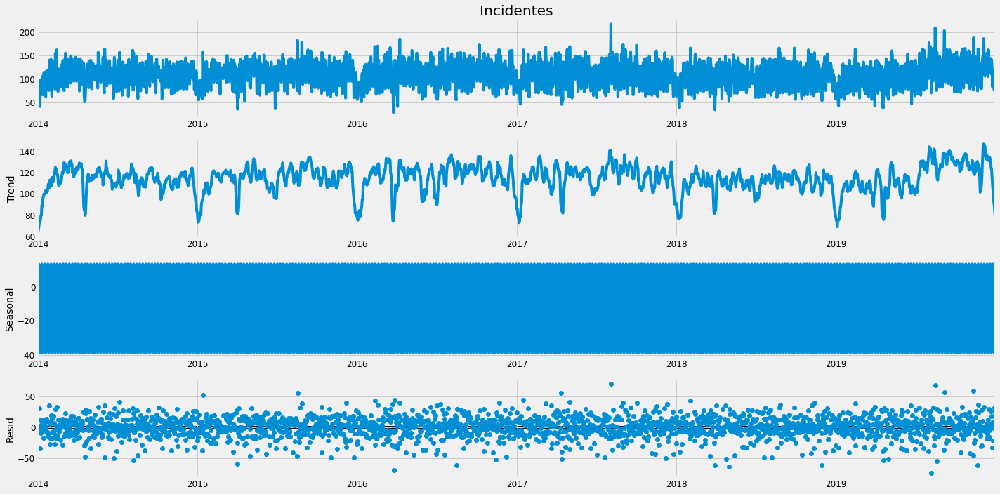

In [322]:
# Ejemplo de descomposición de serie de tiempo
descomposicion = sm.tsa.seasonal_decompose(incidentes_day['Incidentes'], model='additive', extrapolate_trend='freq')  
fig = descomposicion.plot()

In [80]:
dict_descomposicion = {
                        'Valores': descomposicion.observed.to_dict(),
                        'Tendencia': descomposicion.trend.to_dict(),
                        'Estacionalidad': descomposicion.seasonal.to_dict(),
                        'Residuo': descomposicion.resid.to_dict(),
                        'Pesos': descomposicion.weights.to_dict()
                        }
df_descomposicion = pd.DataFrame(dict_descomposicion)
df_descomposicion

,Valores,Tendencia,Estacionalidad,Residuo,Pesos
2014-01-31,2942.0,NaN,-298.636458,NaN,1.0
2014-02-28,3228.0,NaN,57.370486,NaN,1.0
2014-03-31,3817.0,NaN,-70.400347,NaN,1.0
2014-04-30,3392.0,NaN,-406.025347,NaN,1.0
2014-05-31,3661.0,NaN,94.620486,NaN,1.0
...,...,...,...,...,...
2020-06-30,2191.0,NaN,-188.929514,NaN,1.0
2020-07-31,2152.0,NaN,82.238542,NaN,1.0
2020-08-31,2270.0,NaN,267.169097,NaN,1.0
2020-09-30,2638.0,NaN,189.085764,NaN,1.0


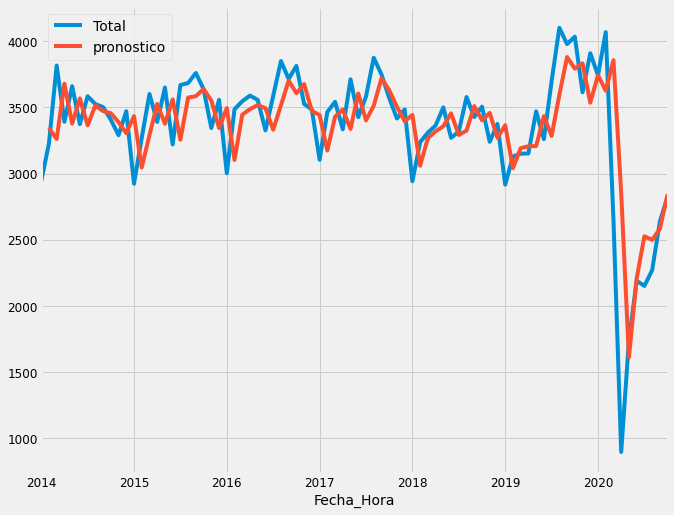

In [72]:
# Modelo ARIMA sobre el valor de cierre de la acción.
modelo = sm.tsa.ARIMA(incidentes_mon['Total'].iloc[1:], order=(1, 0, 0))  
resultados = modelo.fit(disp=-1)  
incidentes_mon_copy['pronostico'] = resultados.fittedvalues  
plot = incidentes_mon_copy[['Total', 'pronostico']].plot(figsize=(10, 8)) 

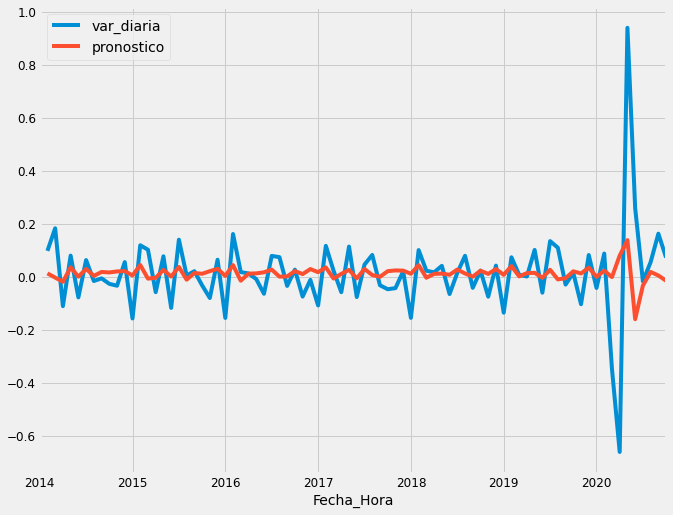

In [75]:
# modelo ARIMA sobre variación diaria
modelo = sm.tsa.ARIMA(incidentes_mon_copy['var_diaria'].iloc[1:], order=(1, 0, 0))  
resultados = modelo.fit(disp=-1)  
incidentes_mon_copy['pronostico'] = resultados.fittedvalues  
plot = incidentes_mon_copy[['var_diaria', 'pronostico']].plot(figsize=(10, 8)) 

### Prueba Dickey-Fuller Aumentada (prueba ADF)
Prueba estadística más común para determinar si una serie de tiempo es estacionaria o no. Funciona tomando una hipótesis nula que dice que la serie no es estacionaria. Se requiere un valor mínimo de p (<0.005) para rechazar esa hipótesis nula. La prueba también considera que las estadísticas de ADF deben ser menores que diferentes valores críticos.



In [77]:
from statsmodels.tsa.stattools import adfuller 
adf_test = adfuller(incidentes_mon) 
print('ADF Statistics: {}'.format(adf_test[0])) 
print('p-value: {}'.format(adf_test[1])) 
for key, value in adf_test[4].items(): 
    print('Critical Values Over {}: {}'.format(key, value)) 

ADF Statistics: -1.6473063760382487
p-value: 0.4584456054566597
Critical Values Over 1%: -3.528889992207215
Critical Values Over 5%: -2.9044395987933362
Critical Values Over 10%: -2.589655654274312


In [5]:
incidentes_wide.head()

,Atropello,Caída de Ocupante,Choque,Incendio,Otro,Volcamiento,HERIDO,MUERTO,SOLO DAÑOS,Ciclo Ruta,...,La América,La Candelaria,Laureles Estadio,Manrique,Popular,Robledo,San Javier,Santa Cruz,Sin Inf,Villa Hermosa
Fecha_Hora,,,,,,,,,,,,,,,,,,,,,
2014-01-01 01:00:00,1,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2014-01-01 01:20:00,0,0,3,0,0,0,3,0,0,0,...,0,1,0,0,0,1,0,0,0,0
2014-01-01 01:30:00,0,1,1,0,1,0,3,0,0,0,...,0,0,1,0,0,1,0,0,0,0
2014-01-01 01:50:00,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2014-01-01 02:00:00,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [34]:
incidentes_wide_day = pd.DataFrame(incidentes_wide.resample('D')['Atropello'].count().rename('Total'))
incidentes_wide_mon = pd.DataFrame(incidentes_wide.resample('M')['Atropello'].count().rename('Total'))

In [44]:
incidentes_wide_day_two = pd.DataFrame(incidentes_wide[['Atropello','Choque']].resample('D').count())

In [47]:
incidentes_wide_day_two

,Atropello,Choque
Fecha_Hora,,
2014-01-01,45,45
2014-01-02,52,52
2014-01-03,56,56
2014-01-04,45,45
2014-01-05,48,48
...,...,...
2020-10-27,53,53
2020-10-28,38,38
2020-10-29,39,39


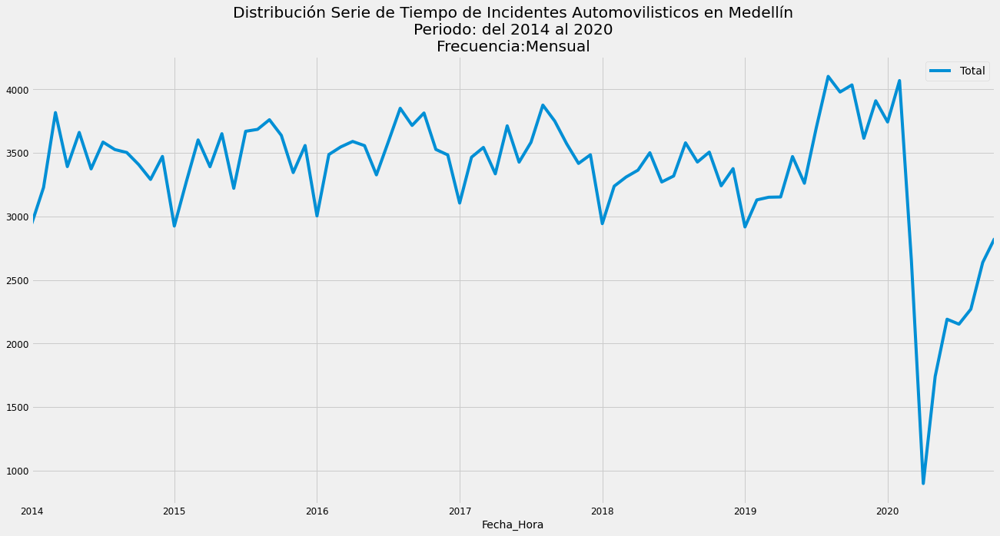

In [74]:
incidentes_mon.plot(title='Distribución Serie de Tiempo de Incidentes Automovilisticos en Medellín\nPeriodo: del 2014 al 2020\nFrecuencia:Mensual', grid=True)

In [7]:
incidentes_wide.head()

,Atropello,Caída de Ocupante,Choque,Incendio,Otro,Volcamiento,HERIDO,MUERTO,SOLO DAÑOS,Ciclo Ruta,...,La América,La Candelaria,Laureles Estadio,Manrique,Popular,Robledo,San Javier,Santa Cruz,Sin Inf,Villa Hermosa
Fecha_Hora,,,,,,,,,,,,,,,,,,,,,
2014-01-01 01:00:00,1,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2014-01-01 01:20:00,0,0,3,0,0,0,3,0,0,0,...,0,1,0,0,0,1,0,0,0,0
2014-01-01 01:30:00,0,1,1,0,1,0,3,0,0,0,...,0,0,1,0,0,1,0,0,0,0
2014-01-01 01:50:00,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2014-01-01 02:00:00,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
incidentes_day.count()

Total    2496
dtype: int64

### Autoregression (AR)

In [9]:
# AR example
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.ar_model import AutoRegResults 
from random import random
# contrived dataset
data = incidentes_day 
# fit model
model = AutoReg(data, lags=4)
model_fit = model.fit()
# make prediction
yhat = model_fit.predict(len(data), len(data))
print(yhat)

2020-11-01    64.673483
Freq: D, dtype: float64


In [10]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:                  Total   No. Observations:                 2496
Model:                     AutoReg(4)   Log Likelihood              -11730.965
Method:               Conditional MLE   S.D. of innovations             26.803
Date:                Sat, 27 Mar 2021   AIC                              6.582
Time:                        09:37:01   BIC                              6.596
Sample:                    01-05-2014   HQIC                             6.587
                         - 10-31-2020                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     40.4496      2.807     14.409      0.000      34.948      45.952
Total.L1       0.3214      0.020     16.178      0.000       0.282       0.360
Total.L2       0.0348      0.021      1.682      0.093      -0.006       0.075
Total.L3       0.1440      0.021      6.960      0.000       0.103       0.185
Total.L4       0.1331      0.020      6.694      0.000       0.094       0.172
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.2199           -0.0000j            1.2199           -0.0000
AR.2           -0.0577           -1.6773j            1.6783           -0.2555
AR.3           -0.0577           +1.6773j            1.6783            0.2555
AR.4           -2.1862           -0.0000j            2.1862           -0.5000
-----------------------------------------------------------------------------
"""

In [11]:
ARR = AutoRegResults(model, model_fit, model_fit.cov_params)

### Moving Average (MA)

In [12]:
# MA example
from statsmodels.tsa.arima.model import ARIMA
from random import random
# contrived dataset
data = incidentes_day
# fit model
model = ARIMA(data, order=(0, 0, 1))
model_fit = model.fit()
# make prediction
yhat = model_fit.predict(len(data), len(data))
print(yhat)

2020-11-01    85.190296
Freq: D, dtype: float64


In [13]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Total   No. Observations:                 2496
Model:                 ARIMA(0, 0, 1)   Log Likelihood              -11880.994
Date:                Sat, 27 Mar 2021   AIC                          23767.987
Time:                        09:37:13   BIC                          23785.455
Sample:                    01-01-2014   HQIC                         23774.329
                         - 10-31-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        110.3150      0.821    134.400      0.000     108.706     111.924
ma.L1          0.3471      0.019     18.441      0.000       0.310       0.384
sigma2       797.9885     24.262     32.891      0.000     750.436     845.541
===================================================================================
Ljung-Box (Q):                     3757.47   Jarque-Bera (JB):                29.86
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.68   Skew:                            -0.25
Prob(H) (two-sided):                  0.00   Kurtosis:                         2.80
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Autoregressive Moving Average (ARMA)

In [16]:
# ARMA example
from statsmodels.tsa.arima.model import ARIMA
from random import random
# contrived dataset
data = incidentes_day
# fit model
model = ARIMA(data, order=(0, 1, 1))
model_fit = model.fit()
# make prediction
yhat = model_fit.predict(len(data), len(data))
print(yhat)

2020-11-01    74.755038
Freq: D, dtype: float64


In [17]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Total   No. Observations:                 2496
Model:                 ARIMA(0, 1, 1)   Log Likelihood              -11693.563
Date:                Sat, 27 Mar 2021   AIC                          23391.126
Time:                        09:40:45   BIC                          23402.770
Sample:                    01-01-2014   HQIC                         23395.354
                         - 10-31-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8813      0.008   -109.060      0.000      -0.897      -0.865
sigma2       688.9158     19.693     34.982      0.000     650.317     727.514
===================================================================================
Ljung-Box (Q):                     3300.94   Jarque-Bera (JB):                99.89
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.16   Skew:                            -0.49
Prob(H) (two-sided):                  0.03   Kurtosis:                         2.97
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Autoregressive Integrated Moving Average (ARIMA)

In [18]:
# ARIMA example
from statsmodels.tsa.arima.model import ARIMA
from random import random
# contrived dataset
data = incidentes_day
# fit model
model = ARIMA(data, order=(1, 1, 1))
model_fit = model.fit()
# make prediction
yhat = model_fit.predict(len(data), len(data), typ='levels')
print(yhat)

2020-11-01    69.982771
Freq: D, dtype: float64


In [19]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Total   No. Observations:                 2496
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -11673.224
Date:                Sat, 27 Mar 2021   AIC                          23352.449
Time:                        09:45:31   BIC                          23369.915
Sample:                    01-01-2014   HQIC                         23358.791
                         - 10-31-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1436      0.022      6.539      0.000       0.101       0.187
ma.L1         -0.9119      0.009   -101.318      0.000      -0.930      -0.894
sigma2       677.7699     19.764     34.293      0.000     639.033     716.507
===================================================================================
Ljung-Box (Q):                     3014.74   Jarque-Bera (JB):                66.60
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.16   Skew:                            -0.40
Prob(H) (two-sided):                  0.03   Kurtosis:                         2.90
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Seasonal Autoregressive Integrated Moving-Average (SARIMA)

In [22]:
# SARIMA example
from statsmodels.tsa.statespace.sarimax import SARIMAX
from random import random
# contrived dataset
data = incidentes_day
# fit model
model = SARIMAX(data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
model_fit = model.fit(disp=False)
# make prediction
yhat = model_fit.predict(len(data), len(data))
print(yhat)

2020-11-01    63.97022
Freq: D, dtype: float64


In [23]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              Total   No. Observations:                 2496
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood              -11615.994
Date:                            Sat, 27 Mar 2021   AIC                          23241.988
Time:                                    09:50:08   BIC                          23271.074
Sample:                                01-01-2014   HQIC                         23252.551
                                     - 10-31-2020                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1283      0.023      5.637      0.000       0.084       0.173
ma.L1         -0.8942      0.010    -87.831      0.000      -0.914      -0.874
ar.S.L12      -0.1770      0.021     -8.573      0.000      -0.218      -0.137
ma.S.L12      -0.9995      0.079    -12.701      0.000      -1.154      -0.845
sigma2       659.0021     53.160     12.397      0.000     554.811     763.194
===================================================================================
Ljung-Box (Q):                     2394.16   Jarque-Bera (JB):                59.82
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.14   Skew:                            -0.38
Prob(H) (two-sided):                  0.05   Kurtosis:                         2.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Seasonal Autoregressive Integrated Moving-Average with Exogenous Regressors (SARIMAX)

In [37]:
# SARIMAX example
from statsmodels.tsa.statespace.sarimax import SARIMAX
from random import random
# contrived dataset
data1 = incidentes_day
data2 = incidentes_wide_day
# fit model
model = SARIMAX(data1, exog=data2, order=(1, 1, 1), seasonal_order=(0, 0, 0, 0))
model_fit = model.fit(disp=False)
# make prediction
exog2 = [200 + random()]
yhat = model_fit.predict(len(data1), len(data1), exog=[exog2])
print(yhat)

2020-11-01    413.664522
Freq: D, dtype: float64


In [39]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Total   No. Observations:                 2496
Model:               SARIMAX(1, 1, 1)   Log Likelihood               -9474.928
Date:                Sat, 27 Mar 2021   AIC                          18957.855
Time:                        10:04:32   BIC                          18981.144
Sample:                    01-01-2014   HQIC                         18966.311
                         - 10-31-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Total          2.2071      0.021    105.537      0.000       2.166       2.248
ar.L1          0.0435      0.020      2.224      0.026       0.005       0.082
ma.L1         -0.9691      0.005   -180.996      0.000      -0.980      -0.959
sigma2       116.2984      2.753     42.248      0.000     110.903     121.694
===================================================================================
Ljung-Box (Q):                       69.51   Jarque-Bera (JB):               161.02
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.06   Skew:                             0.43
Prob(H) (two-sided):                  0.39   Kurtosis:                         3.91
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Vector Autoregression (VAR)

In [50]:
# VAR example
from statsmodels.tsa.vector_ar.var_model import VAR
# from random import random
# # contrived dataset with dependency
# data = list()
# for i in range(100):
#     v1 = i + random()
#     v2 = v1 + random()
#     row = [v1, v2]
#     data.append(row)
# fit model
model = VAR(incidentes_wide_day_two)
model_fit = model.fit()
# make prediction
yhat = model_fit.forecast(model_fit.y, steps=1)
print(yhat)

[[42.20158964 42.20158964]]


C:\Users\Mauricio\Anaconda3\lib\site-packages\statsmodels\base\wrapper.py:36: FutureWarning: y is a deprecated alias for endog, will be removed in version 0.11.0
  obj = getattr(results, attr)


In [ ]:
model_fit.summary()

### Vector Autoregression Moving-Average (VARMA)

In [62]:
incidentes_wide_day_two.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2496 entries, 2014-01-01 to 2020-10-31
Freq: D
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Atropello  2496 non-null   float64
 1   Choque     2496 non-null   float64
dtypes: float64(2)
memory usage: 138.5 KB


In [61]:
# incidentes[["DIA", "PERIODO", "MES"]] = incidentes[["DIA", "PERIODO", "MES"]].apply(pd.to_numeric, downcast="signed")
# incidentes_wide_day_two[['Atropello','Choque']] = incidentes_wide_day_two[['Atropello','Choque']].apply(pd.to_numeric, downcast='float')
incidentes_wide_day_two[['Atropello','Choque']] = incidentes_wide_day_two[['Atropello','Choque']].astype('float64')

In [ ]:
# VARMA example
from statsmodels.tsa.statespace.varmax import VARMAX
# from random import random
# # contrived dataset with dependency
# data = list()
# for i in range(100):
#     v1 = random()
#     v2 = v1 + random()
#     row = [v1, v2]
#     data.append(row)
# fit model
model = VARMAX(incidentes_wide_day_two, order=(1, 1))
model_fit = model.fit(disp=False)
# make prediction
yhat = model_fit.forecast()
print(yhat)

### Simple Exponential Smoothing (SES)

In [64]:
# SES example
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from random import random
# contrived dataset
data = incidentes_day
# fit model
model = SimpleExpSmoothing(data)
model_fit = model.fit()
# make prediction
yhat = model_fit.predict(len(data), len(data))
print(yhat)

2020-11-01    74.820527
Freq: D, dtype: float64


C:\Users\Mauricio\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters.py:731: RuntimeWarning: invalid value encountered in greater_equal
  loc = initial_p >= ub


In [65]:
model_fit.summary()

Dep. Variable:,endog,No. Observations:,2496
Model:,SimpleExpSmoothing,SSE,1718844.451
Optimized:,True,AIC,16314.656
Trend:,None,BIC,16326.301
Seasonal:,None,AICC,16314.672
Seasonal Periods:,None,Date:,"Sat, 27 Mar 2021"
Box-Cox:,False,Time:,10:33:38
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.1183378,alpha,True
initial_level,82.180664,l.0,True


### Holt Winter’s Exponential Smoothing (HWES)

In [66]:
# HWES example
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from random import random
# contrived dataset
data = incidentes_day
# fit model
model = ExponentialSmoothing(data)
model_fit = model.fit()
# make prediction
yhat = model_fit.predict(len(data), len(data))
print(yhat)

2020-11-01    74.820527
Freq: D, dtype: float64


C:\Users\Mauricio\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters.py:731: RuntimeWarning: invalid value encountered in greater_equal
  loc = initial_p >= ub


In [67]:
model_fit.summary()

Dep. Variable:,endog,No. Observations:,2496
Model:,ExponentialSmoothing,SSE,1718844.451
Optimized:,True,AIC,16314.656
Trend:,None,BIC,16326.301
Seasonal:,None,AICC,16314.672
Seasonal Periods:,None,Date:,"Sat, 27 Mar 2021"
Box-Cox:,False,Time:,10:36:12
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.1183378,alpha,True
initial_level,82.180664,l.0,True


## Estacionalidad

In [183]:
filtro = (incidentes['PERIODO'] != 2020)

incidentes_gravedad_mes = incidentes\
                            .where(filtro)\
                            .pivot_table(index='GRAVEDAD', 
                                           columns=['MES'], 
                                           values='OBJECTID', 
                                           aggfunc='count', 
                                           fill_value=0
                                        )\
                            .T\
                            .sort_index()

In [207]:
ColumasDataSet = incidentes_wide.columns
fig, ejes = plt.subplots(3, 1, figsize=(20, 15), sharex=True)
for nombre, eje in zip(['MUERTO','HERIDO','SOLO DAÑOS'], ejes):
#     sns.barplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.boxenplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.boxplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.clustermap(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.lineplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
    sns.pointplot(data=incidentes_wide,x=incidentes_wide.index,y=nombre,ax=eje)
#     sns.regplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.residplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.scatterplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.stripplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.swarmplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.violinplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
    eje.set_title(nombre)
    if eje != ejes[-1]:
        eje.set_xlabel('')

Error in callback <function flush_figures at 0x000001B2E1F46798> (for post_execute):


KeyboardInterrupt: 

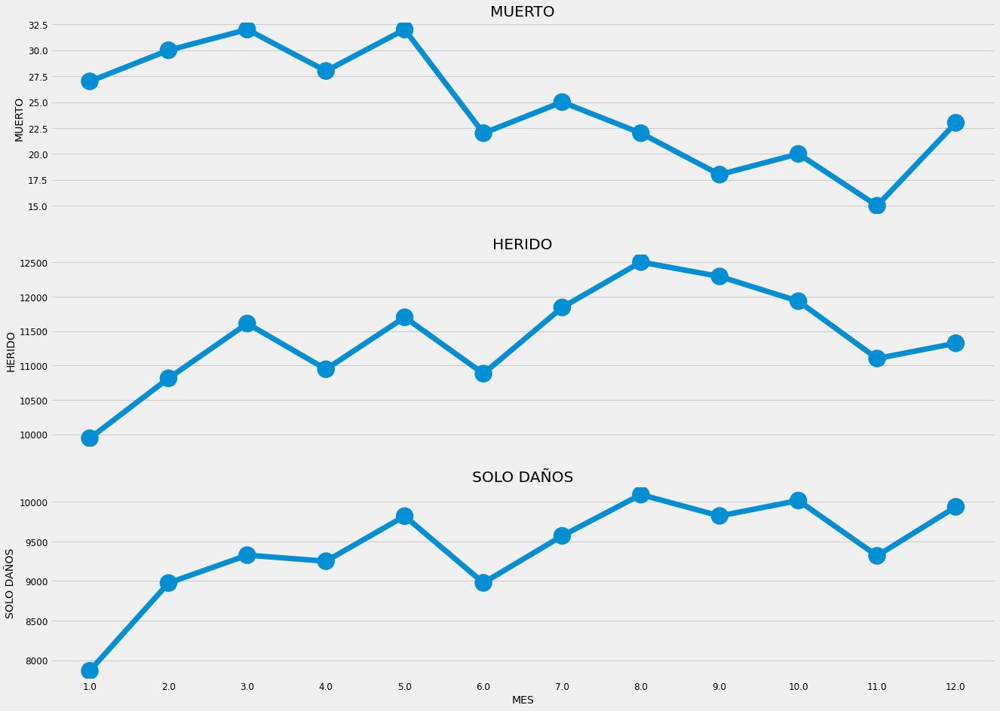

In [184]:
fig, ejes = plt.subplots(3, 1, figsize=(20, 15), sharex=True)
for nombre, eje in zip(['MUERTO','HERIDO','SOLO DAÑOS'], ejes):
#     sns.barplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.boxenplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.boxplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.clustermap(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.lineplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
    sns.pointplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.regplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.residplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.scatterplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.stripplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.swarmplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.violinplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
    eje.set_title(nombre)
    if eje != ejes[-1]:
        eje.set_xlabel('')

In [127]:
incidentes_gravedad_mes = incidentes\
                            .where(filtro)\
                            .pivot_table(index='GRAVEDAD', 
                                           columns=['PERIODO','MES'], 
                                           values='OBJECTID', 
                                           aggfunc='count', 
                                           fill_value=0
                                        )\
                            .T\
                            .sort_index()
incidentes_gravedad_mes.reset_index(inplace=True)

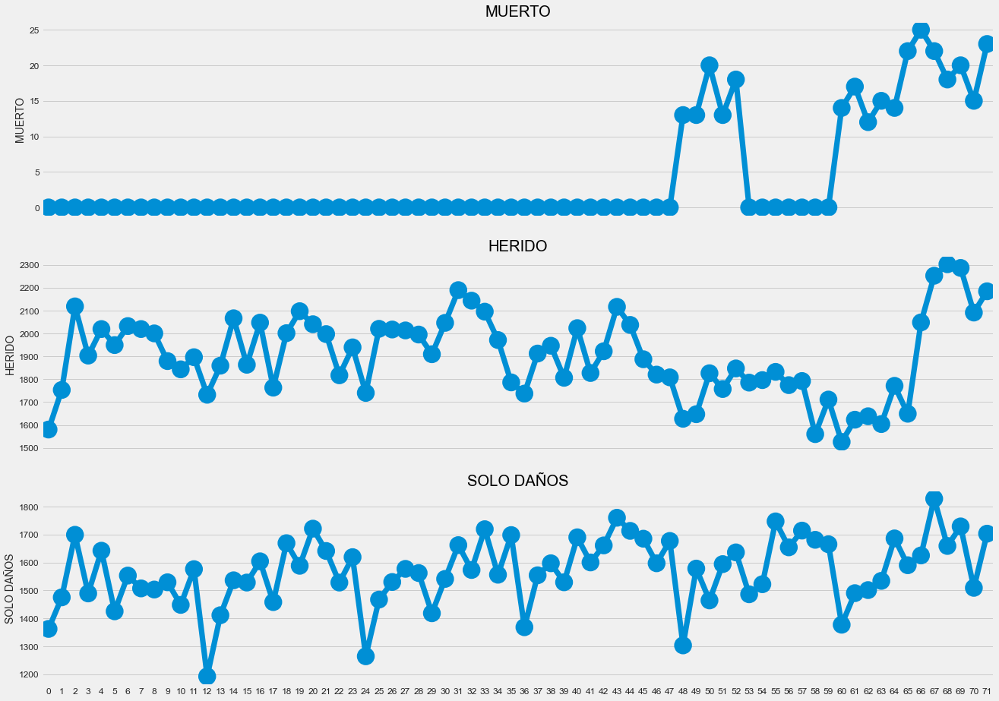

In [128]:
fig, ejes = plt.subplots(3, 1, figsize=(20, 15), sharex=True)
for nombre, eje in zip(['MUERTO','HERIDO','SOLO DAÑOS'], ejes):
#     sns.lineplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
    sns.pointplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.regplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.residplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.scatterplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.stripplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)
#     sns.swarmplot(data=incidentes_gravedad_mes,x=incidentes_gravedad_mes.index,y=nombre,ax=eje)

    eje.set_title(nombre)
    if eje != ejes[-1]:
        eje.set_xlabel('')

In [129]:
incidentes_group = pd.DataFrame(incidentes
                                .groupby(['DIA','MES','PERIODO'])['OBJECTID']
                                .count()
                                .rename('registros')
                               ).reset_index()
# incidentes_group

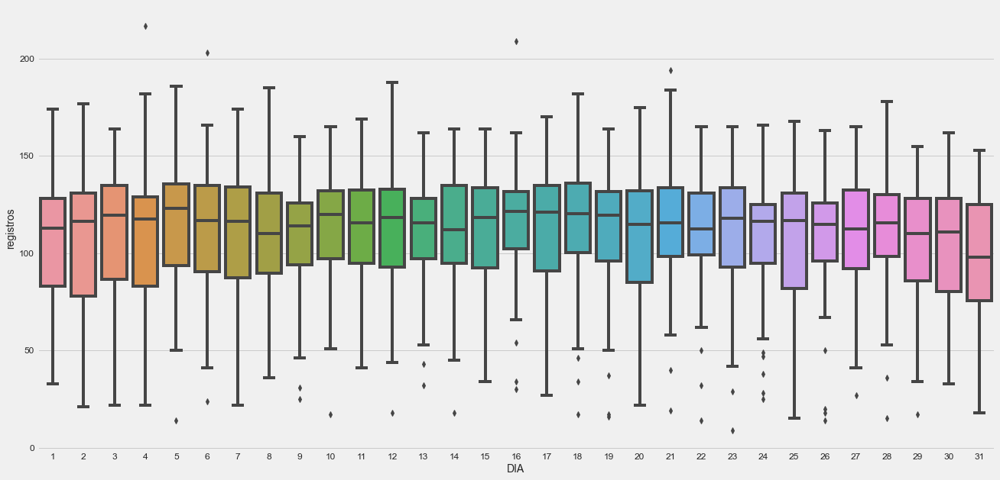

In [130]:
sns.boxplot(data=incidentes_group, x='DIA', y='registros')

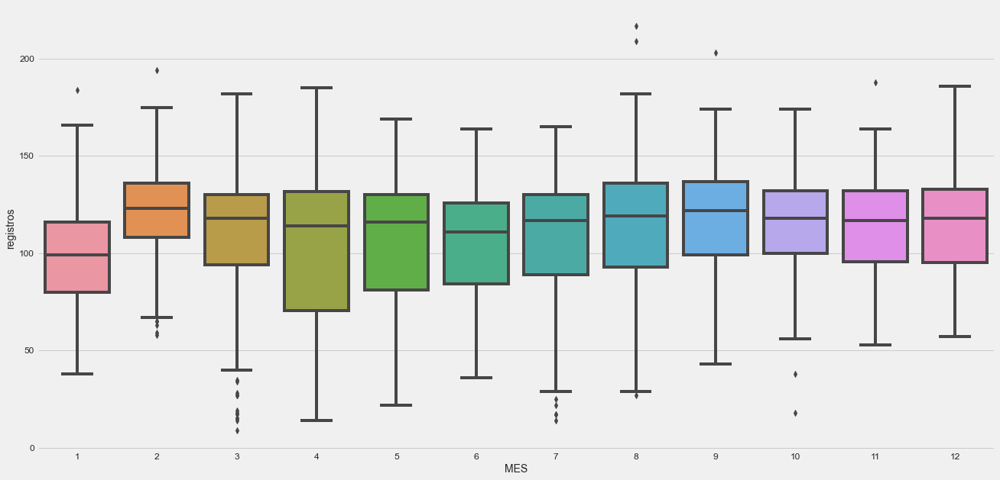

In [131]:
sns.boxplot(data=incidentes_group, x='MES', y='registros')

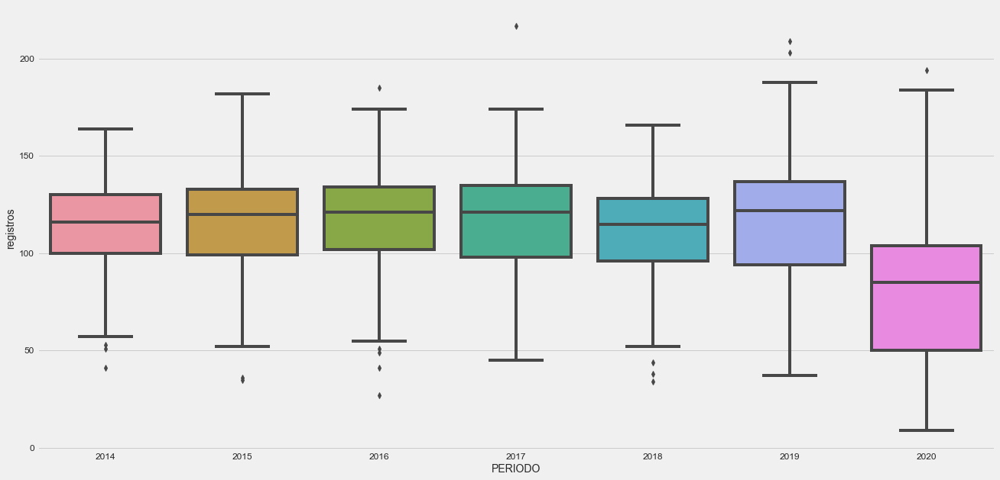

In [132]:
sns.boxplot(data=incidentes_group, x='PERIODO', y='registros')

### Ventanas deslizantes (tendencias)

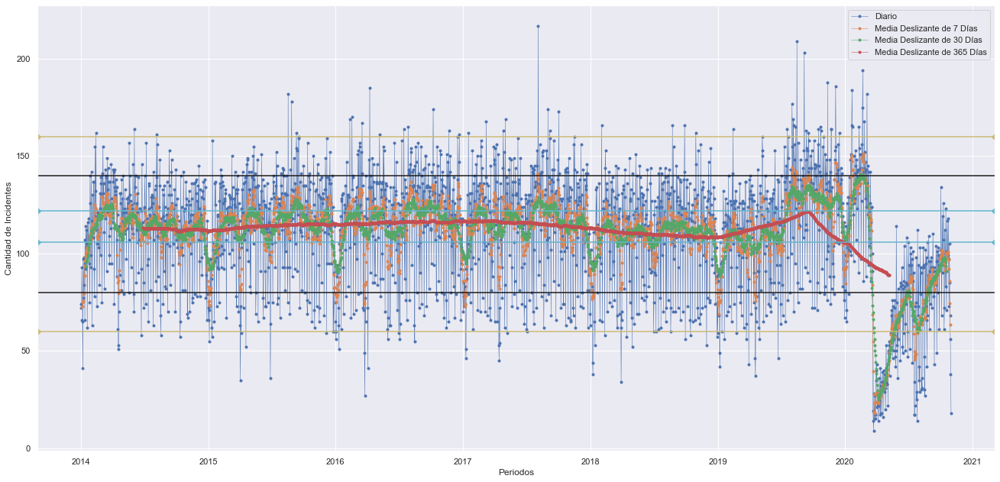

In [133]:
sns.set(rc={'figure.figsize':(20, 10)})


incidentes_semanal = incidentes_day[['OBJECTID']].resample('W').mean()
incidentes_7d = incidentes_day[['OBJECTID']].rolling(7, center=True).mean()
incidentes_30d = incidentes_day[['OBJECTID']].rolling(window=30,center=True,min_periods=30).mean()
incidentes_365d = incidentes_day[['OBJECTID']].rolling(window=365,center=True,min_periods=360).mean()

inicio, final='2014-01','2020-12'
fig, eje = plt.subplots()

eje.plot(incidentes_day.loc[inicio:final, 'OBJECTID']   ,marker='.',linestyle='-', linewidth=0.5,label='Diario')
# eje.plot(incidentes_semanal.loc[inicio:final,'OBJECTID'],marker='o',linestyle='-', linewidth=0.5,label='Media Semanal')
eje.plot(incidentes_7d.loc[inicio:final,'OBJECTID']     ,marker='.',linestyle='-', linewidth=0.5,label='Media Deslizante de 7 Días')
eje.plot(incidentes_30d.loc[inicio:final,'OBJECTID']    ,marker='.',linestyle='-', linewidth=0.5,label='Media Deslizante de 30 Días')
eje.plot(incidentes_365d.loc[inicio:final,'OBJECTID']   ,marker='.',linestyle='-', linewidth=0.5,label='Media Deslizante de 365 Días')

eje.set_ylabel('Cantidad de Incidentes')
eje.set_xlabel('Periodos')
eje.legend()

plt.axhline(y=140, color='k', linestyle='-')
plt.axhline(y=80, color='k', linestyle='-')

plt.axhline(y=106, color='c', linestyle='-', marker='D', linewidth=1.5)
plt.axhline(y=122, color='c', linestyle='-', marker='D', linewidth=1.5)

plt.axhline(y=60, color='y', linestyle='-', marker='D', linewidth=1.5)
plt.axhline(y=160, color='y', linestyle='-', marker='D', linewidth=1.5)

En la gráfica anterior podemos ver que la media deslizante de 365 días es una **tendencia estacionaria**.

Podemos visualizar nuestros datos utilizando un método llamado descomposición de series de tiempo que nos permite descomponer nuestra serie de tiempo en tres componentes distintos: **tendencia**, **estacionalidad** y **ruido**.

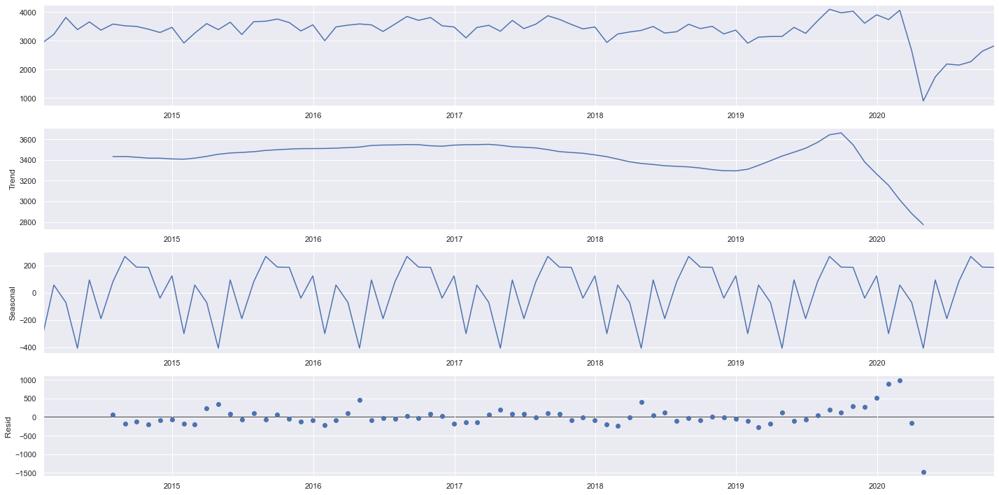

In [134]:
# incidentes_day2 = incidentes_day.loc['2014':'2019'] # Omitir el año 2020 por lo inconsistente por la pandemia covid-19
incidentes_day2 = incidentes_mon
decomposition = sm.tsa.seasonal_decompose(incidentes_day2, model='additive')
fig = decomposition.plot()
plt.show()

### Método ARIMA
El modelo esta compuesto por tres parámetros que tienen en cuenta **la estacionalidad**, **la tendencia** y **el ruido** en los datos:

In [135]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Ejemplos de combinaciones de parámetros para el método ARIMA ...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Ejemplos de combinaciones de parámetros para el método ARIMA ...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


La selección de parámetros para el modelo de serie temporal **ARIMA** de incidentes de transito. El objetivo aquí es utilizar una "**búsqueda de cuadrícula**" para encontrar el conjunto óptimo de parámetros que produzca el mejor rendimiento para el modelo.

In [136]:
minimo = 99999999999999999999
result = ''
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:            
            mod = sm.tsa.statespace.SARIMAX(incidentes_day2,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()      
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
            if results.aic < minimo:
                minimo = results.aic
                result = 'ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic)
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1549.1749407970162
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:1237.594605325495
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:1074.3735117687295
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:896.3980916253968
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:1086.9007626848936
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1076.867852384675
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:902.941472605114
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:889.6503316474099
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:1474.6088240133906
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:1144.6659237190395
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:1011.06752711704
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:837.7484118716241
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:1037.6925081174438
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:1009.4656238173105
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:866.4400046284766
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:837.2905842340815
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:1179.4772130119222
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:1000.117404339962
ARIM

Saber cual es valor AIC menor

In [137]:
print("El resultado anterior sugiere que {} produce el valor AIC más bajo.\nPor lo tanto, debemos considerar que esta es la opción óptima.".format(result))

El resultado anterior sugiere que ARIMA(0, 1, 1)x(0, 1, 1, 12)12 - AIC:809.0860253029524 produce el valor AIC más bajo.
Por lo tanto, debemos considerar que esta es la opción óptima.


El resultado anterior sugiere que SARIMAX (1, 1, 1) x (1, 1, 1, 12) produce el valor AIC más bajo de 20,242.94883335079. Por lo tanto, debemos considerar que esta es la opción óptima.

### Fitting the ARIMA model (Ajustar el modelo ARIMA)

In [139]:
mod = sm.tsa.statespace.SARIMAX(incidentes_day2,
                                order=(0, 1, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3662      0.089      4.123      0.000       0.192       0.540
ma.S.L12      -0.4800      0.428     -1.122      0.262      -1.319       0.359
sigma2      1.275e+05   1.35e+04      9.462      0.000    1.01e+05    1.54e+05


Siempre debemos ejecutar diagnósticos del modelo para investigar cualquier comportamiento inusual.

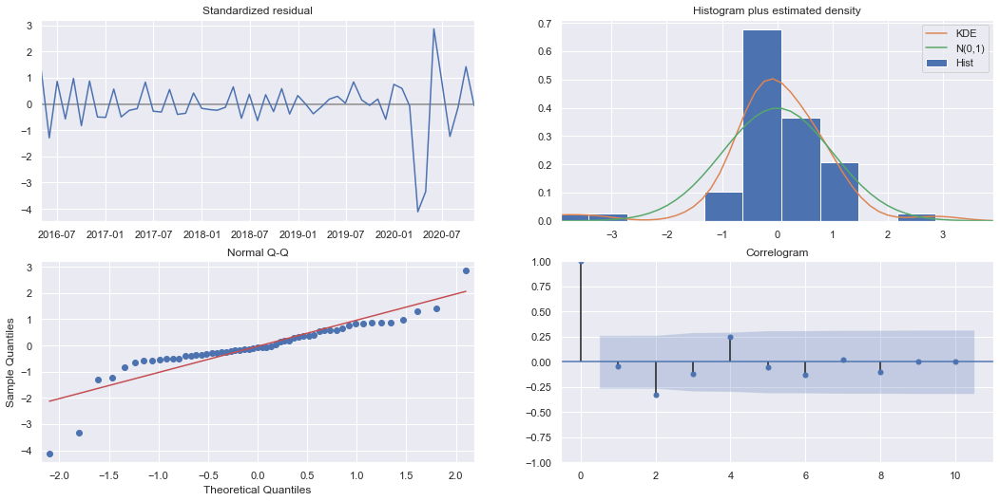

In [140]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

No es perfecto, sin embargo, el diagnóstico de nuestro modelo sugiere que los residuos del modelo están distribuidos casi normalmente.

### Validating forecasts (Validando pronósticos)

Para ayudarnos a comprender la precisión de nuestros pronósticos, comparamos las ventas pronosticadas con las ventas reales de la serie temporal y establecemos los pronósticos para que comiencen en 2019–01–01 hasta el final de los datos.

In [141]:
incidentes_day2.head(90)

,OBJECTID
Fecha_Hora,
2014-01-31,2942
2014-02-28,3228
2014-03-31,3817
2014-04-30,3392
2014-05-31,3661
...,...
2020-06-30,2191
2020-07-31,2152
2020-08-31,2270


In [142]:
date_predict = '2020-01-31'

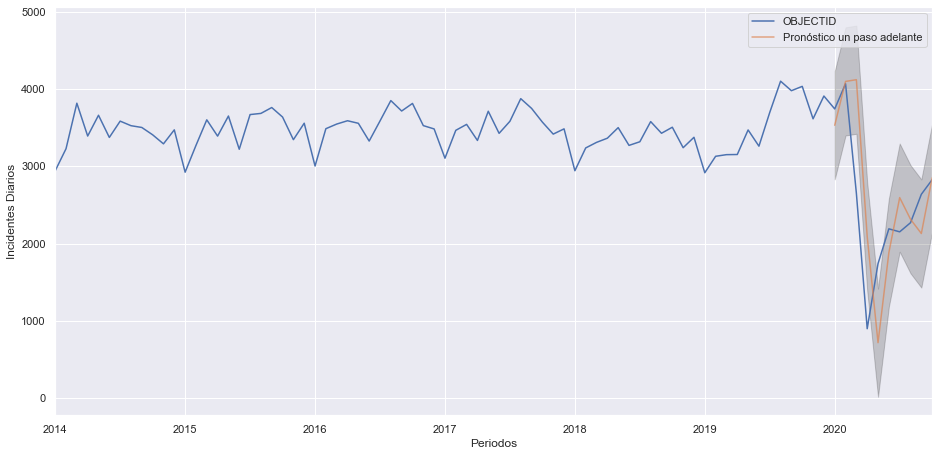

In [143]:
pred = results.get_prediction(start=pd.to_datetime(date_predict), dynamic=False)
pred_ci = pred.conf_int()
ax = incidentes_day2['2014':].plot(label='Incidentes')
pred.predicted_mean.plot(ax=ax, label='Pronóstico un paso adelante', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Periodos')
ax.set_ylabel('Incidentes Diarios')
plt.legend()
plt.show()

In [144]:
y_forecasted = pd.DataFrame(pred.predicted_mean)
y_forecasted.rename(columns={0:'valor'}, inplace=True)

y_truth = incidentes_day2[date_predict:]
y_truth.rename(columns={'OBJECTID':'valor'}, inplace=True)

mse = ((y_forecasted - y_truth) ** 2).mean()
print('MSE -> El error cuadrático medio de nuestros pronósticos es de {}'.format(round(mse[0], 2)))

MSE -> El error cuadrático medio de nuestros pronósticos es de 522743.93


In [145]:
print('RMSE -> El error de media cuadrática de nuestras pronósticos es de {}'.format(round(np.sqrt(mse[0]), 2)))

RMSE -> El error de media cuadrática de nuestras pronósticos es de 723.01


- El (**MSE**) es una medida de la calidad de un estimador; siempre es no negativo, y en cuanto más pequeño es el MSE, más cerca estamos de encontrar la línea de mejor ajuste.

- El error cuadrático medio (**RMSE**) nos dice que nuestro modelo pudo pronosticar los incidentes automovilisticos diarios promedio en el conjunto de prueba dentro de 26.45 de los incidentes reales. Los incidentes diarios de muebles oscilan entre 70 y más de 130. En mi opinión, este es un modelo bastante bueno hasta ahora.

### Producing and visualizing forecasts (Producir y visualizar pronósticos)

In [146]:
incidentes_day2.rename(columns={'OBJECTID':'incidentes'}, inplace=True)
incidentes_day2[(incidentes_day2['incidentes'] > 50) & (incidentes_day2['incidentes'] < 175)]

,incidentes
Fecha_Hora,


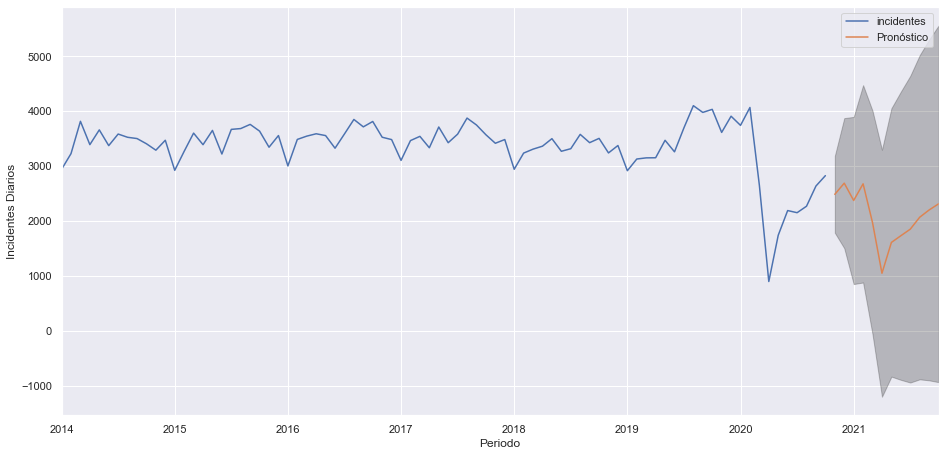

In [147]:
pred_uc = results.get_forecast(steps=12)
pred_ci = pred_uc.conf_int()
ax = incidentes_day2.plot(label='observed', figsize=(14, 7))
pred_uc.predicted_mean.plot(ax=ax, label='Pronóstico')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Periodo')
ax.set_ylabel('Incidentes Diarios')
plt.legend()
plt.show()

*****

# Memoria del Jupyter

In [ ]:
import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)

# otros scripts

In [ ]:
idx = pd.date_range(freq="h", start="2018-01-01", periods=365*24)
df = pd.DataFrame({'value': np.random.rand(365*24)}, index=idx)
df

In [ ]:
# df_pivot_año_mes.loc[df_pivot_año_mes.index == 2]
df_pivot_año_mes.loc[slice(None),slice(2014)]

In [ ]:
# df_pivot_año_mes.query('ilevel_1 == 2014')

In [ ]:
df_pivot = incidentes.pivot_table(index='DIA', columns=['PERIODO','MES'], values='OBJECTID', aggfunc='count', fill_value=0)

In [ ]:
type(df_pivot)

In [ ]:
df_pivot.plot()

In [ ]:
df_pivot_año_mes = incidentes.pivot_table(index='MES', columns=['PERIODO'], values='OBJECTID', aggfunc='count', fill_value=0)

In [ ]:
incidentes.groupby(['PERIODO', pd.Grouper(key='FECHA', freq='A-DEC')])['OBJECTID'].sum()

In [ ]:
incidentes[['FECHA','OBJECTID']].agg({'FECHA':['count'],'OBJECTID':['sum','mean']})

In [ ]:
df_i[['Fecha_Hora','OBJECTID']].agg({'Fecha_Hora':['count'],'OBJECTID':['sum']})

In [ ]:
df_count = df_i.groupby(['Fecha_Hora']).agg({'Fecha_Hora':['count']})

In [229]:
# Resaltar el mayor valor por cada fila del data set resumen
incidentes.pivot_table(index='PERIODO', 
                       columns=['CLASE'], 
                       values='OBJECTID', 
                       aggfunc='count', 
                       fill_value=0).T\
.style.bar(subset=[2014,2015,2016,2017,2018,2019,2020], color=['#d65f5f', '#5fba7d'],axis=0)

PERIODO,2014,2015,2016,2017,2018,2019,2020
CLASE,,,,,,,
Atropello,4647,4340,4038,3536,3497,3971,2298
Caída de Ocupante,4117,3664,3657,3422,3603,3518,2003
Choque,26978,28073,28460,29029,28064,28808,15894
Incendio,8,1,4,4,7,8,3
Otro,4490,4209,4854,4711,3733,4510,3013
Volcamiento,959,1429,1478,1570,1171,1607,1970
